In [62]:
import pandas as pd
import jieba
import jieba.analyse
import re
from wordcloud import WordCloud
import matplotlib.pyplot as plt
import matplotlib.font_manager as fm
from matplotlib.colors import Colormap
%matplotlib inline

設定字體

In [63]:
plt.rcParams['font.size'] = 14

plt.rcParams['font.sans-serif'] = ['Microsoft JhengHei'] # Windows 中文字體

FontPath = 'raw_data/SourceHanSansTW-Regular.otf' # 設定字型

時間:2023/1/1 ~ 2025/3/19

資料筆數 : 388

資料來源 : ptt八卦版、電影版

關鍵字 : 進擊的巨人

In [64]:
df = pd.read_csv("./raw_data/merge.csv")
#total_rows = len(df)
#print(f"總共有 {total_rows}")
df["artDate"] = pd.to_datetime(df["artDate"])
df['artDate'] = df['artDate'].dt.date
df.head()
#df['artDate'] = df['artDate'].dt.date


,system_id,artUrl,artTitle,artDate,artPoster,artCatagory,artContent,artComment,e_ip,insertedDate,dataSource
0,1,https://www.ptt.cc/bbs/movie/M.1676932822.A.13...,[爆好雷]必看！鬼滅之刃：上弦集結，前進刀匠村,2023-02-21,toebb,movie,先說我不是很資深鬼滅之刃的鐵粉，\n單純喜歡這部作品的故事與作畫，\n我最愛的作品是《進擊的...,"[{""cmtStatus"": ""推"", ""cmtPoster"": ""yayappp"", ""c...",42.74.120.9,2023/2/23 02:12,ptt
1,2,https://www.ptt.cc/bbs/movie/M.1676944836.A.AE...,Re:[請益]漫威系列是出了啥問題,2023-02-21,moshenisshit,movie,單純只是一系列結束，\n\n沒辦法再用這個宇宙創造什麼新玩法吧，\n\n幾年前《無限傳奇篇》...,"[{""cmtStatus"": ""推"", ""cmtPoster"": ""Luos"", ""cmtC...",136.23.35.39,2023/2/23 02:12,ptt
2,3,https://www.ptt.cc/bbs/movie/M.1678101798.A.1D...,[好雷]拖到現在才看的灌籃高手,2023-03-06,walkmaster,movie,雷文防雷資訊頁\n\n\n\n~*-*~*-*~*-*~*-*~*-*~*-*~*-*~*-...,"[{""cmtStatus"": ""推"", ""cmtPoster"": ""cashko"", ""cm...",61.228.209.193,2023/3/7 02:07,ptt
3,4,https://www.ptt.cc/bbs/movie/M.1678888141.A.B8...,[情報]《鏡之孤城》正式預告,2023-03-15,godofsex,movie,書店大賞史上最高票奇幻神作改編\n\n《\n鏡之孤城\n》3/31(五)感動獻映\nhttp...,"[{""cmtStatus"": ""→"", ""cmtPoster"": ""GeogeBye"", ""...",101.12.103.254,2023/3/16 02:11,ptt
4,5,https://www.ptt.cc/bbs/movie/M.1679029659.A.01...,[情報]鈴芽之旅國語配音版3/17上映,2023-03-17,ashin0709,movie,https://reurl.cc/GejO6d\n【鈴芽之旅】台灣配音老師公開！\n這是 #...,"[{""cmtStatus"": ""推"", ""cmtPoster"": ""tsukirit"", ""...",42.79.187.53,2023/3/18 02:20,ptt


In [65]:
clear_df = df.copy()

#去除本次不會用到的欄位
drop_cols = ['system_id', 'artPoster', 'artCatagory', 'artComment', 'e_ip', 'insertedDate', 'dataSource']
clear_df.drop(drop_cols, axis = 1, inplace = True)

#去除文章內容為空值的筆數
clear_df.dropna(subset = ['artContent'], axis=0, how='any', inplace=True)

#新增['sentence']欄位，用'。'取代'\n\n'，並移除'\n'
clear_df['sentence'] = clear_df['artContent'].str.replace(r'\n\n','。', regex=True)
clear_df['sentence'] = clear_df['sentence'].str.replace(r'\n','，', regex=True)

#移除內文中的網址
clear_df['sentence'] = clear_df['sentence'].replace(r'http\S+', '', regex=True).replace(r'www\S+', '', regex=True)

clear_df.head(10)

,artUrl,artTitle,artDate,artContent,sentence
0,https://www.ptt.cc/bbs/movie/M.1676932822.A.13...,[爆好雷]必看！鬼滅之刃：上弦集結，前進刀匠村,2023-02-21,先說我不是很資深鬼滅之刃的鐵粉，\n單純喜歡這部作品的故事與作畫，\n我最愛的作品是《進擊的...,先說我不是很資深鬼滅之刃的鐵粉，，單純喜歡這部作品的故事與作畫，，我最愛的作品是《進擊的巨人...
1,https://www.ptt.cc/bbs/movie/M.1676944836.A.AE...,Re:[請益]漫威系列是出了啥問題,2023-02-21,單純只是一系列結束，\n\n沒辦法再用這個宇宙創造什麼新玩法吧，\n\n幾年前《無限傳奇篇》...,單純只是一系列結束，。沒辦法再用這個宇宙創造什麼新玩法吧，。幾年前《無限傳奇篇》迎來大結局，...
2,https://www.ptt.cc/bbs/movie/M.1678101798.A.1D...,[好雷]拖到現在才看的灌籃高手,2023-03-06,雷文防雷資訊頁\n\n\n\n~*-*~*-*~*-*~*-*~*-*~*-*~*-*~*-...,雷文防雷資訊頁。。~*-*~*-*~*-*~*-*~*-*~*-*~*-*~*-*~*-*~...
3,https://www.ptt.cc/bbs/movie/M.1678888141.A.B8...,[情報]《鏡之孤城》正式預告,2023-03-15,書店大賞史上最高票奇幻神作改編\n\n《\n鏡之孤城\n》3/31(五)感動獻映\nhttp...,書店大賞史上最高票奇幻神作改編。《，鏡之孤城，》3/31(五)感動獻映， Pictures傾...
4,https://www.ptt.cc/bbs/movie/M.1679029659.A.01...,[情報]鈴芽之旅國語配音版3/17上映,2023-03-17,https://reurl.cc/GejO6d\n【鈴芽之旅】台灣配音老師公開！\n這是 #...,#新海誠 導演的電影在台首次上映國語配音版本，希望能將作品帶給更多不同年齡層的觀眾，不論是...
5,https://www.ptt.cc/bbs/movie/M.1682426103.A.29...,Re:[情報]環球FB超級瑪利歐日本語吹替版5/5,2023-04-25,日本聲優陣容\n\n瑪利歐 宮野真守 (鋼彈00、死亡筆記本、FINAL FANTASY X...,日本聲優陣容。瑪利歐 宮野真守 (鋼彈00、死亡筆記本、FINAL FANTASY XV)。...
6,https://www.ptt.cc/bbs/movie/M.1684119899.A.2D...,[討論]靈異教師神眉真人電影有搞頭嗎？,2023-05-15,神眉算是日本奇幻類漫畫，同性質的真人還有寄生獸真人電影跟進擊的巨人真人電影。\n如果要拍成真...,神眉算是日本奇幻類漫畫，同性質的真人還有寄生獸真人電影跟進擊的巨人真人電影。，如果要拍成真人...
7,https://www.ptt.cc/bbs/movie/M.1686772523.A.B0...,[好雷]閃電俠，想到某部日本動漫,2023-06-15,防雷\n\n\n\n\n\n\n\n\n\n\n\n\n\n\n\n\n\n\n\n\n\n...,防雷。。。。。。。。。。。。。。～～～雷文 主文分隔線～～～。，不知道有沒有版友，同樣也想起...
8,https://www.ptt.cc/bbs/movie/M.1686890261.A.C6...,Re:[新聞]安迪馬希提確認為岡恩宇宙蝙蝠俠電影導演,2023-06-16,"說到這個，安迪馬希提手上那個""進擊的巨人""決定不開機了嗎?\n\n他不是已經說好閃電俠弄完，...","說到這個，安迪馬希提手上那個""進擊的巨人""決定不開機了嗎?。他不是已經說好閃電俠弄完，要先來..."
9,https://www.ptt.cc/bbs/movie/M.1687950137.A.99...,[好雷]蜘蛛人穿越新宇宙－“反派”太正確,2023-06-28,蜘蛛人新宇宙是我看過最好看的動畫電影，也是我最喜歡的超級英雄電影。當我看到這部\n片要有續集...,蜘蛛人新宇宙是我看過最好看的動畫電影，也是我最喜歡的超級英雄電影。當我看到這部，片要有續集的...


進行斷句

In [66]:
clear_df['sentence'] = clear_df['sentence'].str.split("[,，。！!？?]{1,}")

sent_df = clear_df.explode('sentence').reset_index(drop=True)

sent_df.head(10)

,artUrl,artTitle,artDate,artContent,sentence
0,https://www.ptt.cc/bbs/movie/M.1676932822.A.13...,[爆好雷]必看！鬼滅之刃：上弦集結，前進刀匠村,2023-02-21,先說我不是很資深鬼滅之刃的鐵粉，\n單純喜歡這部作品的故事與作畫，\n我最愛的作品是《進擊的...,先說我不是很資深鬼滅之刃的鐵粉
1,https://www.ptt.cc/bbs/movie/M.1676932822.A.13...,[爆好雷]必看！鬼滅之刃：上弦集結，前進刀匠村,2023-02-21,先說我不是很資深鬼滅之刃的鐵粉，\n單純喜歡這部作品的故事與作畫，\n我最愛的作品是《進擊的...,單純喜歡這部作品的故事與作畫
2,https://www.ptt.cc/bbs/movie/M.1676932822.A.13...,[爆好雷]必看！鬼滅之刃：上弦集結，前進刀匠村,2023-02-21,先說我不是很資深鬼滅之刃的鐵粉，\n單純喜歡這部作品的故事與作畫，\n我最愛的作品是《進擊的...,我最愛的作品是《進擊的巨人》
3,https://www.ptt.cc/bbs/movie/M.1676932822.A.13...,[爆好雷]必看！鬼滅之刃：上弦集結，前進刀匠村,2023-02-21,先說我不是很資深鬼滅之刃的鐵粉，\n單純喜歡這部作品的故事與作畫，\n我最愛的作品是《進擊的...,是巨人鑽石粉（沒人想知道 XDDD）
4,https://www.ptt.cc/bbs/movie/M.1676932822.A.13...,[爆好雷]必看！鬼滅之刃：上弦集結，前進刀匠村,2023-02-21,先說我不是很資深鬼滅之刃的鐵粉，\n單純喜歡這部作品的故事與作畫，\n我最愛的作品是《進擊的...,當初看了2個月前的預告之後
5,https://www.ptt.cc/bbs/movie/M.1676932822.A.13...,[爆好雷]必看！鬼滅之刃：上弦集結，前進刀匠村,2023-02-21,先說我不是很資深鬼滅之刃的鐵粉，\n單純喜歡這部作品的故事與作畫，\n我最愛的作品是《進擊的...,就知道了是〈遊郭篇〉第10-11集
6,https://www.ptt.cc/bbs/movie/M.1676932822.A.13...,[爆好雷]必看！鬼滅之刃：上弦集結，前進刀匠村,2023-02-21,先說我不是很資深鬼滅之刃的鐵粉，\n單純喜歡這部作品的故事與作畫，\n我最愛的作品是《進擊的...,與〈刀匠村〉的 TV 版合輯
7,https://www.ptt.cc/bbs/movie/M.1676932822.A.13...,[爆好雷]必看！鬼滅之刃：上弦集結，前進刀匠村,2023-02-21,先說我不是很資深鬼滅之刃的鐵粉，\n單純喜歡這部作品的故事與作畫，\n我最愛的作品是《進擊的...,想看這一部的人
8,https://www.ptt.cc/bbs/movie/M.1676932822.A.13...,[爆好雷]必看！鬼滅之刃：上弦集結，前進刀匠村,2023-02-21,先說我不是很資深鬼滅之刃的鐵粉，\n單純喜歡這部作品的故事與作畫，\n我最愛的作品是《進擊的...,可以先把9集的〈遊郭篇〉
9,https://www.ptt.cc/bbs/movie/M.1676932822.A.13...,[爆好雷]必看！鬼滅之刃：上弦集結，前進刀匠村,2023-02-21,先說我不是很資深鬼滅之刃的鐵粉，\n單純喜歡這部作品的故事與作畫，\n我最愛的作品是《進擊的...,看完再進電影院觀看


匯入斷詞字典

In [67]:
jieba.set_dictionary('dict/dict.txt')

自訂義新增斷詞

In [68]:
jieba.add_word('進擊的巨人')
jieba.add_word('超大型巨人')
jieba.add_word('鎧之巨人')
jieba.add_word('盔甲巨人')
jieba.add_word('帥之巨人')
jieba.add_word('女巨人')
jieba.add_word('獸之巨人')
jieba.add_word('顎之巨人')
jieba.add_word('戰錘巨人')
jieba.add_word('車力巨人')
jieba.add_word('始祖巨人')
jieba.add_word('阿爾敏')
jieba.add_word('調查兵團')
jieba.add_word('調查軍團')
jieba.add_word('駐紮兵團')
jieba.add_word('駐紮軍團')
jieba.add_word('憲兵團')
jieba.add_word('立體機動裝置')
jieba.add_word('自由之翼')
jieba.add_word('不足以')
jieba.add_word('LAST ATTACK')
jieba.add_word('世界觀')
jieba.add_word('地鳴')

Building prefix dict from c:\Users\k7256\Desktop\SMA_2025S-main\week4讀書會\dict\dict.txt ...
Loading model from cache C:\Users\k7256\AppData\Local\Temp\jieba.ud0b6ae7063e46da7b6c1f88e8ae13a7f.cache
Loading model cost 0.371 seconds.
Prefix dict has been built successfully.


In [69]:
#去除句子中除了字母、數字、空白字符以外的符號
sent_df['sentence'] = sent_df['sentence'].str.replace(r'[^\w\s]+', '', regex=True).astype(str)

# 把長度小於1的sentence刪掉
sent_df = sent_df[sent_df["sentence"].str.len() > 1]

sent_df.head(10)

,artUrl,artTitle,artDate,artContent,sentence
0,https://www.ptt.cc/bbs/movie/M.1676932822.A.13...,[爆好雷]必看！鬼滅之刃：上弦集結，前進刀匠村,2023-02-21,先說我不是很資深鬼滅之刃的鐵粉，\n單純喜歡這部作品的故事與作畫，\n我最愛的作品是《進擊的...,先說我不是很資深鬼滅之刃的鐵粉
1,https://www.ptt.cc/bbs/movie/M.1676932822.A.13...,[爆好雷]必看！鬼滅之刃：上弦集結，前進刀匠村,2023-02-21,先說我不是很資深鬼滅之刃的鐵粉，\n單純喜歡這部作品的故事與作畫，\n我最愛的作品是《進擊的...,單純喜歡這部作品的故事與作畫
2,https://www.ptt.cc/bbs/movie/M.1676932822.A.13...,[爆好雷]必看！鬼滅之刃：上弦集結，前進刀匠村,2023-02-21,先說我不是很資深鬼滅之刃的鐵粉，\n單純喜歡這部作品的故事與作畫，\n我最愛的作品是《進擊的...,我最愛的作品是進擊的巨人
3,https://www.ptt.cc/bbs/movie/M.1676932822.A.13...,[爆好雷]必看！鬼滅之刃：上弦集結，前進刀匠村,2023-02-21,先說我不是很資深鬼滅之刃的鐵粉，\n單純喜歡這部作品的故事與作畫，\n我最愛的作品是《進擊的...,是巨人鑽石粉沒人想知道 XDDD
4,https://www.ptt.cc/bbs/movie/M.1676932822.A.13...,[爆好雷]必看！鬼滅之刃：上弦集結，前進刀匠村,2023-02-21,先說我不是很資深鬼滅之刃的鐵粉，\n單純喜歡這部作品的故事與作畫，\n我最愛的作品是《進擊的...,當初看了2個月前的預告之後
5,https://www.ptt.cc/bbs/movie/M.1676932822.A.13...,[爆好雷]必看！鬼滅之刃：上弦集結，前進刀匠村,2023-02-21,先說我不是很資深鬼滅之刃的鐵粉，\n單純喜歡這部作品的故事與作畫，\n我最愛的作品是《進擊的...,就知道了是遊郭篇第1011集
6,https://www.ptt.cc/bbs/movie/M.1676932822.A.13...,[爆好雷]必看！鬼滅之刃：上弦集結，前進刀匠村,2023-02-21,先說我不是很資深鬼滅之刃的鐵粉，\n單純喜歡這部作品的故事與作畫，\n我最愛的作品是《進擊的...,與刀匠村的 TV 版合輯
7,https://www.ptt.cc/bbs/movie/M.1676932822.A.13...,[爆好雷]必看！鬼滅之刃：上弦集結，前進刀匠村,2023-02-21,先說我不是很資深鬼滅之刃的鐵粉，\n單純喜歡這部作品的故事與作畫，\n我最愛的作品是《進擊的...,想看這一部的人
8,https://www.ptt.cc/bbs/movie/M.1676932822.A.13...,[爆好雷]必看！鬼滅之刃：上弦集結，前進刀匠村,2023-02-21,先說我不是很資深鬼滅之刃的鐵粉，\n單純喜歡這部作品的故事與作畫，\n我最愛的作品是《進擊的...,可以先把9集的遊郭篇
9,https://www.ptt.cc/bbs/movie/M.1676932822.A.13...,[爆好雷]必看！鬼滅之刃：上弦集結，前進刀匠村,2023-02-21,先說我不是很資深鬼滅之刃的鐵粉，\n單純喜歡這部作品的故事與作畫，\n我最愛的作品是《進擊的...,看完再進電影院觀看


進行斷詞

In [70]:
word_df = sent_df.assign(word = sent_df['sentence'].apply(jieba.lcut)).explode('word').drop(['sentence'], axis=1)

# 去除空值
word_df = word_df.dropna(subset=['word'])

# word_df = word_df.loc[word_df['word'].str.len() > 1]

word_df.head(10)

,artUrl,artTitle,artDate,artContent,word
0,https://www.ptt.cc/bbs/movie/M.1676932822.A.13...,[爆好雷]必看！鬼滅之刃：上弦集結，前進刀匠村,2023-02-21,先說我不是很資深鬼滅之刃的鐵粉，\n單純喜歡這部作品的故事與作畫，\n我最愛的作品是《進擊的...,先說
0,https://www.ptt.cc/bbs/movie/M.1676932822.A.13...,[爆好雷]必看！鬼滅之刃：上弦集結，前進刀匠村,2023-02-21,先說我不是很資深鬼滅之刃的鐵粉，\n單純喜歡這部作品的故事與作畫，\n我最愛的作品是《進擊的...,我
0,https://www.ptt.cc/bbs/movie/M.1676932822.A.13...,[爆好雷]必看！鬼滅之刃：上弦集結，前進刀匠村,2023-02-21,先說我不是很資深鬼滅之刃的鐵粉，\n單純喜歡這部作品的故事與作畫，\n我最愛的作品是《進擊的...,不是
0,https://www.ptt.cc/bbs/movie/M.1676932822.A.13...,[爆好雷]必看！鬼滅之刃：上弦集結，前進刀匠村,2023-02-21,先說我不是很資深鬼滅之刃的鐵粉，\n單純喜歡這部作品的故事與作畫，\n我最愛的作品是《進擊的...,很
0,https://www.ptt.cc/bbs/movie/M.1676932822.A.13...,[爆好雷]必看！鬼滅之刃：上弦集結，前進刀匠村,2023-02-21,先說我不是很資深鬼滅之刃的鐵粉，\n單純喜歡這部作品的故事與作畫，\n我最愛的作品是《進擊的...,資深
0,https://www.ptt.cc/bbs/movie/M.1676932822.A.13...,[爆好雷]必看！鬼滅之刃：上弦集結，前進刀匠村,2023-02-21,先說我不是很資深鬼滅之刃的鐵粉，\n單純喜歡這部作品的故事與作畫，\n我最愛的作品是《進擊的...,鬼滅
0,https://www.ptt.cc/bbs/movie/M.1676932822.A.13...,[爆好雷]必看！鬼滅之刃：上弦集結，前進刀匠村,2023-02-21,先說我不是很資深鬼滅之刃的鐵粉，\n單純喜歡這部作品的故事與作畫，\n我最愛的作品是《進擊的...,之刃
0,https://www.ptt.cc/bbs/movie/M.1676932822.A.13...,[爆好雷]必看！鬼滅之刃：上弦集結，前進刀匠村,2023-02-21,先說我不是很資深鬼滅之刃的鐵粉，\n單純喜歡這部作品的故事與作畫，\n我最愛的作品是《進擊的...,的
0,https://www.ptt.cc/bbs/movie/M.1676932822.A.13...,[爆好雷]必看！鬼滅之刃：上弦集結，前進刀匠村,2023-02-21,先說我不是很資深鬼滅之刃的鐵粉，\n單純喜歡這部作品的故事與作畫，\n我最愛的作品是《進擊的...,鐵粉
1,https://www.ptt.cc/bbs/movie/M.1676932822.A.13...,[爆好雷]必看！鬼滅之刃：上弦集結，前進刀匠村,2023-02-21,先說我不是很資深鬼滅之刃的鐵粉，\n單純喜歡這部作品的故事與作畫，\n我最愛的作品是《進擊的...,單純


計算每個詞出現次數

In [71]:
freq_df = pd.DataFrame(word_df['word'].value_counts()).sort_values(by = ['count'], ascending = False).reset_index()
freq_df.head(10)

,word,count
0,,4607
1,的,2755
2,是,828
3,在,623
4,我,543
5,了,538
6,有,450
7,也,431
8,進擊的巨人,383
9,都,361


將上表繪製成圖

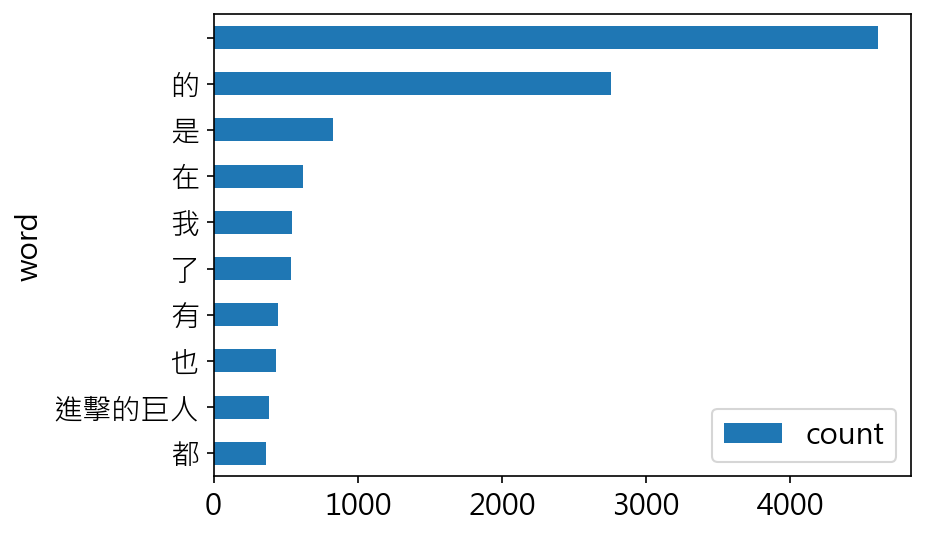

In [72]:
freq_df.head(10).plot.barh(x = 'word', y = 'count').invert_yaxis()
plt.show()

In [73]:
# wordcloud的輸入須為dict，因此先將freq_df轉換成成dict
freq_dict = freq_df.set_index('word').to_dict()
freq_dict = freq_dict['count']

print(dict(list(freq_dict.items())[:10]))

{' ': 4607, '的': 2755, '是': 828, '在': 623, '我': 543, '了': 538, '有': 450, '也': 431, '進擊的巨人': 383, '都': 361}


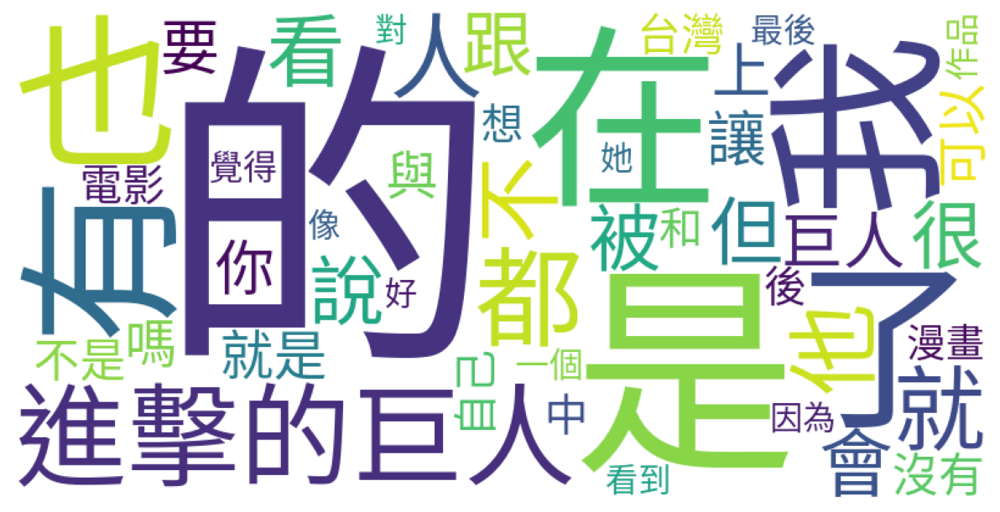

In [74]:
# 繪製文字雲
wordcloud = WordCloud(background_color = 'white', width = 800, height = 400, font_path = FontPath, max_words = 50)
wordcloud.generate_from_frequencies(freq_dict)

plt.figure(figsize = (10,7))
plt.imshow(wordcloud)
plt.axis('off')
plt.show()

保留大於1的詞

In [75]:
word_df = word_df.loc[word_df['word'].str.len() > 1]

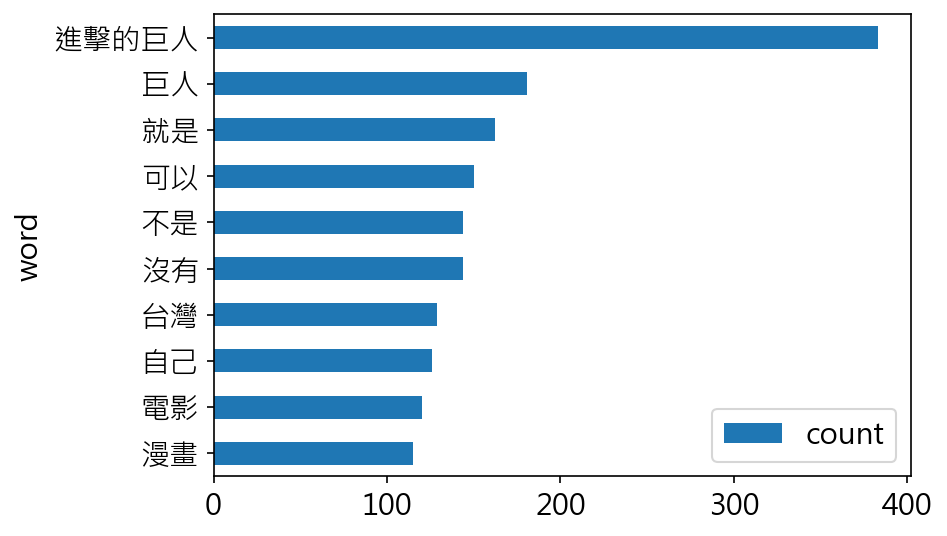

In [76]:
freq_df = pd.DataFrame(word_df['word'].value_counts()).sort_values(by = ['count'], ascending = False).reset_index()

freq_df.head(10).plot.barh(x = 'word', y = 'count').invert_yaxis()

plt.show()

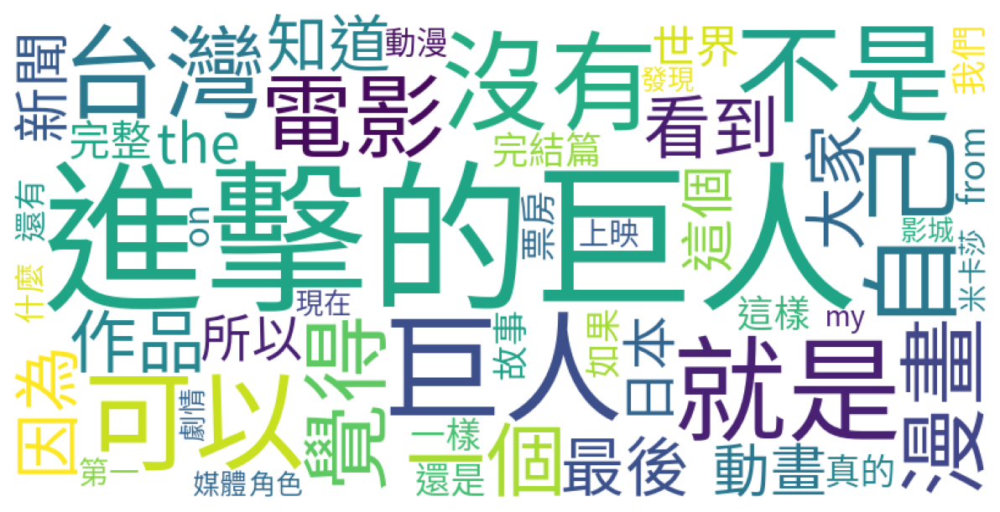

In [77]:
# wordcloud的輸入須為dict，因此先將freq_df轉換成成dict
freq_dict = freq_df.set_index('word').to_dict()
freq_dict = freq_dict['count']

# 繪製文字雲
wordcloud_no1 = WordCloud(background_color = 'white', width = 800, height = 400, font_path = FontPath, max_words = 50)
wordcloud_no1.generate_from_frequencies(freq_dict)

plt.figure(figsize = (10,7))
plt.imshow(wordcloud_no1)
plt.axis('off')
plt.show()

去除停用字

In [78]:
stopwords = [line.strip() for line in open('dict/stopwords.txt', 'r', encoding='utf-8').readlines()] 

noStop_df = word_df[~word_df['word'].isin(stopwords)]

noStop_df.head(10)

,artUrl,artTitle,artDate,artContent,word
0,https://www.ptt.cc/bbs/movie/M.1676932822.A.13...,[爆好雷]必看！鬼滅之刃：上弦集結，前進刀匠村,2023-02-21,先說我不是很資深鬼滅之刃的鐵粉，\n單純喜歡這部作品的故事與作畫，\n我最愛的作品是《進擊的...,先說
0,https://www.ptt.cc/bbs/movie/M.1676932822.A.13...,[爆好雷]必看！鬼滅之刃：上弦集結，前進刀匠村,2023-02-21,先說我不是很資深鬼滅之刃的鐵粉，\n單純喜歡這部作品的故事與作畫，\n我最愛的作品是《進擊的...,資深
0,https://www.ptt.cc/bbs/movie/M.1676932822.A.13...,[爆好雷]必看！鬼滅之刃：上弦集結，前進刀匠村,2023-02-21,先說我不是很資深鬼滅之刃的鐵粉，\n單純喜歡這部作品的故事與作畫，\n我最愛的作品是《進擊的...,鬼滅
0,https://www.ptt.cc/bbs/movie/M.1676932822.A.13...,[爆好雷]必看！鬼滅之刃：上弦集結，前進刀匠村,2023-02-21,先說我不是很資深鬼滅之刃的鐵粉，\n單純喜歡這部作品的故事與作畫，\n我最愛的作品是《進擊的...,之刃
0,https://www.ptt.cc/bbs/movie/M.1676932822.A.13...,[爆好雷]必看！鬼滅之刃：上弦集結，前進刀匠村,2023-02-21,先說我不是很資深鬼滅之刃的鐵粉，\n單純喜歡這部作品的故事與作畫，\n我最愛的作品是《進擊的...,鐵粉
1,https://www.ptt.cc/bbs/movie/M.1676932822.A.13...,[爆好雷]必看！鬼滅之刃：上弦集結，前進刀匠村,2023-02-21,先說我不是很資深鬼滅之刃的鐵粉，\n單純喜歡這部作品的故事與作畫，\n我最愛的作品是《進擊的...,喜歡
1,https://www.ptt.cc/bbs/movie/M.1676932822.A.13...,[爆好雷]必看！鬼滅之刃：上弦集結，前進刀匠村,2023-02-21,先說我不是很資深鬼滅之刃的鐵粉，\n單純喜歡這部作品的故事與作畫，\n我最愛的作品是《進擊的...,這部
1,https://www.ptt.cc/bbs/movie/M.1676932822.A.13...,[爆好雷]必看！鬼滅之刃：上弦集結，前進刀匠村,2023-02-21,先說我不是很資深鬼滅之刃的鐵粉，\n單純喜歡這部作品的故事與作畫，\n我最愛的作品是《進擊的...,作品
1,https://www.ptt.cc/bbs/movie/M.1676932822.A.13...,[爆好雷]必看！鬼滅之刃：上弦集結，前進刀匠村,2023-02-21,先說我不是很資深鬼滅之刃的鐵粉，\n單純喜歡這部作品的故事與作畫，\n我最愛的作品是《進擊的...,故事
1,https://www.ptt.cc/bbs/movie/M.1676932822.A.13...,[爆好雷]必看！鬼滅之刃：上弦集結，前進刀匠村,2023-02-21,先說我不是很資深鬼滅之刃的鐵粉，\n單純喜歡這部作品的故事與作畫，\n我最愛的作品是《進擊的...,作畫


繪製成圖

C:\Users\k7256\AppData\Local\Temp\ipykernel_13988\583685406.py:1: FutureWarning: pandas.value_counts is deprecated and will be removed in a future version. Use pd.Series(obj).value_counts() instead.
  freq_df_nostop = pd.DataFrame(pd.value_counts(noStop_df['word'])).sort_values(by = ['count'], ascending = False).reset_index()


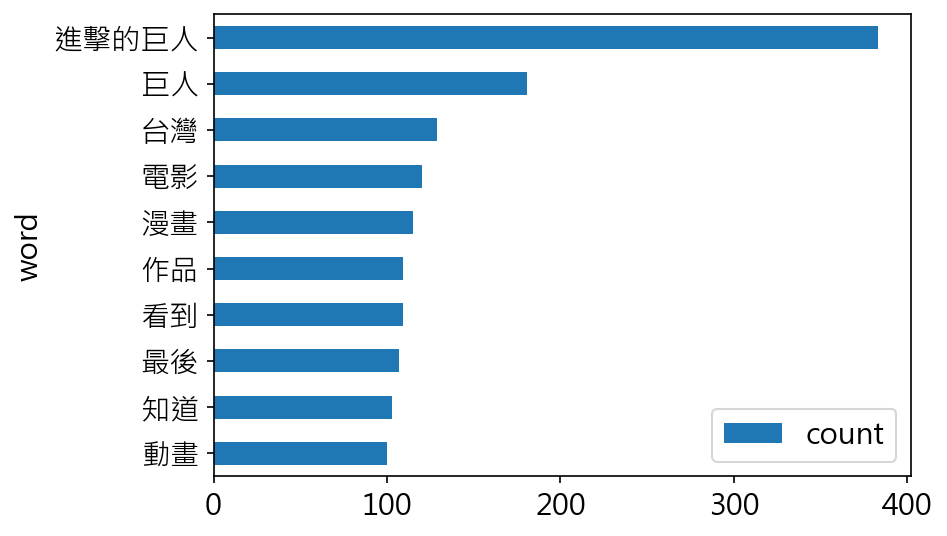

In [79]:
freq_df_nostop = pd.DataFrame(pd.value_counts(noStop_df['word'])).sort_values(by = ['count'], ascending = False).reset_index()

freq_df_nostop.head(10).plot.barh(x = 'word', y = 'count').invert_yaxis()
plt.show()

重新繪製文字雲

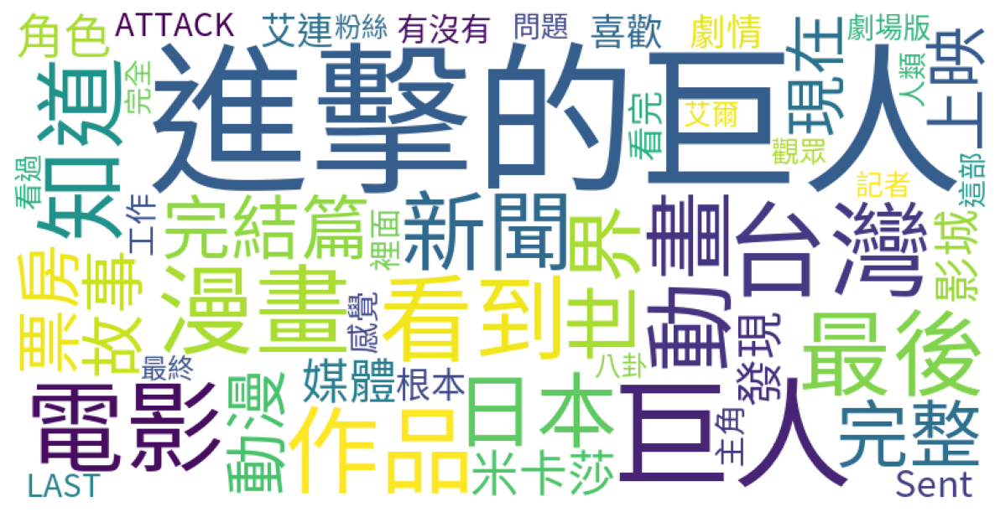

In [80]:
freq_dict_nostop = freq_df_nostop.set_index('word').to_dict()
freq_dict_nostop = freq_dict_nostop['count']

# 繪製文字雲
wordcloud_nostop = WordCloud(background_color = 'white', width = 800, height = 400, font_path = FontPath, max_words = 50)
wordcloud_nostop.generate_from_frequencies(freq_dict_nostop)

plt.figure(figsize = (10,7))
plt.imshow(wordcloud_nostop)
plt.axis('off')
plt.show()

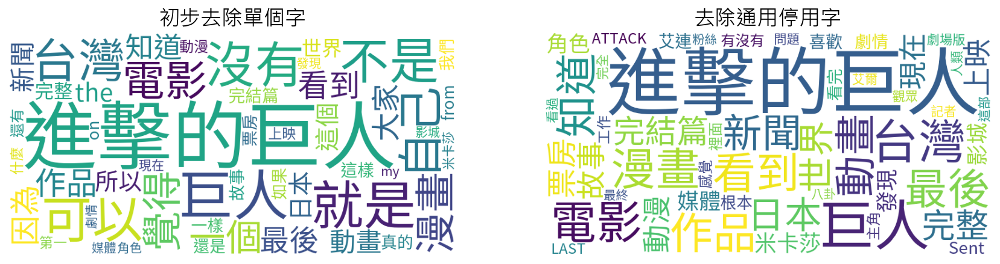

In [81]:
plt.figure(figsize = (14,8))

plt.subplot(1,2,1)
plt.imshow(wordcloud_no1)
plt.axis('off')
plt.title("初步去除單個字")

plt.subplot(1,2,2)
plt.imshow(wordcloud_nostop)
plt.axis('off')
plt.title("去除通用停用字")

plt.show()

新增更多停用字

In [82]:
stopwords_manual = ["The", "anime", "fans", "Pok", "Sent" ,"新聞", "知道", "有沒有", "發現", "看到", "根本", "看過", "完全", "感覺", "完全", "JPTT", "進擊的巨人", "巨人", "現在", "一直", "好像", "看到", "八卦", "電影", "作品", "問題"]
stopwords.extend(stopwords_manual)

noStop_df_2 = noStop_df[~noStop_df['word'].isin(stopwords)]
noStop_df_2.head(10)

,artUrl,artTitle,artDate,artContent,word
0,https://www.ptt.cc/bbs/movie/M.1676932822.A.13...,[爆好雷]必看！鬼滅之刃：上弦集結，前進刀匠村,2023-02-21,先說我不是很資深鬼滅之刃的鐵粉，\n單純喜歡這部作品的故事與作畫，\n我最愛的作品是《進擊的...,先說
0,https://www.ptt.cc/bbs/movie/M.1676932822.A.13...,[爆好雷]必看！鬼滅之刃：上弦集結，前進刀匠村,2023-02-21,先說我不是很資深鬼滅之刃的鐵粉，\n單純喜歡這部作品的故事與作畫，\n我最愛的作品是《進擊的...,資深
0,https://www.ptt.cc/bbs/movie/M.1676932822.A.13...,[爆好雷]必看！鬼滅之刃：上弦集結，前進刀匠村,2023-02-21,先說我不是很資深鬼滅之刃的鐵粉，\n單純喜歡這部作品的故事與作畫，\n我最愛的作品是《進擊的...,鬼滅
0,https://www.ptt.cc/bbs/movie/M.1676932822.A.13...,[爆好雷]必看！鬼滅之刃：上弦集結，前進刀匠村,2023-02-21,先說我不是很資深鬼滅之刃的鐵粉，\n單純喜歡這部作品的故事與作畫，\n我最愛的作品是《進擊的...,之刃
0,https://www.ptt.cc/bbs/movie/M.1676932822.A.13...,[爆好雷]必看！鬼滅之刃：上弦集結，前進刀匠村,2023-02-21,先說我不是很資深鬼滅之刃的鐵粉，\n單純喜歡這部作品的故事與作畫，\n我最愛的作品是《進擊的...,鐵粉
1,https://www.ptt.cc/bbs/movie/M.1676932822.A.13...,[爆好雷]必看！鬼滅之刃：上弦集結，前進刀匠村,2023-02-21,先說我不是很資深鬼滅之刃的鐵粉，\n單純喜歡這部作品的故事與作畫，\n我最愛的作品是《進擊的...,喜歡
1,https://www.ptt.cc/bbs/movie/M.1676932822.A.13...,[爆好雷]必看！鬼滅之刃：上弦集結，前進刀匠村,2023-02-21,先說我不是很資深鬼滅之刃的鐵粉，\n單純喜歡這部作品的故事與作畫，\n我最愛的作品是《進擊的...,這部
1,https://www.ptt.cc/bbs/movie/M.1676932822.A.13...,[爆好雷]必看！鬼滅之刃：上弦集結，前進刀匠村,2023-02-21,先說我不是很資深鬼滅之刃的鐵粉，\n單純喜歡這部作品的故事與作畫，\n我最愛的作品是《進擊的...,故事
1,https://www.ptt.cc/bbs/movie/M.1676932822.A.13...,[爆好雷]必看！鬼滅之刃：上弦集結，前進刀匠村,2023-02-21,先說我不是很資深鬼滅之刃的鐵粉，\n單純喜歡這部作品的故事與作畫，\n我最愛的作品是《進擊的...,作畫
2,https://www.ptt.cc/bbs/movie/M.1676932822.A.13...,[爆好雷]必看！鬼滅之刃：上弦集結，前進刀匠村,2023-02-21,先說我不是很資深鬼滅之刃的鐵粉，\n單純喜歡這部作品的故事與作畫，\n我最愛的作品是《進擊的...,最愛


新增停用字，重新去除停用字後的文字雲

C:\Users\k7256\AppData\Local\Temp\ipykernel_13988\1032659861.py:2: FutureWarning: pandas.value_counts is deprecated and will be removed in a future version. Use pd.Series(obj).value_counts() instead.
  freq_df_nostop_2 = pd.DataFrame(pd.value_counts(noStop_df_2['word'])).sort_values(by = ['count'], ascending = False).reset_index()


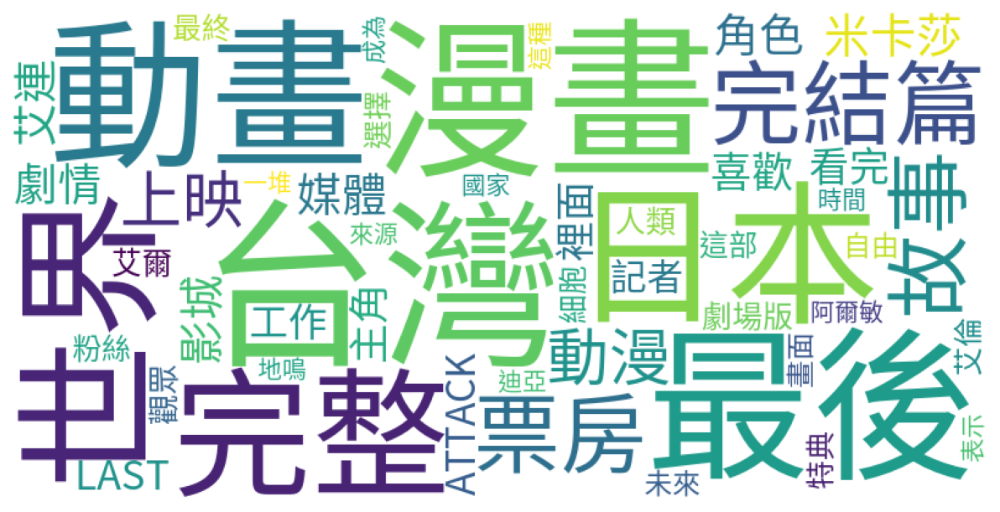

In [83]:
# 計算詞頻
freq_df_nostop_2 = pd.DataFrame(pd.value_counts(noStop_df_2['word'])).sort_values(by = ['count'], ascending = False).reset_index()

# wordcloud的輸入須為dict，因此先將freq_df轉換成成dict
freq_dict_nostop_2 = freq_df_nostop_2.set_index('word').to_dict()
freq_dict_nostop_2 = freq_dict_nostop_2['count']

# 繪製文字雲
wordcloud_nostop_2 = WordCloud(background_color = 'white', width = 800, height = 400, font_path = FontPath, max_words = 50)
wordcloud_nostop_2.generate_from_frequencies(freq_dict_nostop_2)

plt.figure(figsize = (10,7))
plt.imshow(wordcloud_nostop_2)
plt.axis('off')
plt.show()

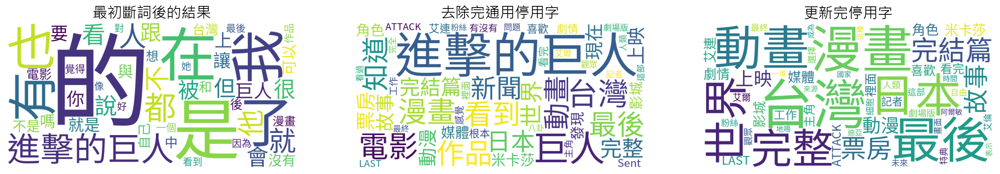

In [84]:
plt.figure(figsize = (20,14))

plt.subplot(1,3,1)
plt.imshow(wordcloud)
plt.axis('off')
plt.title("最初斷詞後的結果")

plt.subplot(1,3,2)
plt.imshow(wordcloud_nostop)
plt.axis('off')
plt.title("去除完通用停用字")

plt.subplot(1,3,3)
plt.imshow(wordcloud_nostop_2)
plt.axis('off')
plt.title("更新完停用字")

plt.show()

將資料清理後的結果存成csv檔

In [85]:
#noStop_df_2.to_csv("raw_data/clean_data.csv", encoding = 'utf-8',index = False)

Lexicon-based 情緒分析

In [86]:
#noStop_df = pd.read_csv('raw_data/clean_data.csv')
#total_rows = len(noStop_df)
#print(f"總共有 {total_rows}")


# 讀取情緒字典
liwc_dict = pd.read_csv("./dict/liwc/LIWC_CH.csv")
liwc_dict = liwc_dict.rename(columns={'name': 'word', "class": 'sentiments'})
liwc_dict.head()
#noStop_df.head()

,word,sentiments
0,):,affect
1,3q,affect
2,:(,affect
3,:),affect
4,<3,affect


In [87]:
liwc_dict['sentiments'].describe()

count       4682
unique         6
top       affect
freq        2061
Name: sentiments, dtype: object


將sentiments與剛剛處理完去除停用字的結果作合併，判斷該詞為正向或負向

In [88]:
#noStop_df_2['artDate'] = pd.to_datetime(df['artDate']).dt.date #留下日期不要時間
ptt_liwc_df = pd.merge(noStop_df_2[["artUrl", "artDate", "artTitle", "artContent", "word"]], liwc_dict, how="left")
ptt_liwc_df.head()

,artUrl,artDate,artTitle,artContent,word,sentiments
0,https://www.ptt.cc/bbs/movie/M.1676932822.A.13...,2023-02-21,[爆好雷]必看！鬼滅之刃：上弦集結，前進刀匠村,先說我不是很資深鬼滅之刃的鐵粉，\n單純喜歡這部作品的故事與作畫，\n我最愛的作品是《進擊的...,先說,NaN
1,https://www.ptt.cc/bbs/movie/M.1676932822.A.13...,2023-02-21,[爆好雷]必看！鬼滅之刃：上弦集結，前進刀匠村,先說我不是很資深鬼滅之刃的鐵粉，\n單純喜歡這部作品的故事與作畫，\n我最愛的作品是《進擊的...,資深,NaN
2,https://www.ptt.cc/bbs/movie/M.1676932822.A.13...,2023-02-21,[爆好雷]必看！鬼滅之刃：上弦集結，前進刀匠村,先說我不是很資深鬼滅之刃的鐵粉，\n單純喜歡這部作品的故事與作畫，\n我最愛的作品是《進擊的...,鬼滅,NaN
3,https://www.ptt.cc/bbs/movie/M.1676932822.A.13...,2023-02-21,[爆好雷]必看！鬼滅之刃：上弦集結，前進刀匠村,先說我不是很資深鬼滅之刃的鐵粉，\n單純喜歡這部作品的故事與作畫，\n我最愛的作品是《進擊的...,之刃,NaN
4,https://www.ptt.cc/bbs/movie/M.1676932822.A.13...,2023-02-21,[爆好雷]必看！鬼滅之刃：上弦集結，前進刀匠村,先說我不是很資深鬼滅之刃的鐵粉，\n單純喜歡這部作品的故事與作畫，\n我最愛的作品是《進擊的...,鐵粉,NaN


以artDate和sentiments做分群，查看每天出現的正向字有多少，負向字有多少

In [89]:
sentiment_count = pd.DataFrame(
    ptt_liwc_df.groupby(["artDate", "sentiments"]).size()
).reset_index()

mask = (sentiment_count['sentiments'] == "positive") | (sentiment_count['sentiments'] == "negative") 
sentiment_count = sentiment_count.loc[mask]

sentiment_count = sentiment_count.rename(columns={0: "size"})
sentiment_count = sentiment_count.sort_values(["artDate"])
sentiment_count.head(10)

,artDate,sentiments,size
1,2023-01-07,positive,3
5,2023-01-09,negative,6
6,2023-01-09,positive,1
10,2023-01-10,negative,2
11,2023-01-10,positive,3
15,2023-01-21,negative,4
16,2023-01-21,positive,1
20,2023-02-02,negative,2
21,2023-02-02,positive,7
26,2023-02-09,positive,2


將上表繪製成圖

可以看到在1月的時候正負向的詞出現的比以往多

很可能因為討論度變高，正負向的詞出現的也就更多

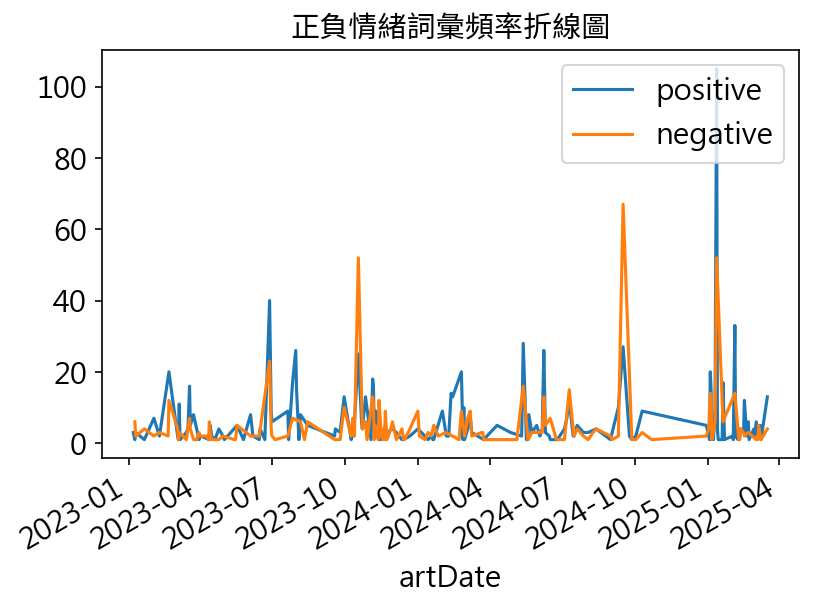

In [90]:
# plt.rcParams['font.sans-serif']=['SimHei'] #使 matplotilb 中文能正常顯示
fprop = fm.FontProperties(fname="./raw_data/SourceHanSansTW-Regular.otf")

# 設定整份 notebook 圖片的長寬與 dpi
plt.rcParams["figure.figsize"] = [6, 4]
plt.rcParams["figure.dpi"] = 150


colors = ["tab:blue", "tab:orange"]
pos = sentiment_count[sentiment_count["sentiments"] == "positive"]
neg = sentiment_count[sentiment_count["sentiments"] == "negative"]

# fig, ax = plt.subplots(figsize = (6,4), dpi = 150) # 也可以在該圖設定參數
fig, ax = plt.subplots()

ax.plot(pos["artDate"], pos["size"], color=colors[0])
ax.plot(neg["artDate"], neg["size"], color=colors[1])

plt.xlabel("artDate")
# plt.ylabel('size')
ax.legend(["positive", "negative"], loc="upper right")
fig.autofmt_xdate()
plt.title("正負情緒詞彙頻率折線圖", fontproperties=fprop)  # 記得加上才能顯示中文
plt.show()

將上表以14天移動平均的方式繪製

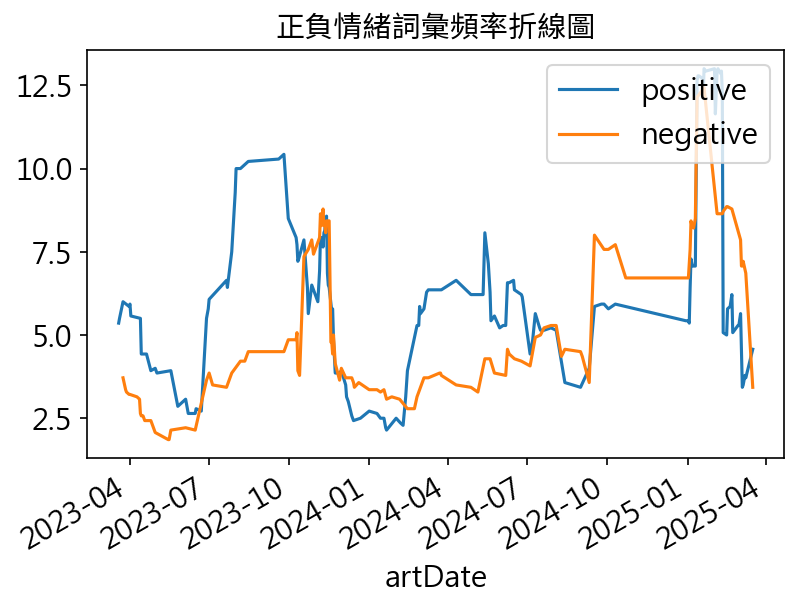

In [91]:
colors = ["tab:blue", "tab:orange"]
pos = sentiment_count[sentiment_count["sentiments"] == "positive"]
neg = sentiment_count[sentiment_count["sentiments"] == "negative"]

# fig, ax = plt.subplots(figsize = (6,4), dpi = 150) # 也可以在該圖設定參數
fig, ax = plt.subplots()

# 使用 Series.rolling().mean() 來產生 14 天平均
rolling_days = 14
ax.plot(pos["artDate"], pos['size'].rolling(rolling_days).mean(), color=colors[0])
ax.plot(neg["artDate"], neg["size"].rolling(rolling_days).mean(), color=colors[1])

plt.xlabel("artDate")
# plt.ylabel('size')
ax.legend(["positive", "negative"], loc="upper right")
fig.autofmt_xdate()
plt.title("正負情緒詞彙頻率折線圖", fontproperties=fprop)  # 記得加上才能顯示中文
plt.show()

計算每天的正負向所出現的"頻率"(非總數)

In [92]:
sentiment_count = sentiment_count.assign(
    ratio=sentiment_count.groupby("artDate")["size"].transform(lambda n: n / n.sum())
)
sentiment_count.head(10)

,artDate,sentiments,size,ratio
1,2023-01-07,positive,3,1.000000
5,2023-01-09,negative,6,0.857143
6,2023-01-09,positive,1,0.142857
10,2023-01-10,negative,2,0.400000
11,2023-01-10,positive,3,0.600000
15,2023-01-21,negative,4,0.800000
16,2023-01-21,positive,1,0.200000
20,2023-02-02,negative,2,0.222222
21,2023-02-02,positive,7,0.777778
26,2023-02-09,positive,2,0.400000


繪製成圖

In [93]:
pos = sentiment_count[sentiment_count["sentiments"] == "positive"]
neg = sentiment_count[sentiment_count["sentiments"] == "negative"]

Text(0.5, 1.0, '正負情緒比例折線圖')

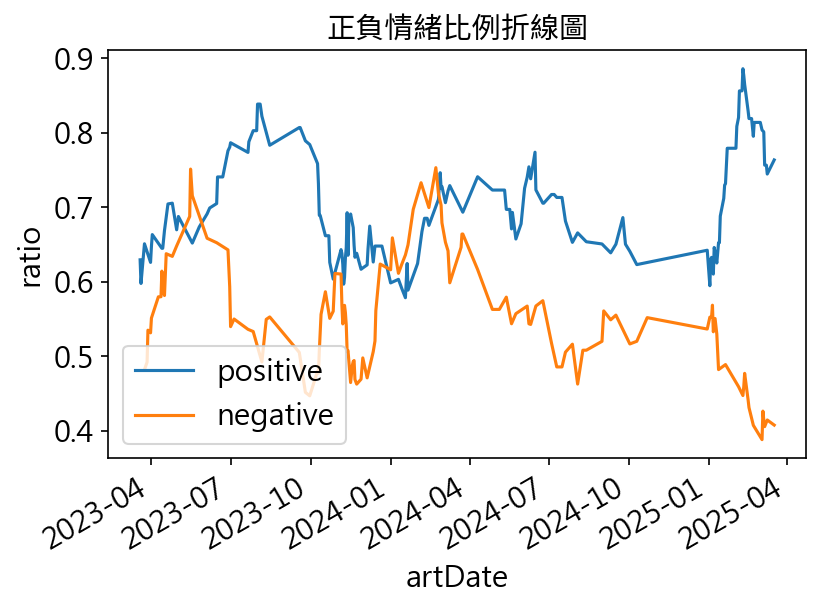

In [94]:
fig, ax = plt.subplots()

rolling_days = 14
ax.plot(pos["artDate"], pos["ratio"].rolling(rolling_days).mean(), color=colors[0])
ax.plot(neg["artDate"], neg["ratio"].rolling(rolling_days).mean(), color=colors[1])

plt.xlabel("artDate")
plt.ylabel("ratio")
ax.legend(["positive", "negative"], loc="lower left")
fig.autofmt_xdate()
plt.title("正負情緒比例折線圖", fontproperties=fprop)

In [95]:
sentiment_count.head(10)

,artDate,sentiments,size,ratio
1,2023-01-07,positive,3,1.000000
5,2023-01-09,negative,6,0.857143
6,2023-01-09,positive,1,0.142857
10,2023-01-10,negative,2,0.400000
11,2023-01-10,positive,3,0.600000
15,2023-01-21,negative,4,0.800000
16,2023-01-21,positive,1,0.200000
20,2023-02-02,negative,2,0.222222
21,2023-02-02,positive,7,0.777778
26,2023-02-09,positive,2,0.400000


計算每天出現的正向與負向詞彙

In [96]:
ptt_sentiment_value = (
    sentiment_count.pivot_table(
        index="artDate", columns="sentiments", values="size", fill_value=0
    )
    .reset_index()
    .rename_axis(None, axis=1)
)
ptt_sentiment_value.head()

,artDate,negative,positive
0,2023-01-07,0.0,3.0
1,2023-01-09,6.0,1.0
2,2023-01-10,2.0,3.0
3,2023-01-21,4.0,1.0
4,2023-02-02,2.0,7.0


用正向減負向取得情緒分數

數字>0為正向，反之為負向

In [97]:
# sentiment 計算方式: positive - negative
ptt_sentiment_value["sentiment_value"] = (
    ptt_sentiment_value["positive"]
    - ptt_sentiment_value["negative"]
)
ptt_sentiment_value.head()

,artDate,negative,positive,sentiment_value
0,2023-01-07,0.0,3.0,3.0
1,2023-01-09,6.0,1.0,-5.0
2,2023-01-10,2.0,3.0,1.0
3,2023-01-21,4.0,1.0,-3.0
4,2023-02-02,2.0,7.0,5.0


根據上表sentiment_value繪製成圖

Text(0.5, 1.0, '正負情緒分數趨勢折線圖')

c:\Users\k7256\anaconda3\envs\SMA\Lib\site-packages\IPython\core\events.py:82: UserWarning: Glyph 8722 (\N{MINUS SIGN}) missing from current font.
  func(*args, **kwargs)
c:\Users\k7256\anaconda3\envs\SMA\Lib\site-packages\IPython\core\pylabtools.py:170: UserWarning: Glyph 8722 (\N{MINUS SIGN}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)


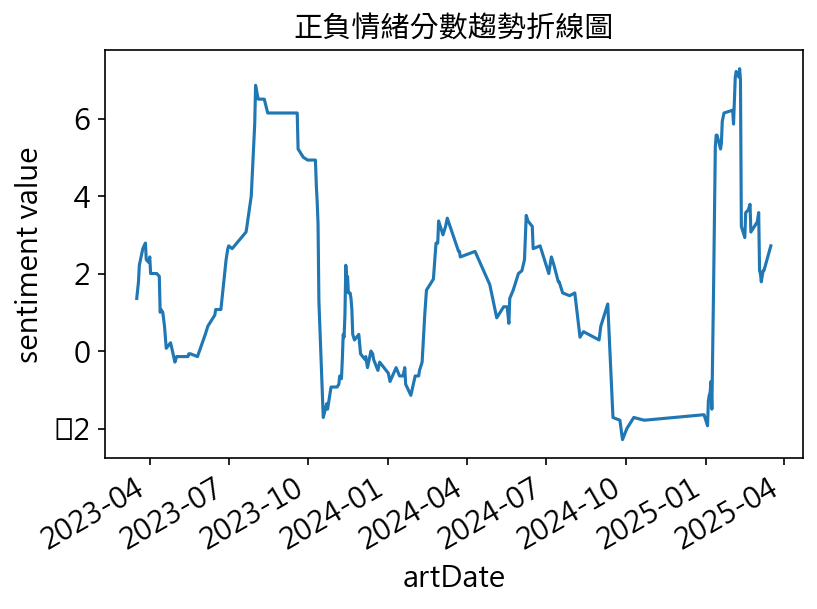

In [98]:
fig, ax = plt.subplots()

rolling_days = 14
ax.plot(ptt_sentiment_value["artDate"], ptt_sentiment_value["sentiment_value"].rolling(rolling_days).mean())
ax.set_xlabel("artDate")
ax.set_ylabel("sentiment value")
fig.autofmt_xdate()
plt.title("正負情緒分數趨勢折線圖", fontproperties=fprop)

以artUrl及sentiments做分群，計算每篇文章的各種情緒詞會出現的次數分別為多少

In [99]:
sentiment_count_by_article = pd.DataFrame(
    ptt_liwc_df.groupby(["artUrl", "sentiments"]).size()
).reset_index()
sentiment_count_by_article = sentiment_count_by_article.rename(columns={0: "size"})
sentiment_count_by_article.head(10)

,artUrl,sentiments,size
0,https://www.ptt.cc/bbs/Gossiping/M.1673051875....,affect,3
1,https://www.ptt.cc/bbs/Gossiping/M.1673051875....,positive,3
2,https://www.ptt.cc/bbs/Gossiping/M.1673251166....,affect,7
3,https://www.ptt.cc/bbs/Gossiping/M.1673251166....,anger,1
4,https://www.ptt.cc/bbs/Gossiping/M.1673251166....,anx,1
5,https://www.ptt.cc/bbs/Gossiping/M.1673251166....,negative,6
6,https://www.ptt.cc/bbs/Gossiping/M.1673251166....,positive,1
7,https://www.ptt.cc/bbs/Gossiping/M.1673312113....,affect,1
8,https://www.ptt.cc/bbs/Gossiping/M.1673312113....,positive,1
9,https://www.ptt.cc/bbs/Gossiping/M.1673324488....,affect,4


將表轉成每篇文章 各種情緒詞出現數量

In [100]:
ptt_sentiment_value_by_article = (
    sentiment_count_by_article.pivot_table(
        index="artUrl", columns="sentiments", values="size", fill_value=0
    )
    .reset_index()
    .rename_axis(None, axis=1)
)
ptt_sentiment_value_by_article.head()

,artUrl,affect,anger,anx,negative,positive,sad
0,https://www.ptt.cc/bbs/Gossiping/M.1673051875....,3.0,0.0,0.0,0.0,3.0,0.0
1,https://www.ptt.cc/bbs/Gossiping/M.1673251166....,7.0,1.0,1.0,6.0,1.0,0.0
2,https://www.ptt.cc/bbs/Gossiping/M.1673312113....,1.0,0.0,0.0,0.0,1.0,0.0
3,https://www.ptt.cc/bbs/Gossiping/M.1673324488....,4.0,1.0,1.0,2.0,2.0,1.0
4,https://www.ptt.cc/bbs/Gossiping/M.1674230527....,1.0,0.0,0.0,0.0,1.0,0.0


計算每篇文章的情緒為正向或負向

In [101]:
# sentiment 計算方式: positive - negative
ptt_sentiment_value_by_article["sentiment_value"] = (
    ptt_sentiment_value_by_article["positive"]
    - ptt_sentiment_value_by_article["negative"]
)
ptt_sentiment_value_by_article.head()

,artUrl,affect,anger,anx,negative,positive,sad,sentiment_value
0,https://www.ptt.cc/bbs/Gossiping/M.1673051875....,3.0,0.0,0.0,0.0,3.0,0.0,3.0
1,https://www.ptt.cc/bbs/Gossiping/M.1673251166....,7.0,1.0,1.0,6.0,1.0,0.0,-5.0
2,https://www.ptt.cc/bbs/Gossiping/M.1673312113....,1.0,0.0,0.0,0.0,1.0,0.0,1.0
3,https://www.ptt.cc/bbs/Gossiping/M.1673324488....,4.0,1.0,1.0,2.0,2.0,1.0,0.0
4,https://www.ptt.cc/bbs/Gossiping/M.1674230527....,1.0,0.0,0.0,0.0,1.0,0.0,1.0


sentiment_value>0為正向，反之為負向

In [102]:
ptt_sentiment_value_by_article['sentiment_class'] = ptt_sentiment_value_by_article['sentiment_value'].apply(lambda x: "正向" if x > 0 else "負向" )
ptt_sentiment_value_by_article.head(10)

,artUrl,affect,anger,anx,negative,positive,sad,sentiment_value,sentiment_class
0,https://www.ptt.cc/bbs/Gossiping/M.1673051875....,3.0,0.0,0.0,0.0,3.0,0.0,3.0,正向
1,https://www.ptt.cc/bbs/Gossiping/M.1673251166....,7.0,1.0,1.0,6.0,1.0,0.0,-5.0,負向
2,https://www.ptt.cc/bbs/Gossiping/M.1673312113....,1.0,0.0,0.0,0.0,1.0,0.0,1.0,正向
3,https://www.ptt.cc/bbs/Gossiping/M.1673324488....,4.0,1.0,1.0,2.0,2.0,1.0,0.0,負向
4,https://www.ptt.cc/bbs/Gossiping/M.1674230527....,1.0,0.0,0.0,0.0,1.0,0.0,1.0,正向
5,https://www.ptt.cc/bbs/Gossiping/M.1674298046....,4.0,0.0,1.0,4.0,0.0,1.0,-4.0,負向
6,https://www.ptt.cc/bbs/Gossiping/M.1675325799....,9.0,0.0,1.0,2.0,7.0,1.0,5.0,正向
7,https://www.ptt.cc/bbs/Gossiping/M.1675896142....,6.0,0.0,1.0,3.0,2.0,2.0,-1.0,負向
8,https://www.ptt.cc/bbs/Gossiping/M.1676869116....,3.0,0.0,0.0,2.0,0.0,0.0,-2.0,負向
9,https://www.ptt.cc/bbs/Gossiping/M.1676956558....,4.0,0.0,0.0,0.0,4.0,0.0,4.0,正向


取得每篇正負向文章的內容

In [103]:
clear_df_sentiment = pd.merge(df, ptt_sentiment_value_by_article[['artUrl', 'sentiment_class']], how="left")
clear_df_sentiment["artDate"] = pd.to_datetime(clear_df_sentiment["artDate"])
clear_df_sentiment['artDate'] = clear_df_sentiment['artDate'].dt.date

clear_df_sentiment.head()

,system_id,artUrl,artTitle,artDate,artPoster,artCatagory,artContent,artComment,e_ip,insertedDate,dataSource,sentiment_class
0,1,https://www.ptt.cc/bbs/movie/M.1676932822.A.13...,[爆好雷]必看！鬼滅之刃：上弦集結，前進刀匠村,2023-02-21,toebb,movie,先說我不是很資深鬼滅之刃的鐵粉，\n單純喜歡這部作品的故事與作畫，\n我最愛的作品是《進擊的...,"[{""cmtStatus"": ""推"", ""cmtPoster"": ""yayappp"", ""c...",42.74.120.9,2023/2/23 02:12,ptt,正向
1,2,https://www.ptt.cc/bbs/movie/M.1676944836.A.AE...,Re:[請益]漫威系列是出了啥問題,2023-02-21,moshenisshit,movie,單純只是一系列結束，\n\n沒辦法再用這個宇宙創造什麼新玩法吧，\n\n幾年前《無限傳奇篇》...,"[{""cmtStatus"": ""推"", ""cmtPoster"": ""Luos"", ""cmtC...",136.23.35.39,2023/2/23 02:12,ptt,正向
2,3,https://www.ptt.cc/bbs/movie/M.1678101798.A.1D...,[好雷]拖到現在才看的灌籃高手,2023-03-06,walkmaster,movie,雷文防雷資訊頁\n\n\n\n~*-*~*-*~*-*~*-*~*-*~*-*~*-*~*-...,"[{""cmtStatus"": ""推"", ""cmtPoster"": ""cashko"", ""cm...",61.228.209.193,2023/3/7 02:07,ptt,正向
3,4,https://www.ptt.cc/bbs/movie/M.1678888141.A.B8...,[情報]《鏡之孤城》正式預告,2023-03-15,godofsex,movie,書店大賞史上最高票奇幻神作改編\n\n《\n鏡之孤城\n》3/31(五)感動獻映\nhttp...,"[{""cmtStatus"": ""→"", ""cmtPoster"": ""GeogeBye"", ""...",101.12.103.254,2023/3/16 02:11,ptt,正向
4,5,https://www.ptt.cc/bbs/movie/M.1679029659.A.01...,[情報]鈴芽之旅國語配音版3/17上映,2023-03-17,ashin0709,movie,https://reurl.cc/GejO6d\n【鈴芽之旅】台灣配音老師公開！\n這是 #...,"[{""cmtStatus"": ""推"", ""cmtPoster"": ""tsukirit"", ""...",42.79.187.53,2023/3/18 02:20,ptt,正向


以artDate及sentiment_class做分類，查看每天的正向與負向文章各幾篇

In [104]:
sentiment_art_count = pd.DataFrame(
    clear_df_sentiment.groupby(["artDate", "sentiment_class"]).size()
).reset_index()
sentiment_art_count = sentiment_art_count.rename(columns={0: "size"})
sentiment_art_count = sentiment_art_count.sort_values(["artDate"])
sentiment_art_count

,artDate,sentiment_class,size
0,2023-01-07,正向,1
1,2023-01-09,負向,1
2,2023-01-10,正向,1
3,2023-01-10,負向,1
4,2023-01-21,正向,1
...,...,...,...
220,2025-03-05,正向,1
221,2025-03-06,負向,1
222,2025-03-08,正向,2
223,2025-03-09,負向,1


將上表繪製成圖

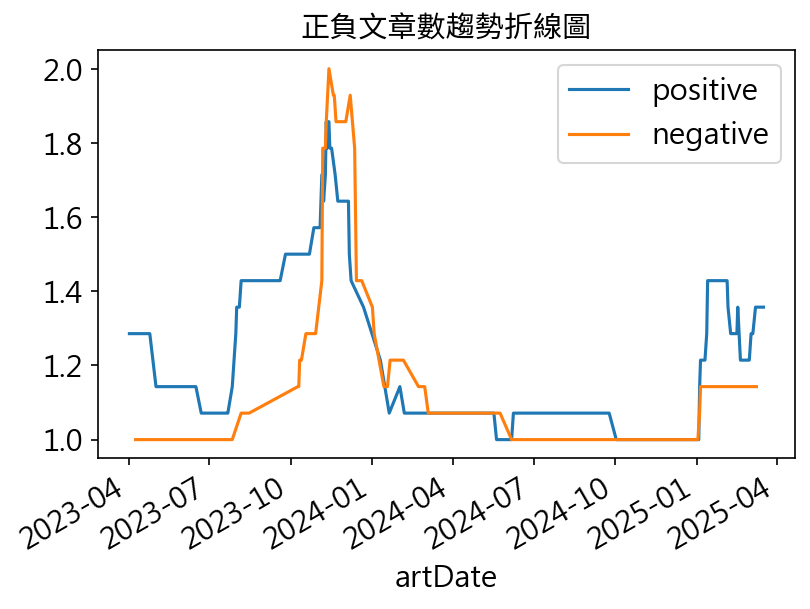

In [105]:
colors = ["tab:blue", "tab:orange"]
pos = sentiment_art_count[sentiment_art_count["sentiment_class"] == "正向"]
neg = sentiment_art_count[sentiment_art_count["sentiment_class"] == "負向"]

# fig, ax = plt.subplots(figsize = (6,4), dpi = 150) # 也可以在該圖設定參數
fig, ax = plt.subplots()

# 使用 Series.rolling().mean() 來產生 14 天平均
rolling_days = 14
ax.plot(pos["artDate"], pos['size'].rolling(rolling_days).mean(), color=colors[0])
ax.plot(neg["artDate"], neg["size"].rolling(rolling_days).mean(), color=colors[1])
# ax.plot(pos["artDate"], pos['size'], color=colors[0])
# ax.plot(neg["artDate"], neg["size"], color=colors[1])

plt.xlabel("artDate")
# plt.ylabel('size')
ax.legend(["positive", "negative"], loc="upper right")
fig.autofmt_xdate()
plt.title("正負文章數趨勢折線圖", fontproperties=fprop)  # 記得加上才能顯示中文
plt.show()

查看每個情緒字所代表的情緒以及出現次數

In [106]:
word_count = ptt_liwc_df.groupby(["word", "sentiments"]).size().reset_index()
word_count = word_count.rename(columns={0: "size"})
word_count = word_count.sort_values(["size"], ascending=False)

word_count.head(10)

,word,sentiments,size
250,喜歡,positive,56
249,喜歡,affect,56
1017,自由,affect,40
1018,自由,positive,40
404,希望,affect,29
405,希望,positive,29
566,戰爭,affect,27
567,戰爭,anger,27
568,戰爭,negative,27
708,朋友,affect,25


查看正向情緒字出現的次數

In [107]:
word_of_pos = word_count.loc[(word_count["sentiments"] == "positive")]
word_of_pos.head(15)

,word,sentiments,size
250,喜歡,positive,56
1018,自由,positive,40
405,希望,positive,29
709,朋友,positive,25
36,不錯,positive,23
1087,謝謝,positive,23
132,分享,positive,19
774,決定,positive,17
1042,英雄,positive,16
106,優秀,positive,16


查看負向情緒字出現的次數

In [108]:
word_of_neg = word_count.loc[(word_count["sentiments"] == "negative")]
word_of_neg.head(15)

,word,sentiments,size
568,戰爭,negative,27
571,戰鬥,negative,17
899,痛苦,negative,15
1066,討厭,negative,11
497,情緒,negative,11
397,對抗,negative,11
1016,自我,negative,9
902,瘋狂,negative,9
358,威脅,negative,9
262,噁心,negative,9


將以上兩張表繪製成長條圖

C:\Users\k7256\AppData\Local\Temp\ipykernel_13988\391454114.py:8: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax[0].set_yticklabels(pos["word"], fontproperties=fprop)
C:\Users\k7256\AppData\Local\Temp\ipykernel_13988\391454114.py:13: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax[1].set_yticklabels(neg["word"], fontproperties=fprop)


Text(0.5, 1.0, '負向情緒總數')

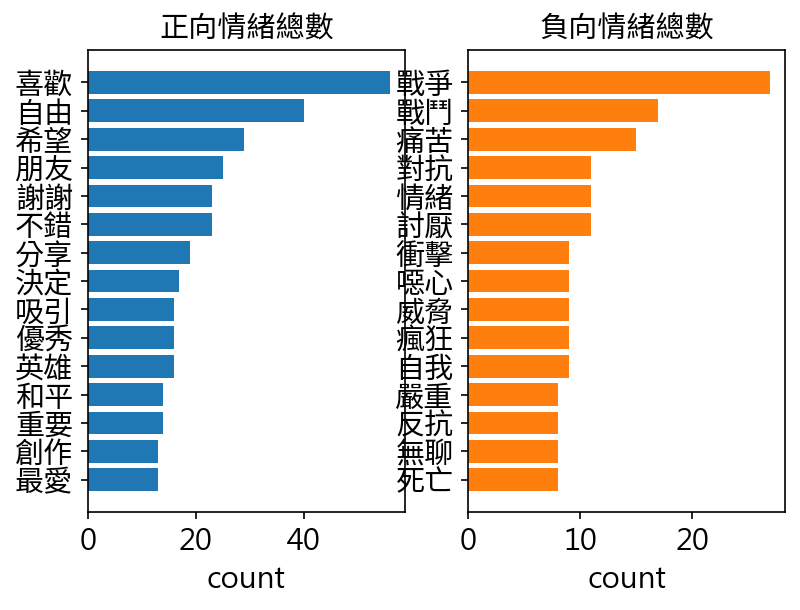

In [109]:
pos = word_of_pos.head(15).sort_values(["size"], ascending=True)
neg = word_of_neg.head(15).sort_values(["size"], ascending=True)

fig, ax = plt.subplots(1, 2)

ax[0].barh(pos["word"], pos["size"], color=colors[0])
ax[0].set_xlabel("count")
ax[0].set_yticklabels(pos["word"], fontproperties=fprop)
ax[0].set_title("正向情緒總數", fontproperties=fprop)

ax[1].barh(neg["word"], neg["size"], color=colors[1])
ax[1].set_xlabel("count")
ax[1].set_yticklabels(neg["word"], fontproperties=fprop)
ax[1].set_title("負向情緒總數", fontproperties=fprop)

針對負面字出現最多的"戰爭" 進一步查看他的內容

In [110]:
filtered_df = sent_df[sent_df['sentence'].str.contains('戰爭', na=False)]
filtered_df.head()

,artUrl,artTitle,artDate,artContent,sentence
1264,https://www.ptt.cc/bbs/movie/M.1715603203.A.88...,[好雷]在那片黃沙之後(沙丘II),2024-05-13,雷文防雷資訊頁\n\n\n\n(內含沙丘、異星入境、進擊的巨人部分內容)\n\n\n\n~~...,強權侵襲其他國度與當地民族戰爭奪取殖民
1797,https://www.ptt.cc/bbs/movie/M.1735923621.A.56...,[極好雷]進擊的巨人完結篇THELASTATTACK,2025-01-04,大場面就是要大螢幕看\n多首經典BGM(聽不夠)\n看過動畫完結篇的粉絲\n完全值得再去欣賞...,但也阻止不了人類愛戰爭的天性
2338,https://www.ptt.cc/bbs/movie/M.1736694837.A.7C...,[極好雷]進擊的巨人完結篇,2025-01-12,燃起了一根菸，選了一首歌給進擊的巨人完結篇，選了這首首雨沒停過，開頭是取樣少年\n吔 安啦，...,而存粹的想表達戰爭這件事情
2341,https://www.ptt.cc/bbs/movie/M.1736694837.A.7C...,[極好雷]進擊的巨人完結篇,2025-01-12,燃起了一根菸，選了一首歌給進擊的巨人完結篇，選了這首首雨沒停過，開頭是取樣少年\n吔 安啦，...,而也只有日本人能隱晦曖昧甚至病態的寫出那種對於戰爭的看法
5777,https://www.ptt.cc/bbs/Gossiping/M.1697010664....,[問卦]那一天人類終於想起了被支配的屈辱是哪邊,2023-10-11,家畜的安寧，虛偽的繁榮\n\n那一天，人類終於回想起曾經一度被他們所支配的恐怖\n\n還有囚...,感覺以巴戰爭很像是進擊的巨人


將句子拼湊起來做查看

In [111]:
for sentence in filtered_df['sentence'].to_list():
    print(sentence)
    print("=========================")

強權侵襲其他國度與當地民族戰爭奪取殖民
但也阻止不了人類愛戰爭的天性
而存粹的想表達戰爭這件事情
而也只有日本人能隱晦曖昧甚至病態的寫出那種對於戰爭的看法
感覺以巴戰爭很像是進擊的巨人
最近最受注目的新聞之一就是以巴戰爭
結果6日戰爭被以色列打爆
因而發生數次戰爭艾連生前就曾提醒
這樣可以停止戰爭嗎
還有進擊的巨人最後一季op我的戰爭
在戰爭小孩是不能出手的
不是因為戰爭
這場戰爭已經演變成歐洲自二戰以來最大規模的戰爭
引發的巨人戰爭
限制了日本發動戰爭的可能性
卡爾弗里茲選擇放棄戰爭並以和平的方式統治帕拉迪島
他的痛苦與自責也體現了作者對戰爭
戰爭不是一個簡單的選擇
艾蓮的痛苦和掙扎展示了作者並非鼓動戰爭
5 最終結論戰爭的悲劇與自保的必要性
作者並非鼓勵戰爭
戰爭帶來的不是榮耀
艾蓮的掙扎和最終的選擇揭示了他對戰爭的厭惡與無奈
諫山對現實世界中戰爭與和平的深刻思考
揭示了戰爭的
並提醒讀者不要輕易觸發戰爭


將負面字中，有許多可能是劇情所出現的，舉例:劇情中可能會有主角復仇，或是發起戰爭的行動，但此並非是觀眾對於該部作品的評價，而是針對劇情的討論。

因此將此類負面與正面情緒字去除

In [112]:
words_to_remove = ['死亡','復仇','戰鬥','戰爭','激烈','打破','八卦','問題','對抗','威脅','反抗','犧牲','瘋狂','反派','絕望','情緒','自由','朋友','英雄','和平','保護','決定','遊戲']
# 使用 ~ 運算子和 isin() 方法過濾掉包含在 words_to_remove 列表中的行
liwc_dict_revise = liwc_dict[~liwc_dict['word'].isin(words_to_remove)]
# 使用更新後的情緒字典 merge
ptt_liwc_df_revise = pd.merge(noStop_df_2[["artUrl", "artDate", "artTitle", "artContent","word"]], liwc_dict_revise, how="left")
ptt_liwc_df_revise.head()

,artUrl,artDate,artTitle,artContent,word,sentiments
0,https://www.ptt.cc/bbs/movie/M.1676932822.A.13...,2023-02-21,[爆好雷]必看！鬼滅之刃：上弦集結，前進刀匠村,先說我不是很資深鬼滅之刃的鐵粉，\n單純喜歡這部作品的故事與作畫，\n我最愛的作品是《進擊的...,先說,NaN
1,https://www.ptt.cc/bbs/movie/M.1676932822.A.13...,2023-02-21,[爆好雷]必看！鬼滅之刃：上弦集結，前進刀匠村,先說我不是很資深鬼滅之刃的鐵粉，\n單純喜歡這部作品的故事與作畫，\n我最愛的作品是《進擊的...,資深,NaN
2,https://www.ptt.cc/bbs/movie/M.1676932822.A.13...,2023-02-21,[爆好雷]必看！鬼滅之刃：上弦集結，前進刀匠村,先說我不是很資深鬼滅之刃的鐵粉，\n單純喜歡這部作品的故事與作畫，\n我最愛的作品是《進擊的...,鬼滅,NaN
3,https://www.ptt.cc/bbs/movie/M.1676932822.A.13...,2023-02-21,[爆好雷]必看！鬼滅之刃：上弦集結，前進刀匠村,先說我不是很資深鬼滅之刃的鐵粉，\n單純喜歡這部作品的故事與作畫，\n我最愛的作品是《進擊的...,之刃,NaN
4,https://www.ptt.cc/bbs/movie/M.1676932822.A.13...,2023-02-21,[爆好雷]必看！鬼滅之刃：上弦集結，前進刀匠村,先說我不是很資深鬼滅之刃的鐵粉，\n單純喜歡這部作品的故事與作畫，\n我最愛的作品是《進擊的...,鐵粉,NaN


重新繪製正向與負向情緒字長條圖

C:\Users\k7256\AppData\Local\Temp\ipykernel_13988\2708770589.py:16: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax[0].set_yticklabels(pos["word"], fontproperties=fprop)
C:\Users\k7256\AppData\Local\Temp\ipykernel_13988\2708770589.py:21: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax[1].set_yticklabels(neg["word"], fontproperties=fprop)


Text(0.5, 1.0, '負向情緒總數')

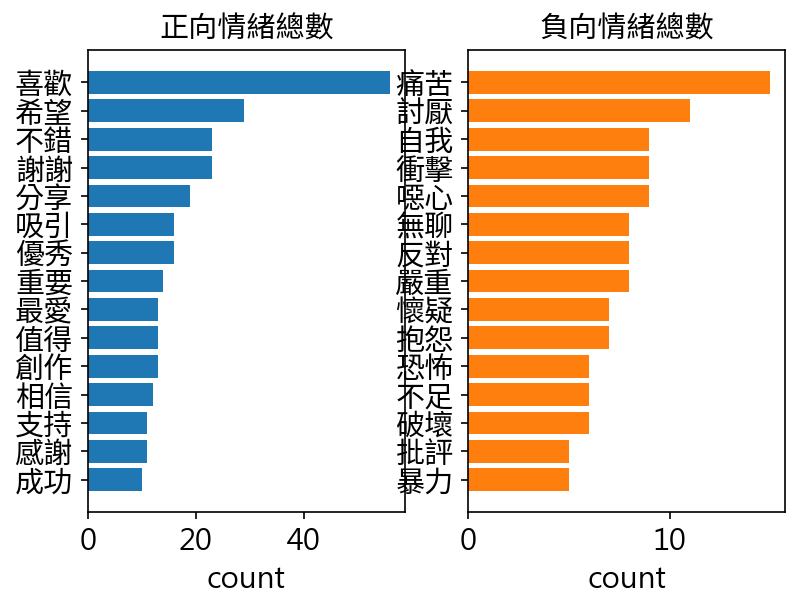

In [113]:
word_count = ptt_liwc_df_revise.groupby(["word", "sentiments"]).size().reset_index()

word_count = word_count.rename(columns={0: "size"})
word_count = word_count.sort_values(["size"], ascending=False)

word_of_pos = word_count.loc[(word_count["sentiments"] == "positive")]
word_of_neg = word_count.loc[(word_count["sentiments"] == "negative")]

pos = word_of_pos.head(15).sort_values(["size"], ascending=True)
neg = word_of_neg.head(15).sort_values(["size"], ascending=True)

fig, ax = plt.subplots(1, 2)

ax[0].barh(pos["word"], pos["size"], color=colors[0])
ax[0].set_xlabel("count")
ax[0].set_yticklabels(pos["word"], fontproperties=fprop)
ax[0].set_title("正向情緒總數", fontproperties=fprop)

ax[1].barh(neg["word"], neg["size"], color=colors[1])
ax[1].set_xlabel("count")
ax[1].set_yticklabels(neg["word"], fontproperties=fprop)
ax[1].set_title("負向情緒總數", fontproperties=fprop)

重新繪製情緒分數趨勢折線圖

Text(0.5, 1.0, '正負情緒分數趨勢折線圖')

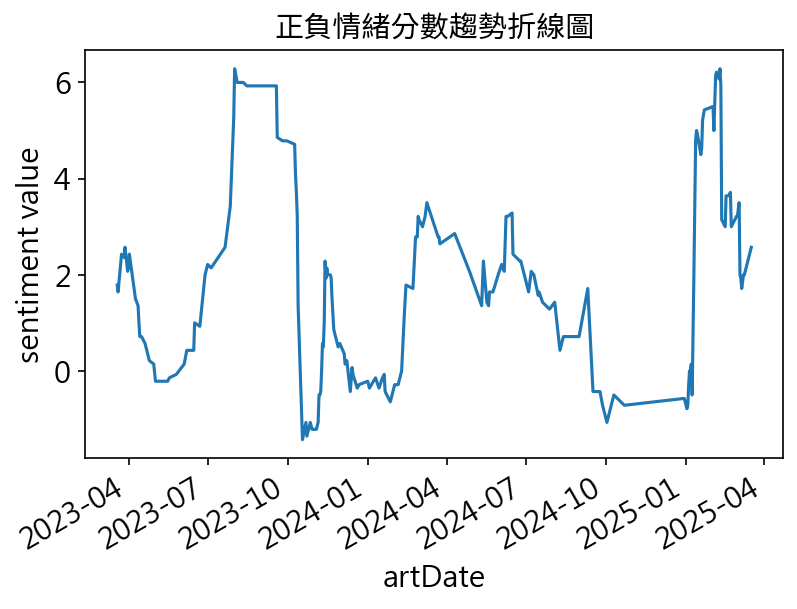

In [114]:
sentiment_count_revise = pd.DataFrame(
    ptt_liwc_df_revise.groupby(["artDate", "sentiments"]).size()
).reset_index()

mask = (sentiment_count_revise['sentiments'] == "positive") | (sentiment_count_revise['sentiments'] == "negative") 
sentiment_count_revise = sentiment_count_revise.loc[mask]

sentiment_count_revise = sentiment_count_revise.rename(columns={0: "size"})
sentiment_count_revise = sentiment_count_revise.sort_values(["artDate"])

ptt_sentiment_value_revise = (
    sentiment_count_revise.pivot_table(
        index="artDate", columns="sentiments", values="size", fill_value=0
    )
    .reset_index()
    .rename_axis(None, axis=1)
)

# sentiment 計算方式: positive - negative
ptt_sentiment_value_revise["sentiment_value"] = (
    ptt_sentiment_value_revise["positive"]
    - ptt_sentiment_value_revise["negative"]
)

# 繪製情緒分數趨勢圖
fig, ax = plt.subplots()

rolling_days = 14
ax.plot(ptt_sentiment_value_revise["artDate"], ptt_sentiment_value_revise["sentiment_value"].rolling(rolling_days).mean())
ax.set_xlabel("artDate")
ax.set_ylabel("sentiment value")
fig.autofmt_xdate()
plt.title("正負情緒分數趨勢折線圖", fontproperties=fprop)

重新查看每個詞彙為正向或負向，以及其所屬的文章內容為正向或負向

In [115]:
ptt_liwc_df_revise = pd.merge(ptt_liwc_df_revise, ptt_sentiment_value_by_article[['artUrl', 'sentiment_class']], how="left")
ptt_liwc_df_revise.head()

,artUrl,artDate,artTitle,artContent,word,sentiments,sentiment_class
0,https://www.ptt.cc/bbs/movie/M.1676932822.A.13...,2023-02-21,[爆好雷]必看！鬼滅之刃：上弦集結，前進刀匠村,先說我不是很資深鬼滅之刃的鐵粉，\n單純喜歡這部作品的故事與作畫，\n我最愛的作品是《進擊的...,先說,NaN,正向
1,https://www.ptt.cc/bbs/movie/M.1676932822.A.13...,2023-02-21,[爆好雷]必看！鬼滅之刃：上弦集結，前進刀匠村,先說我不是很資深鬼滅之刃的鐵粉，\n單純喜歡這部作品的故事與作畫，\n我最愛的作品是《進擊的...,資深,NaN,正向
2,https://www.ptt.cc/bbs/movie/M.1676932822.A.13...,2023-02-21,[爆好雷]必看！鬼滅之刃：上弦集結，前進刀匠村,先說我不是很資深鬼滅之刃的鐵粉，\n單純喜歡這部作品的故事與作畫，\n我最愛的作品是《進擊的...,鬼滅,NaN,正向
3,https://www.ptt.cc/bbs/movie/M.1676932822.A.13...,2023-02-21,[爆好雷]必看！鬼滅之刃：上弦集結，前進刀匠村,先說我不是很資深鬼滅之刃的鐵粉，\n單純喜歡這部作品的故事與作畫，\n我最愛的作品是《進擊的...,之刃,NaN,正向
4,https://www.ptt.cc/bbs/movie/M.1676932822.A.13...,2023-02-21,[爆好雷]必看！鬼滅之刃：上弦集結，前進刀匠村,先說我不是很資深鬼滅之刃的鐵粉，\n單純喜歡這部作品的故事與作畫，\n我最愛的作品是《進擊的...,鐵粉,NaN,正向


以artUrl及sentiment_class與前面斷句過後的結果作合併

查看每個句子他所屬於的文章為正向或負向

In [116]:
sent_df = pd.merge(sent_df, ptt_sentiment_value_by_article[['artUrl', 'sentiment_class']], how="left")
sent_df.head()

,artUrl,artTitle,artDate,artContent,sentence,sentiment_class
0,https://www.ptt.cc/bbs/movie/M.1676932822.A.13...,[爆好雷]必看！鬼滅之刃：上弦集結，前進刀匠村,2023-02-21,先說我不是很資深鬼滅之刃的鐵粉，\n單純喜歡這部作品的故事與作畫，\n我最愛的作品是《進擊的...,先說我不是很資深鬼滅之刃的鐵粉,正向
1,https://www.ptt.cc/bbs/movie/M.1676932822.A.13...,[爆好雷]必看！鬼滅之刃：上弦集結，前進刀匠村,2023-02-21,先說我不是很資深鬼滅之刃的鐵粉，\n單純喜歡這部作品的故事與作畫，\n我最愛的作品是《進擊的...,單純喜歡這部作品的故事與作畫,正向
2,https://www.ptt.cc/bbs/movie/M.1676932822.A.13...,[爆好雷]必看！鬼滅之刃：上弦集結，前進刀匠村,2023-02-21,先說我不是很資深鬼滅之刃的鐵粉，\n單純喜歡這部作品的故事與作畫，\n我最愛的作品是《進擊的...,我最愛的作品是進擊的巨人,正向
3,https://www.ptt.cc/bbs/movie/M.1676932822.A.13...,[爆好雷]必看！鬼滅之刃：上弦集結，前進刀匠村,2023-02-21,先說我不是很資深鬼滅之刃的鐵粉，\n單純喜歡這部作品的故事與作畫，\n我最愛的作品是《進擊的...,是巨人鑽石粉沒人想知道 XDDD,正向
4,https://www.ptt.cc/bbs/movie/M.1676932822.A.13...,[爆好雷]必看！鬼滅之刃：上弦集結，前進刀匠村,2023-02-21,先說我不是很資深鬼滅之刃的鐵粉，\n單純喜歡這部作品的故事與作畫，\n我最愛的作品是《進擊的...,當初看了2個月前的預告之後,正向


根據前面的情緒分數趨勢折線圖可見，在2025年1月後，分數有產生了劇烈的變動，因此以2025-01-01至2025-03-19這段時間來查看

針對負向文章做查看

In [117]:
date = "2025-01-01"
end_date = "2025-03-19"
mask = (ptt_liwc_df_revise['artDate'] >= pd.Timestamp(date).date()) & (
    ptt_liwc_df_revise['artDate'] <= pd.Timestamp(end_date).date()) & (
    ptt_liwc_df_revise['sentiment_class'] == "負向")

ptt_df_wc = ptt_liwc_df_revise.loc[mask]
ptt_df_wc.head(10)

,artUrl,artDate,artTitle,artContent,word,sentiments,sentiment_class
5247,https://www.ptt.cc/bbs/movie/M.1735798224.A.77...,2025-01-02,[新聞]地鳴襲來！《進擊的巨人》完結篇1月史詩,新聞網址：\nhttps://news.tvbs.com.tw/entertainment/...,網址,NaN,負向
5248,https://www.ptt.cc/bbs/movie/M.1735798224.A.77...,2025-01-02,[新聞]地鳴襲來！《進擊的巨人》完結篇1月史詩,新聞網址：\nhttps://news.tvbs.com.tw/entertainment/...,全場,NaN,負向
5249,https://www.ptt.cc/bbs/movie/M.1735798224.A.77...,2025-01-02,[新聞]地鳴襲來！《進擊的巨人》完結篇1月史詩,新聞網址：\nhttps://news.tvbs.com.tw/entertainment/...,粉絲,NaN,負向
5250,https://www.ptt.cc/bbs/movie/M.1735798224.A.77...,2025-01-02,[新聞]地鳴襲來！《進擊的巨人》完結篇1月史詩,新聞網址：\nhttps://news.tvbs.com.tw/entertainment/...,哭成,NaN,負向
5251,https://www.ptt.cc/bbs/movie/M.1735798224.A.77...,2025-01-02,[新聞]地鳴襲來！《進擊的巨人》完結篇1月史詩,新聞網址：\nhttps://news.tvbs.com.tw/entertainment/...,淚海,NaN,負向
5252,https://www.ptt.cc/bbs/movie/M.1735798224.A.77...,2025-01-02,[新聞]地鳴襲來！《進擊的巨人》完結篇1月史詩,新聞網址：\nhttps://news.tvbs.com.tw/entertainment/...,完結篇,NaN,負向
5253,https://www.ptt.cc/bbs/movie/M.1735798224.A.77...,2025-01-02,[新聞]地鳴襲來！《進擊的巨人》完結篇1月史詩,新聞網址：\nhttps://news.tvbs.com.tw/entertainment/...,THE,NaN,負向
5254,https://www.ptt.cc/bbs/movie/M.1735798224.A.77...,2025-01-02,[新聞]地鳴襲來！《進擊的巨人》完結篇1月史詩,新聞網址：\nhttps://news.tvbs.com.tw/entertainment/...,LAST,NaN,負向
5255,https://www.ptt.cc/bbs/movie/M.1735798224.A.77...,2025-01-02,[新聞]地鳴襲來！《進擊的巨人》完結篇1月史詩,新聞網址：\nhttps://news.tvbs.com.tw/entertainment/...,ATTACK,NaN,負向
5256,https://www.ptt.cc/bbs/movie/M.1735798224.A.77...,2025-01-02,[新聞]地鳴襲來！《進擊的巨人》完結篇1月史詩,新聞網址：\nhttps://news.tvbs.com.tw/entertainment/...,將於明,NaN,負向


可以看到在負向文章中，所較多的詞彙為下表所示

In [118]:
date = "2025-01-01"
end_date = "2025-03-19"
mask = (ptt_liwc_df_revise['artDate'] >= pd.Timestamp(date).date()) & (
    ptt_liwc_df_revise['artDate'] <= pd.Timestamp(end_date).date()) & (
    ptt_liwc_df_revise['sentiment_class'] == "負向")

ptt_df_wc = ptt_liwc_df_revise.loc[mask, ["artDate", "word"]]


word_count_count = pd.DataFrame(
    ptt_df_wc.groupby(["word"]).size()
).reset_index().rename(columns={0: "size"})

word_count_count = word_count_count.sort_values(by='size', ascending=False)
word_count_count.head(10)

,word,size
80,上映,12
577,票房,10
291,完結篇,9
38,LAST,9
174,劇情,9
173,劇場版,9
564,看完,9
27,ATTACK,8
684,觀眾,8
246,地震,8


將上述結果繪製成文字雲

(-0.5, 1599.5, 799.5, -0.5)

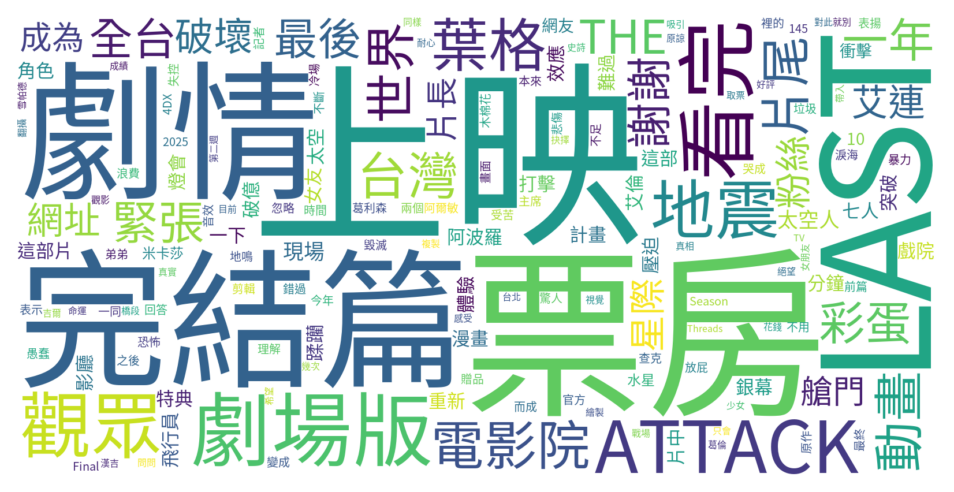

In [119]:
# wordcloud 的 input 是 dictionary
font_path = "./raw_data/SourceHanSansTW-Regular.otf"  # 中文字型路徑
wc_dict = dict(zip(word_count_count['word'], word_count_count['size']))
cloud = WordCloud(scale = 4, max_words=200, background_color="white", font_path=font_path)
cloud.generate_from_frequencies(wc_dict)
# 繪圖
plt.figure(figsize=(8, 4), dpi=150)
plt.imshow(cloud, interpolation="bilinear")
plt.axis("off")
# plt.show()

根據這段期間內，文章情緒為負向，且根據劇情相關的部分，針對其所出現的負向情緒字繪製成文字雲

可以看到對於劇情的討論中，有出現以下文字雲所示的這些負面情緒字

(-0.5, 1599.5, 799.5, -0.5)

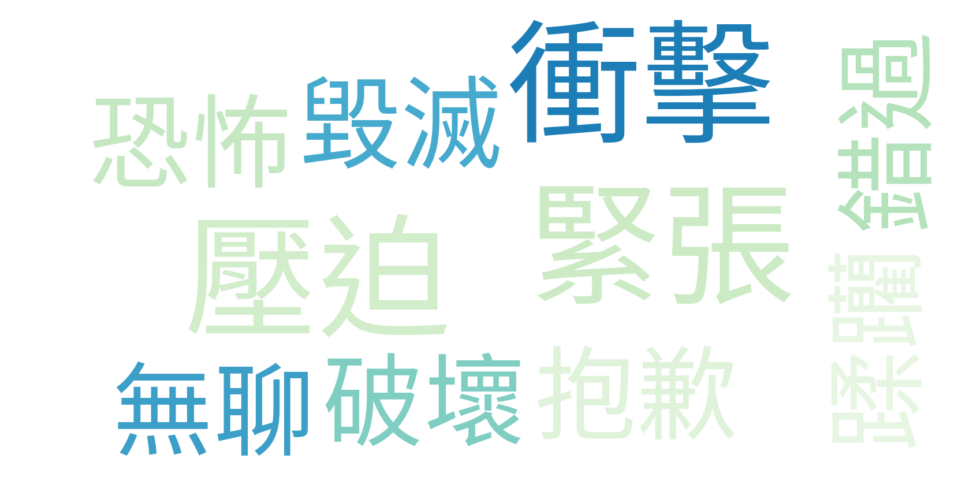

In [120]:
date = "2025-01-01"
end_date = "2025-03-19"
mask = (ptt_liwc_df_revise['artDate'] >= pd.Timestamp(date).date()) & (
    ptt_liwc_df_revise['artDate'] <= pd.Timestamp(end_date).date()) & ( # 時間區間
    ptt_liwc_df_revise['sentiment_class'] == "負向")  & ( # 負面文章
    ptt_liwc_df_revise['artContent'].str.contains('劇情')) & ( 
    ptt_liwc_df_revise["sentiments"] == "negative") # 負面情緒字

ptt_df_wc = ptt_liwc_df_revise.loc[mask, ["artDate", "word"]]
wc = ptt_df_wc.groupby(["word"]).size().to_dict()

# wordcloud 的 input 是 dictionary
cloud = WordCloud(scale = 4, max_words=200, background_color="white", font_path=font_path, colormap="GnBu")
cloud.generate_from_frequencies(wc)
# 繪圖
plt.figure(figsize=(8, 4), dpi=150)
plt.imshow(
    cloud, 
    interpolation="bilinear"
)
plt.axis("off")
# plt.show()

針對劇情以及破壞共同出現的部分，查看其文章中的句子內容

可以看到對於有人詢問 進擊的巨人完結篇沒看過動畫看得懂嗎?

得到的回覆是較為負面的

In [121]:
date = "2025-01-01"
end_date = "2025-03-19"
#sent_df['artDate'] = pd.to_datetime(sent_df['artDate']).dt.date
mask = (sent_df['artDate'] >= pd.Timestamp(date).date()) & (
    sent_df['artDate'] <= pd.Timestamp(end_date).date()) & (
    sent_df['sentiment_class'] == "負向") & (
    sent_df['artContent'].str.contains('劇情')) & (
    sent_df['sentence'].str.contains('破壞')) # 包含「缺點」的句子

df_ = sent_df.loc[mask, ["artDate", "artContent", "sentence"]]
index_list = df_.index.tolist()


# 取得前後各5筆的索引 => 目的為查看包含該詞彙句子的上下文
surrounding_indices = []
for index in index_list:
    surrounding_indices.extend(range(index - 5, index + 6))

# 去除重複的索引，並確保不超出範圍
surrounding_indices = list(set(filter(lambda x: x >= 0 and x < len(sent_df), surrounding_indices)))

# 依據索引取得相應的資料
result_df = sent_df.iloc[surrounding_indices].sort_index()
result_df[['artTitle', 'sentence', 'sentiment_class']]

,artTitle,sentence,sentiment_class
1715,Re:[討論]進擊的巨人完結篇沒看過動畫看得懂嗎？,然後出牆之後的真實世界和你現在所理解的巨人世界,負向
1716,Re:[討論]進擊的巨人完結篇沒看過動畫看得懂嗎？,世界觀邏輯上毫無關連,負向
1717,Re:[討論]進擊的巨人完結篇沒看過動畫看得懂嗎？,連看漫畫可能都要刷個幾次才完全理解,負向
1718,Re:[討論]進擊的巨人完結篇沒看過動畫看得懂嗎？,不過你看完這電影,負向
1719,Re:[討論]進擊的巨人完結篇沒看過動畫看得懂嗎？,雖然看不懂,負向
1720,Re:[討論]進擊的巨人完結篇沒看過動畫看得懂嗎？,但會完全破壞我上述所說的劇情體驗,負向
1721,Re:[討論]進擊的巨人完結篇沒看過動畫看得懂嗎？,所以不要浪費錢去看完後,負向
1722,Re:[討論]進擊的巨人完結篇沒看過動畫看得懂嗎？,嫌這一部片是爛片,負向
1723,Re:[討論]進擊的巨人完結篇沒看過動畫看得懂嗎？,因為你會覺得對話很多很無聊,負向
1724,Re:[討論]進擊的巨人完結篇沒看過動畫看得懂嗎？,然後因為看不懂回過頭去看前幾季,負向


In [ ]:
from ckiptagger import data_utils, construct_dictionary, WS, POS, NER
import re
from wordcloud import WordCloud
import pandas as pd
import matplotlib.pyplot as plt
import time
import datetime

In [ ]:
plt.rcParams['font.sans-serif'] = ['Microsoft JhengHei'] #設定中文字型

In [ ]:
ws = WS("./data")
pos = POS("./data")
ner = NER("./data")

In [ ]:
df = pd.read_csv('./raw_data/merge.csv') #讀檔
df.head(3)

,system_id,artUrl,artTitle,artDate,artPoster,artCatagory,artContent,artComment,e_ip,insertedDate,dataSource
0,1,https://www.ptt.cc/bbs/movie/M.1676932822.A.13...,[爆好雷]必看！鬼滅之刃：上弦集結，前進刀匠村,2023/2/21 06:40,toebb,movie,先說我不是很資深鬼滅之刃的鐵粉，\n單純喜歡這部作品的故事與作畫，\n我最愛的作品是《進擊的...,"[{""cmtStatus"": ""推"", ""cmtPoster"": ""yayappp"", ""c...",42.74.120.9,2023/2/23 02:12,ptt
1,2,https://www.ptt.cc/bbs/movie/M.1676944836.A.AE...,Re:[請益]漫威系列是出了啥問題,2023/2/21 10:00,moshenisshit,movie,單純只是一系列結束，\n\n沒辦法再用這個宇宙創造什麼新玩法吧，\n\n幾年前《無限傳奇篇》...,"[{""cmtStatus"": ""推"", ""cmtPoster"": ""Luos"", ""cmtC...",136.23.35.39,2023/2/23 02:12,ptt
2,3,https://www.ptt.cc/bbs/movie/M.1678101798.A.1D...,[好雷]拖到現在才看的灌籃高手,2023/3/6 19:23,walkmaster,movie,雷文防雷資訊頁\n\n\n\n~*-*~*-*~*-*~*-*~*-*~*-*~*-*~*-...,"[{""cmtStatus"": ""推"", ""cmtPoster"": ""cashko"", ""cm...",61.228.209.193,2023/3/7 02:07,ptt


前處理、斷詞、斷句

In [ ]:
def Segmentation_Core(data, tokenizer):
    # 將所有的斷行字元配上 escape 以防失效
    regexPattern = '|'.join(map(re.escape, tokenizer))
    output_list = re.split(regexPattern, data)
    # 過濾空白行
    output_list = list(filter(None, output_list))
    return output_list

def Sentence_Segmentation(article, keep_digits=False, keep_alphabets=False):
    """ Sentence_Segmentation function 用於執行中文斷行任務

    順序如下：
    1. 去除(\\n)
    2. 去除特殊符號字元
    3. 保留數字
    4. 依照斷句字元進行斷句全形的分號、逗號、句號、問號以及驚嘆號
    5. 避免空白斷句結果

    Args:
        article(string): 欲斷行之文章內容
        keep_digits(Boolean): 決定是否保留數字於斷行後的結果
        keep_alphabets(Boolean): 決定是否保留字母於斷行後的結果
    Returns:
        List [] 每個 element 就是一行
    """
    sepical_symbols = r'[.＂<>:《》+\-=#$%&()*@＃＄％＆＇\(\)\[\]\{\}（）＊＋－／：\
    ＜＝＞＠［＼］＾＿｀｛｜｝～｟｠｢｣､、〃》「」『』【】〔〕〖〗〘〙〚〛〜〝〞〟〰〾〿–—一‘’‛“”„‟…‧﹏★→─]+'
    segmentation_used_note = (";", "；", "！", "!", "？", "?", "。")
    

    paragraphs = list(filter(lambda x: re.sub(r'\s+','', x), article.split("\n")))
    # print(len(paragraphs))
    # print(paragraphs)
    
    result = []
    for paragraph in paragraphs:

        clean_paragraph = paragraph
        try:
            if not keep_digits:
                clean_paragraph = re.sub(r'\d*\.?\d+','', clean_paragraph) #remove space & digits
            if not keep_alphabets:
                clean_paragraph = re.sub('[a-zA-Z]+', '', clean_paragraph)
            
            clean_paragraph = re.sub(r'[\s]+','', clean_paragraph) #remove space
            
            clean_paragraph = re.sub(sepical_symbols,'',clean_paragraph)
            
        except:
            return "error"
        
        res = Segmentation_Core(clean_paragraph, segmentation_used_note)
        result.append(res)
    
    return result

In [ ]:
with open('dict/user_dict.txt') as f: #使用自訂義斷詞字典
    lines = f.read().splitlines()

dict = {k.split()[0]: k.split()[1] for v, k in enumerate(lines)}
dictionary2 = construct_dictionary(dict)
print(dictionary2)

[(2, {'地鳴': 500.0}), (3, {'女巨人': 500.0, '阿爾敏': 500.0, '憲兵團': 500.0, '不足以': 500.0, '世界觀': 500.0}), (4, {'鎧之巨人': 500.0, '盔甲巨人': 500.0, '帥之巨人': 500.0, '獸之巨人': 500.0, '顎之巨人': 500.0, '戰錘巨人': 500.0, '車力巨人': 500.0, '始祖巨人': 500.0, '調查兵團': 500.0, '調查軍團': 500.0, '駐紮兵團': 500.0, '駐紮軍團': 500.0, '自由之翼': 500.0}), (5, {'進擊的巨人': 500.0, '超大型巨人': 500.0}), (6, {'立體機動裝置': 500.0})]


POS、NER處理

In [ ]:
def get_pos(post_id, word_sentence, pos_sentence):
    tokens = []
    # print("\nPOS: ", end="\u3000")
    assert len(word_sentence) == len(pos_sentence)
    for word, pos in zip(word_sentence, pos_sentence): # token level
        tokens.append([post_id, word, pos]) 
    # print(f"{word}({pos})", end="\u3000")
    return tokens

def get_ner(post_id, entity_sentence):
    entities = []
    # print("\nNER:___________ ")
    for entity in sorted(entity_sentence): # token level
        entities.append([post_id, entity[3], entity[2]]) 
    return entities

def get_nlp_result(data_df):
    start = time.time()

    pos_list = []
    entity_list = []
    sentence_list = []
    
    # 遍歷 dataframe 的每筆資料
    for index, row in data_df.iterrows(): # document level    
    # print(f"\ndocument {index}") 

        # 資料清理 ＆ 斷句
        tmp = Sentence_Segmentation(row['artContent']) 
        flat_list = [item for sublist in tmp for item in sublist]

        # ckip
        word_sentence_list = ws(flat_list, coerce_dictionary = dictionary2)
        pos_sentence_list = pos(word_sentence_list)
        entity_sentence_list = ner(word_sentence_list, pos_sentence_list)

        # 遍歷該 document 中的每一個句子
        for i, sentence in enumerate(flat_list):
            # print(f"sentence {i}: {sentence}")
            sentence_list.append([row['system_id'], sentence])            
            temp_tokens = get_pos(row['system_id'], word_sentence_list[i], pos_sentence_list[i])
            temp_entites = get_ner(row['system_id'], entity_sentence_list[i])

            pos_list.append(temp_tokens)
            if len(temp_entites) != 0:
                entity_list.append(temp_entites)
            
    pos_flat = [item for sublist in pos_list for item in sublist]
    entity_flat = [item for sublist in entity_list for item in sublist]

    pos_table = pd.DataFrame(data=pos_flat, 
                    columns=['system_id','word','pos'])        
    
    entity_table = pd.DataFrame(data=entity_flat, 
                        columns=['system_id','word','ner']) 

    sentence_table = pd.DataFrame(data=sentence_list, 
                    columns=['system_id','sentence']) 

    end = time.time()
    print("time costing: {}".format(end - start))

    return pos_table, entity_table, sentence_table

斷句結果

In [ ]:
tmp = Sentence_Segmentation(df['artContent'][0]) 
flat_list = [item for sublist in tmp for item in sublist]
print(tmp[:5])
print(flat_list[:5])

[['先說我不是很資深鬼滅之刃的鐵粉，'], ['單純喜歡這部作品的故事與作畫，'], ['我最愛的作品是進擊的巨人'], ['是巨人鑽石粉沒人想知道'], ['當初看了個月前的預告之後，']]
['先說我不是很資深鬼滅之刃的鐵粉，', '單純喜歡這部作品的故事與作畫，', '我最愛的作品是進擊的巨人', '是巨人鑽石粉沒人想知道', '當初看了個月前的預告之後，']


In [ ]:
pos_table, entity_table, sentence_table = get_nlp_result(df)

time costing: 62.88750410079956


In [ ]:
pos_table.head() # word pos 列表

,system_id,word,pos
0,1,先,D
1,1,說,VE
2,1,我,Nh
3,1,不,D
4,1,是,SHI


In [ ]:
entity_table.head() # word entity 列表

,system_id,word,ner
0,1,個月,DATE
1,1,刀匠村,WORK_OF_ART
2,1,刀匠村,GPE
3,1,遊郭篇,WORK_OF_ART
4,1,第天,DATE


In [ ]:
sentence_table.head()

,system_id,sentence
0,1,先說我不是很資深鬼滅之刃的鐵粉，
1,1,單純喜歡這部作品的故事與作畫，
2,1,我最愛的作品是進擊的巨人
3,1,是巨人鑽石粉沒人想知道
4,1,當初看了個月前的預告之後，


In [ ]:
print(f"total posts numbers: {len(pos_table['system_id'].unique())}") # 209篇文
print(f"posts have NER: {len(entity_table['system_id'].unique())}") # 197篇有抓到ner

total posts numbers: 209
posts have NER: 197


將結果存成csv

In [ ]:
pos_table.to_csv('raw_data/pos_table_merge.csv', index = False)
entity_table.to_csv('raw_data/entity_table_merge.csv', index = False)
sentence_table.to_csv('raw_data/sentence_table_merge.csv', index = False)

In [ ]:
pos_table = pd.read_csv("raw_data/pos_table_merge.csv") 
entity_table = pd.read_csv("raw_data/entity_table_merge.csv") 
sentence_table = pd.read_csv("raw_data/sentence_table_merge.csv") 

In [ ]:
entity_table['ner'].unique() #有哪些實體

array(['DATE', 'WORK_OF_ART', 'GPE', 'CARDINAL', 'TIME', 'FAC', 'ORDINAL',
       'PERSON', 'ORG', 'NORP', 'EVENT', 'LANGUAGE', 'MONEY', 'LOC',
       'QUANTITY', 'PRODUCT', 'LAW'], dtype=object)

各實體數量

In [ ]:
ner_count = entity_table.groupby(['ner'])['ner'].count().reset_index(name='count').sort_values(['count'], ascending=False).head(10)
ner_count

,ner,count
12,PERSON,1501
4,GPE,589
1,DATE,392
0,CARDINAL,280
11,ORG,277
9,NORP,157
10,ORDINAL,103
7,LOC,89
5,LANGUAGE,88
15,TIME,78


繪製NER長條圖，以人名出現最多

Text(0.5, 0, 'Frequency')

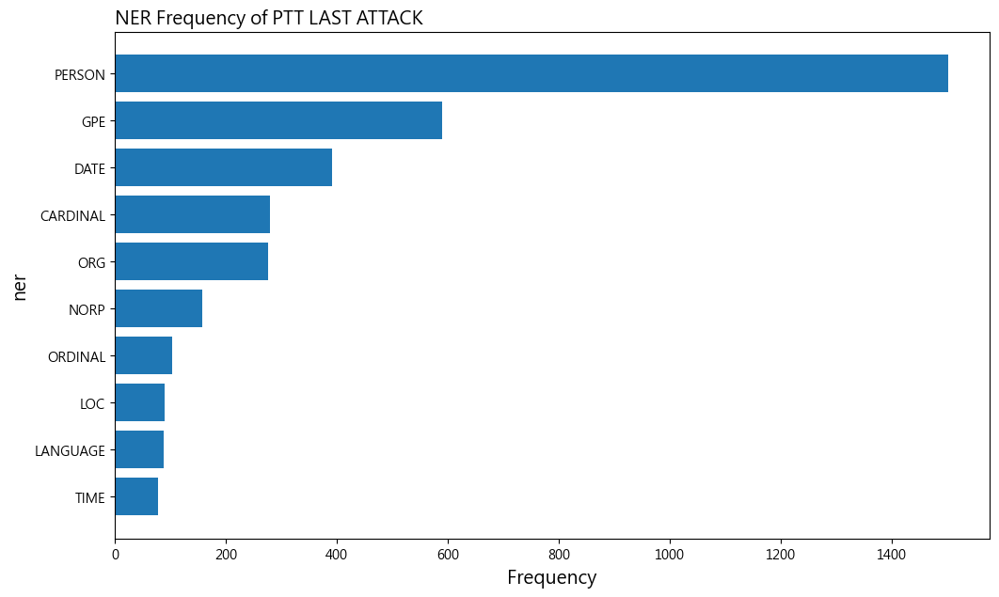

In [ ]:
ner = ner_count['ner']
count = ner_count['count']

fig, ax = plt.subplots(figsize =(12, 7))
ax.barh(ner, count)
ax.invert_yaxis()
ax.set_title('NER Frequency of PTT LAST ATTACK',loc ='left', size = 14)
ax.set_ylabel('ner', size = 14)
ax.set_xlabel('Frequency', size = 14)

繪製NORP中出現的分布長條圖

可以看到討論度最高的為日本以及動漫中的國家，艾爾迪亞人

Text(0.5, 0, 'Word Frequency')

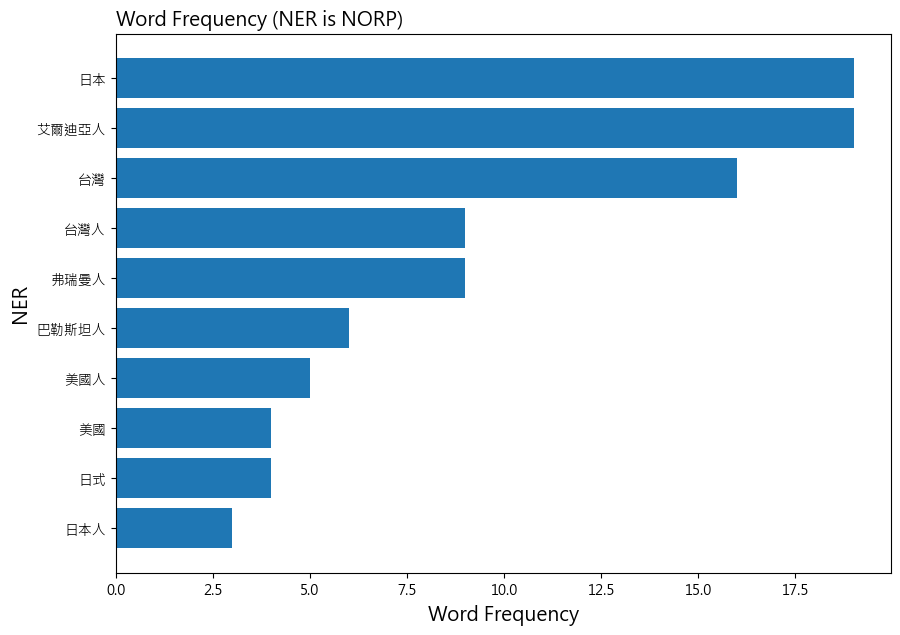

In [ ]:
# 篩選ner為NORP的資料
l_noun = ["NORP"]
NORP = entity_table[entity_table.ner.isin(l_noun)]

# # 計算每個名詞提到的次數，選出前10個
ner_count = NORP.groupby('word')['word'].agg(['count'])
ner_count = ner_count.sort_values(['count'],ascending=False)['count'].nlargest(10).reset_index()
ner_count

# 設定中文字形
word = ner_count['word']
count = ner_count['count']

fig, ax = plt.subplots(figsize =(10, 7))
ax.barh(word, count)
ax.invert_yaxis()
ax.set_title('Word Frequency (NER is NORP)',loc ='left', size = 14)
ax.set_ylabel('NER', size = 14)
ax.set_xlabel('Word Frequency', size = 14)
# fig.show()

繪製ORG出現的分布長條圖

必勝客主要因為其推出進擊的巨人的披薩，提高了討論度

國民黨則是不滿遭到使用進擊的巨人梗圖做影射

調查兵團則為動漫中的一個軍團單位

Text(0.5, 0, 'Word Frequency')

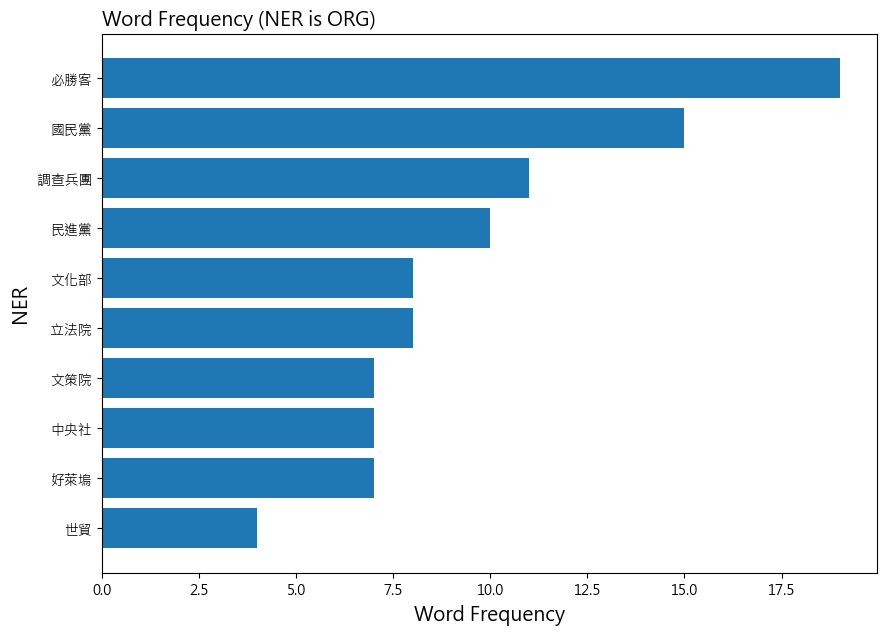

In [ ]:
# 篩選ner為ORG的資料
l_noun = ["ORG"]
ORG = entity_table[entity_table.ner.isin(l_noun)]

# # 計算每個名詞提到的次數，選出前10個
ner_count = ORG.groupby('word')['word'].agg(['count'])
ner_count = ner_count.sort_values(['count'],ascending=False)['count'].nlargest(10).reset_index()
ner_count

# 設定中文字形
word = ner_count['word']
count = ner_count['count']

fig, ax = plt.subplots(figsize =(10, 7))
ax.barh(word, count)
ax.invert_yaxis()
ax.set_title('Word Frequency (NER is ORG)',loc ='left', size = 14)
ax.set_ylabel('NER', size = 14)
ax.set_xlabel('Word Frequency', size = 14)
# fig.show()

繪製PERSON出現的分布長條圖

艾連、米卡莎主要為動漫中的主角人物

賴清德則是曾經與卓榮泰的關係被比喻成進擊的巨人

Text(0.5, 0, 'Word Frequency')

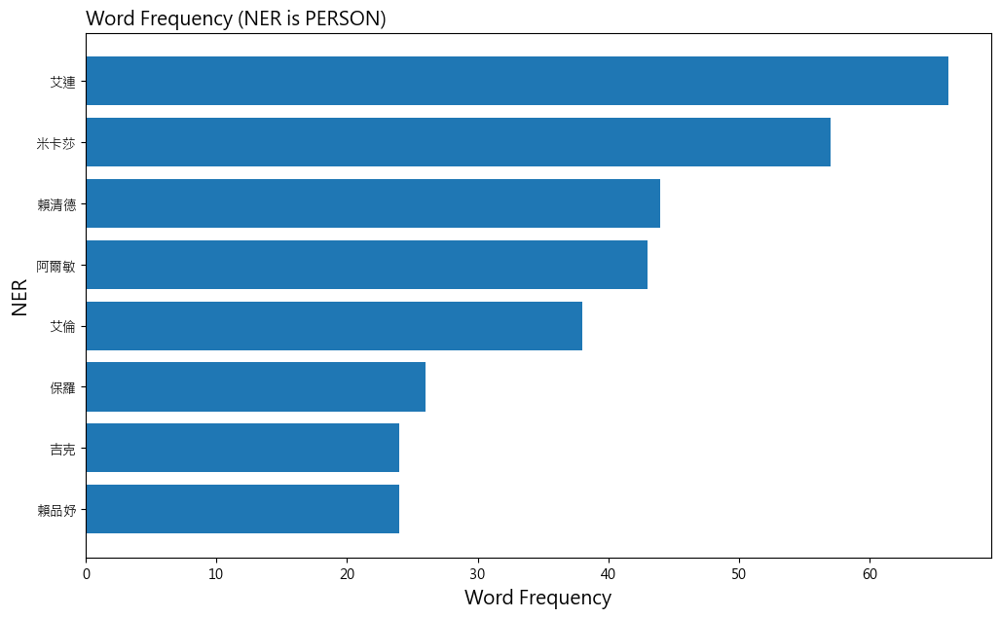

In [ ]:
# 篩選ner為PERSON的資料
l_noun = ["PERSON"]
PERSON = entity_table[entity_table.ner.isin(l_noun)]

# 計算每個名詞提到的次數，選出前8個
ner_count = PERSON.groupby('word')['word'].agg(['count'])
ner_count = ner_count.sort_values(['count'],ascending=False)['count'].nlargest(8).reset_index()

# 設定中文字形
word = ner_count['word']
count = ner_count['count']

fig, ax = plt.subplots(figsize =(12, 7))
ax.barh(word, count)
ax.invert_yaxis()
ax.set_title('Word Frequency (NER is PERSON)',loc ='left', size = 14)
ax.set_ylabel('NER', size = 14)
ax.set_xlabel('Word Frequency', size = 14)
# fig.show()

以艾連做關鍵字尋找相關貼文

In [ ]:
keyword_list = ['艾連']
Allen_selected = df[df['artContent'].str.contains('|'.join(keyword_list),regex=True)]
print(f"{' '.join(keyword_list)}：{Allen_selected.shape[0]}篇相關貼文")
Allen_selected.head(3)

艾連：38篇相關貼文


,system_id,artUrl,artTitle,artDate,artPoster,artCatagory,artContent,artComment,e_ip,insertedDate,dataSource
9,10,https://www.ptt.cc/bbs/movie/M.1687950137.A.99...,[好雷]蜘蛛人穿越新宇宙－“反派”太正確,2023/6/28 19:02,j27910681,movie,蜘蛛人新宇宙是我看過最好看的動畫電影，也是我最喜歡的超級英雄電影。當我看到這部\n片要有續集...,"[{""cmtStatus"": ""推"", ""cmtPoster"": ""simon81345"",...",49.216.129.102,2023/6/29 02:37,ptt
16,3,https://www.ptt.cc/bbs/movie/M.1709805265.A.FB...,[心得負雷]《沙丘：第二部》,2024/3/7 17:54,lokazdszone,movie,雷文防雷資訊頁\n\n\n\n~*-*~*-*~*-*~*-*~*-*~*-*~*-*~*-...,"[{""cmtStatus"": ""推"", ""cmtPoster"": ""iam0718"", ""c...",61.227.224.181,2024/3/8 02:04,ptt
29,2,https://www.ptt.cc/bbs/movie/M.1735890747.A.D4...,Fw:[好雷]進擊的巨人完結篇THELASTATTACK,2025/1/3 15:52,lycs0908,movie,作者: lycs0908 (岳岳) 看板: C_Chat\n標題: [好雷] 進擊的巨人 完...,"[{""cmtStatus"": ""→"", ""cmtPoster"": ""mikiup0321"",...",1.165.69.125,2025/2/21 17:06,ptt


In [ ]:
pos_table['pos'].unique() #查看有哪些詞性

array(['D', 'VE', 'Nh', 'SHI', 'Dfa', 'VH', 'DE', 'Na', 'COMMACATEGORY',
       'VK', 'Nep', 'Nf', 'Caa', 'VA', 'Nb', 'VJ', 'Nd', 'VC', 'Di', 'Ng',
       'PARENTHESISCATEGORY', 'Neu', 'P', 'Nc', 'VCL', 'Neqa', 'V_2',
       'FW', 'Ncd', 'VAC', 'Cbb', 'VD', 'T', 'Nv', 'Da', 'VF', 'A', 'VHC',
       'VL', 'Nes', 'VG', 'VB', 'PERIODCATEGORY', 'Cab', 'VI', 'Dk', 'I',
       'Dfb', 'Cba', 'DM', 'Neqb', 'COLONCATEGORY'], dtype=object)

In [ ]:
pos_filter = pos_table[~pos_table.pos.isin(['COMMACATEGORY', 'PARENTHESISCATEGORY', 'PERIODCATEGORY', 'COLONCATEGORY'])] #標點符號外

pos_count = pos_filter.groupby(['pos'])['pos'].count().reset_index(name='count').sort_values(['count'], ascending=False).head(12) #列出大部分有哪些詞性
pos_count

,pos,count
15,Na,14093
5,D,6692
35,VC,4465
41,VH,3943
6,DE,3399
29,P,2469
17,Nc,2134
16,Nb,2056
27,Nh,1936
38,VE,1699


將上表繪製成長條圖

可以看到名詞出現的最多

C:\Users\k7256\AppData\Local\Temp\ipykernel_13816\2478466374.py:10: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  fig.show()


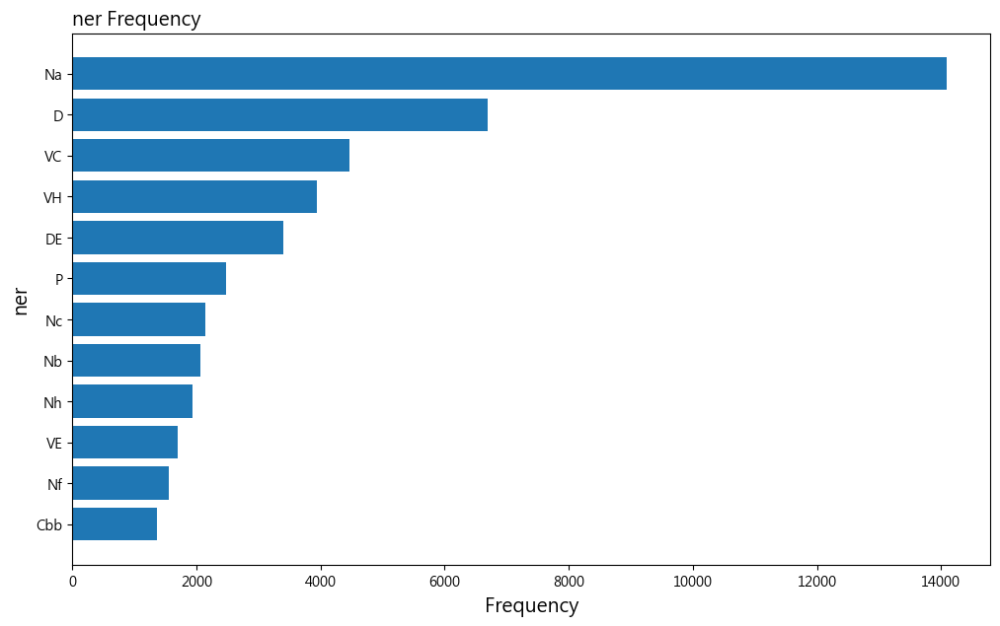

In [ ]:
pos = pos_count['pos']
count = pos_count['count']

fig, ax = plt.subplots(figsize =(12, 7))
ax.barh(pos, count)
ax.invert_yaxis()
ax.set_title('ner Frequency',loc ='left', size = 14)
ax.set_ylabel('ner', size = 14)
ax.set_xlabel('Frequency', size = 14)
fig.show()

In [ ]:
# 篩選pos為專有名詞的資料
l_noun = ["Nb"] #,"Na"
noun = pos_table[pos_table.pos.isin(l_noun)]

# 計算每個名詞提到的次數，選出前15個
noun_count = noun[['word']].groupby(['word'])['word'].count().reset_index(name='count').sort_values(['count'], ascending=False).head(15)
noun_count.head(10)

,word,count
574,艾連,71
507,米卡莎,58
755,阿爾敏,50
679,賴清德,44
694,進擊的巨人,44
559,艾倫,36
64,保羅,30
753,阿滴,28
654,諫山,27
122,吉克,24


將上表繪製成長條圖

C:\Users\k7256\AppData\Local\Temp\ipykernel_13816\488784228.py:11: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  fig.show()


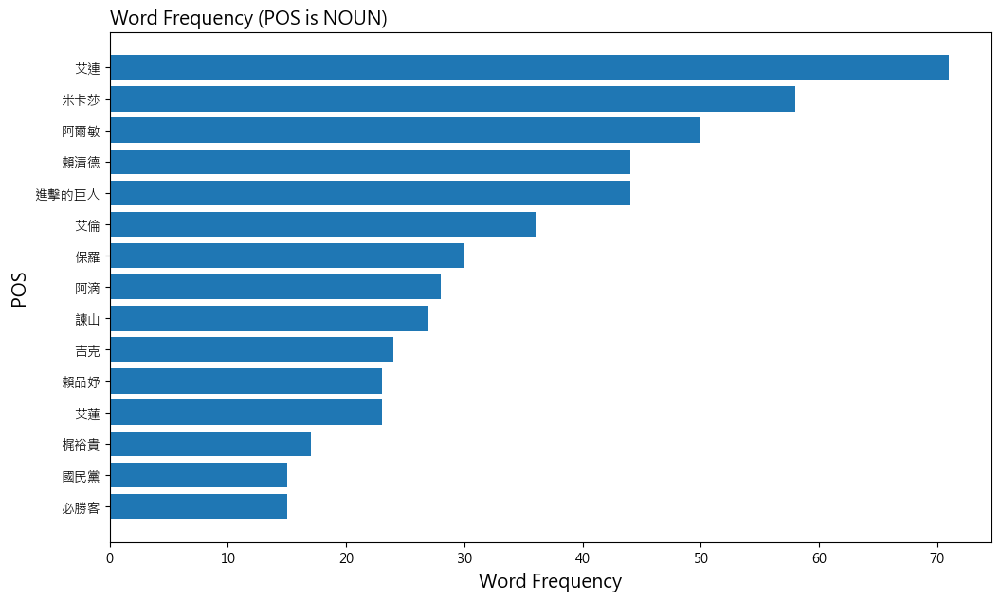

In [ ]:
# 設定中文字形
word = noun_count['word']
count = noun_count['count']

fig, ax = plt.subplots(figsize =(12, 7))
ax.barh(word, count)
ax.invert_yaxis()
ax.set_title('Word Frequency (POS is NOUN)',loc ='left', size = 14)
ax.set_ylabel('POS', size = 14)
ax.set_xlabel('Word Frequency', size = 14)
fig.show()

In [ ]:
l_verb = ["VC"] # ,"VH","VA"
verb = pos_table[pos_table.pos.isin(l_verb)] # 選取特定詞性(動詞)
verb = verb[verb['word'].map(len) > 1] # 把長度為1的字去除掉

verb_count = verb[['word']].groupby(['word'])['word'].count().reset_index(name='count').sort_values(['count'], ascending=False).head(15)
verb_count

,word,count
749,看完,62
755,看過,38
1036,選擇,37
1018,連結,28
455,接受,27
892,製作,26
323,引發,24
697,獻出,23
829,署名,23
994,轉載,23


將上表繪製成長條圖

C:\Users\k7256\AppData\Local\Temp\ipykernel_13816\29217454.py:10: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  fig.show()


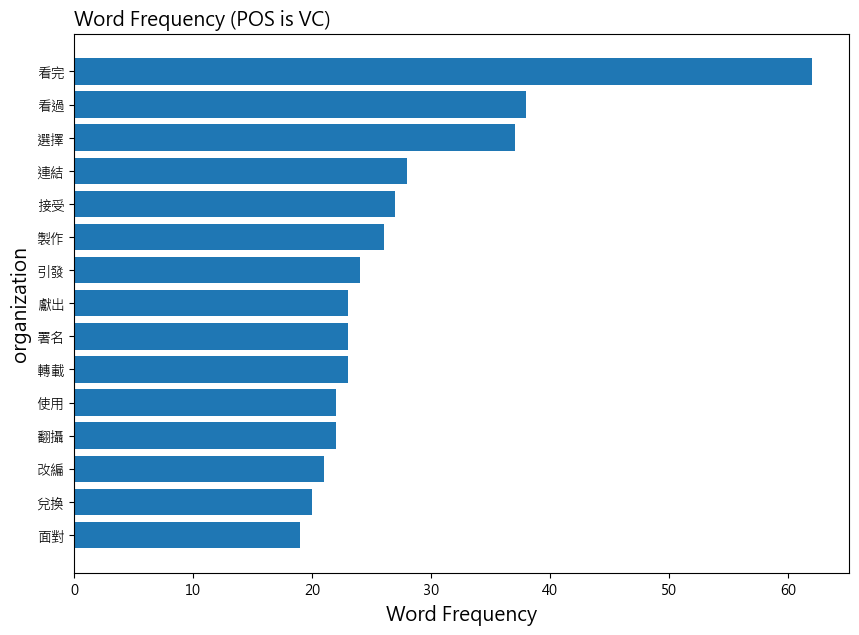

In [ ]:
word = verb_count['word']
count = verb_count['count']

fig, ax = plt.subplots(figsize =(10, 7))
ax.barh(word, count)
ax.invert_yaxis()
ax.set_title('Word Frequency (POS is VC)',loc ='left', size = 14)
ax.set_ylabel('organization', size = 14)
ax.set_xlabel('Word Frequency', size = 14)
fig.show()

In [ ]:
from snownlp import SnowNLP

尋找艾連相關的句子，查看其情緒表現

In [ ]:
sentence_table = pd.read_csv("raw_data/sentence_table_merge.csv") #匯資料

sentiment_date = pd.merge(sentence_table,Allen_selected[['system_id','artDate','dataSource']],on='system_id',how='left').dropna() #句子與日期合併
sentiment_date.head(5)

,system_id,sentence,artDate,dataSource
158,2,單純只是系列結束，,2025/1/3 15:52,ptt
159,2,沒辦法再用這個宇宙創造什麼新玩法吧，,2025/1/3 15:52,ptt
160,2,幾年前無限傳奇篇迎來大結局，,2025/1/3 15:52,ptt
161,2,現在要新開多元宇宙傳奇篇張力不如以往,2025/1/3 15:52,ptt
162,2,漫威宇宙就是個連載樣的概念，,2025/1/3 15:52,ptt


使用使用SnowNLP套件幫每個句子加上情緒分數

In [ ]:
def get_sentiment(sent):
    s = SnowNLP(sent)
    return s.sentiments

# 幫每句話加上情緒分數
sentiment_date['sentimentValue'] = sentiment_date.apply(lambda row : get_sentiment(row['sentence'],), axis = 1)
sentiment_date.head(3)

,system_id,sentence,artDate,dataSource,sentimentValue
158,2,單純只是系列結束，,2025/1/3 15:52,ptt,0.871876
159,2,沒辦法再用這個宇宙創造什麼新玩法吧，,2025/1/3 15:52,ptt,0.846193
160,2,幾年前無限傳奇篇迎來大結局，,2025/1/3 15:52,ptt,0.826361


分析結果統計

In [ ]:
sentiment_date['sentimentValue'].describe()

count    2.754000e+03
mean     4.525900e-01
std      3.275331e-01
min      2.522665e-07
25%      1.342213e-01
50%      4.579672e-01
75%      7.313907e-01
max      9.999995e-01
Name: sentimentValue, dtype: float64

繪製成圖

<Axes: >

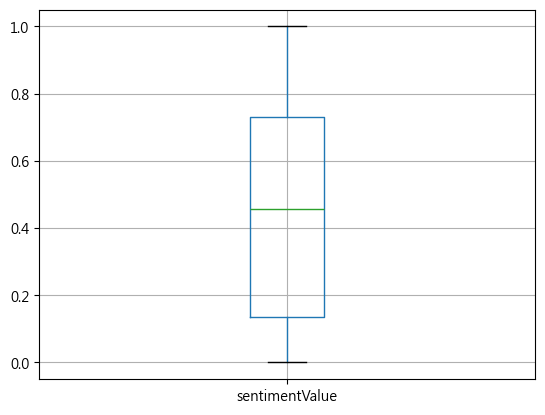

In [ ]:
boxplot = sentiment_date.boxplot(column=['sentimentValue'], showfliers=False)
boxplot

以artDate做分群，查看每日情緒分數

In [ ]:
sent_date = sentiment_date.copy()
sent_date['artDate'] =  pd.to_datetime(sentiment_date['artDate']).dt.to_period('M')

sentiment_count = sent_date.groupby(['artDate'])['sentimentValue'].mean().reset_index()
sentiment_count

,artDate,sentimentValue
0,2023-01,0.454977
1,2023-03,0.476191
2,2023-04,0.421973
3,2023-06,0.404864
4,2023-07,0.384928
5,2023-08,0.383282
6,2023-10,0.577756
7,2023-11,0.517879
8,2024-03,0.422435
9,2024-05,0.443590


繪製成圖

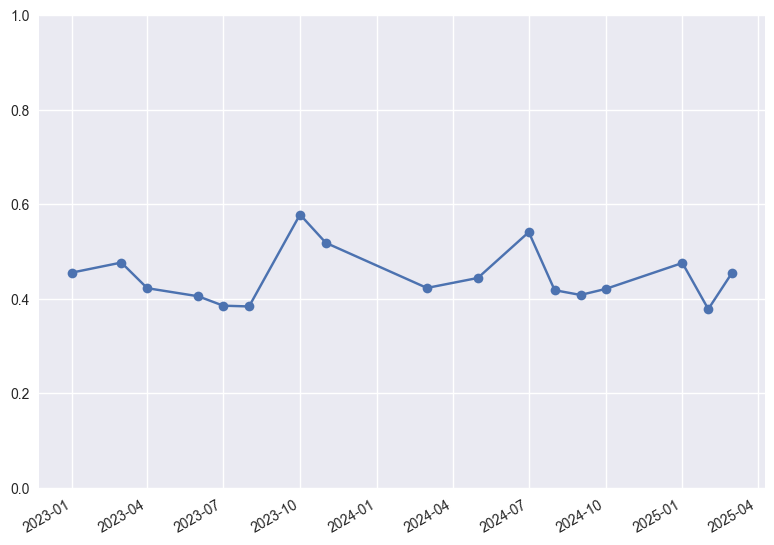

In [ ]:
months = [period.to_timestamp() for period in sentiment_count['artDate']]   # 將 PeriodIndex 中的每個 Period 物件轉換為對應的 datetime 物件
y = sentiment_count['sentimentValue']

plt.style.use('seaborn-v0_8')

plt.plot_date(months, y, linestyle='solid')
plt.gcf().autofmt_xdate()
plt.tight_layout()
plt.ylim(0, 1)

plt.show()

因2023-8左右情緒分數突然升高，因此查看該時間斷的文章句子

發現主要在討論梶裕貴(主角聲優)，且評價不錯

In [ ]:
filter_sentiment = sent_date[sent_date['artDate']=='2023-08']
filter_sentiment = filter_sentiment.loc[filter_sentiment['sentimentValue'] > 0.7]

filter_sentiment.head()

,system_id,sentence,artDate,dataSource,sentimentValue
4271,89,梶裕貴表示，配音過程非常需要專注力，而對他而言，萊納，你坐啊那幕是關鍵幕,2023-08,ptt,0.719659
4272,89,，象徵艾連與萊納的關係逆轉，當初也花了點心力思考如何呈現，我也聽說這句台詞很,2023-08,ptt,0.995406
4276,89,，讓我印象深刻,2023-08,ptt,0.801261
4278,89,地方有非常不可思議的緣分，能感受到台灣粉絲的笑容互動，讓他充滿能量,2023-08,ptt,0.754085
4282,89,家也可以觀察到角色身心後期出現很大變化，連他當初看漫畫也嚇到，讓我有個疑問是自,2023-08,ptt,0.995162


查看情緒分數大於0.7的句子中，每個詞所出現在的地方，情緒分數為多少

In [ ]:
# 把時間分數和之前斷詞的 token table 做 join
pos_words = pd.merge(filter_sentiment,pos_table,on='system_id',how='left')
pos_words = pos_words[['system_id','sentimentValue','word']]
pos_words.head(30)

,system_id,sentimentValue,word
0,89,0.719659,///
1,89,0.719659,中央社
2,89,0.719659,記者
3,89,0.719659,王寶兒
4,89,0.719659,台北
5,89,0.719659,日電
6,89,0.719659,日本
7,89,0.719659,聲優
8,89,0.719659,梶裕貴
9,89,0.719659,睽違


In [ ]:
pos_words = pos_words[pos_words.apply(lambda x: len(x['word'])>1, axis=1)] # 篩選掉只有單個字元的結果

In [ ]:
# 自定停用字
with open('dict/stop_words.txt') as f:
    stop_words = f.read().splitlines()

print(stop_words[:20])

[',', '?', '、', '。', '“', '”', '《', '》', '！', '，', '：', '；', '？', '可否', '有無', '再', '本來', '是不是', '一個', '這種']


去除停用字後，繪製成文字雲。

可以看到對於在2023-8時，正向情緒的文章中有許多在討論配音員以及主角艾連等等部分



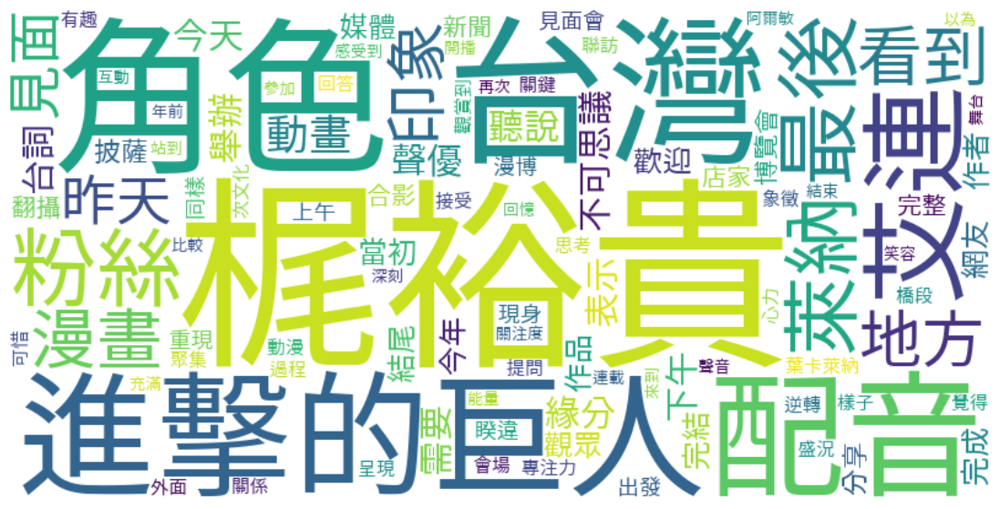

In [ ]:
# 匯入自訂的 stop words (預設只有英文的)
stop_words_pos = stop_words
stop_words_pos.extend(('中央社','記者','王寶兒','台北','日本','日電'))
stop_words_pos = set(stop_words_pos)

# 設定中文字形
font_path = 'TaipeiSansTCBeta-Regular.ttf'

# 可以設定字型大小和背景顏色
wordcloud = WordCloud(
                stopwords=stop_words_pos,
                collocations=False,
                font_path=font_path,
                width=800, 
                height = 400, 
                max_words=100, 
                background_color="white")

wordcloud.generate(' '.join(pos_words['word']))
# Display the generated image:
plt.figure(figsize = (14,7))
plt.imshow(wordcloud, interpolation="bilinear")

plt.axis("off")
plt.show()

### 1. 套件設定

In [ ]:
# import neccessary library
import pandas as pd
import jieba
import jieba.analyse
import re
from wordcloud import WordCloud
import matplotlib.pyplot as plt

In [ ]:
# 設定圖的字體大小
plt.rcParams['font.size'] = 14

# 因為生成文字雲並用 Matplotlib 顯示，所以需要同時設定
# 設定Matplotlib圖的中文字體 
plt.rcParams['font.sans-serif'] = ['Microsoft JhengHei'] # Windows中文字體
# 設定WordCloud中文字體路徑
FontPath = 'dict/SourceHanSansTW-Regular.otf' # 設定字型

### 2. Tidy Data

In [ ]:
# import data
df = pd.read_csv('data/AOT_20210409to20250309.csv')

# df.head()

In [ ]:
# data cleaning
clear_df = df.copy()

# 去除不會用到的欄位
drop_cols = ['system_id', 'artUrl', 'artPoster', 'artCatagory', 'artComment', 'e_ip', 'insertedDate', 'dataSource']
clear_df.drop(drop_cols, axis = 1, inplace = True)

# 去除文章內容為空值的筆數
clear_df.dropna(subset = ['artContent'], axis=0, how='any', inplace=True)

# 新增['sentence']欄位，用'。'取代'\n\n'，並移除'\n'
clear_df['sentence'] = clear_df['artContent'].str.replace(r'\n\n','。', regex=True)
clear_df['sentence'] = clear_df['sentence'].str.replace(r'\n','，', regex=True)

# 移除內文中的網址
clear_df['sentence'] = clear_df['sentence'].replace(r'http\S+', '', regex=True).replace(r'www\S+', '', regex=True)

# clear_df

### 3. 斷詞

In [ ]:
# 斷句

# 把文章拆成[句,句, 句]
clear_df['sentence'] = clear_df['sentence'].str.split("[,，。！!？?]{1,}") 

# 把文章拆成一句一row
sent_df = clear_df.explode('sentence').reset_index(drop=True) 

# 去除句子中除了字母、數字、空白字符以外的符號
sent_df['sentence'] = sent_df['sentence'].str.replace(r'[^\w\s]+', '', regex=True).astype(str)

# 把長度小於1的sentence刪掉
sent_df = sent_df[sent_df["sentence"].str.len() > 1]

# sent_df

In [ ]:
# 初始化斷詞引擎
jieba.set_dictionary('./dict/dict.txt') 

In [ ]:
# 斷詞
word_df = sent_df.assign(word = sent_df['sentence'].apply(jieba.lcut)).explode('word').drop(['sentence'], axis=1)

# 去除空值
word_df = word_df.dropna(subset=['word'])

# 去除包含空格的詞語
word_df = word_df.loc[~word_df['word'].str.contains(' ')]

# word_df

Building prefix dict from c:\Users\ASUS\Downloads\SMA_2025S-main\studyGroup\dict\dict.txt ...
Loading model from cache C:\Users\ASUS\AppData\Local\Temp\jieba.uc918875ea17b235bc8b299f579e432e5.cache
Loading model cost 1.206 seconds.
Prefix dict has been built successfully.


### 4. 斷詞_文字雲

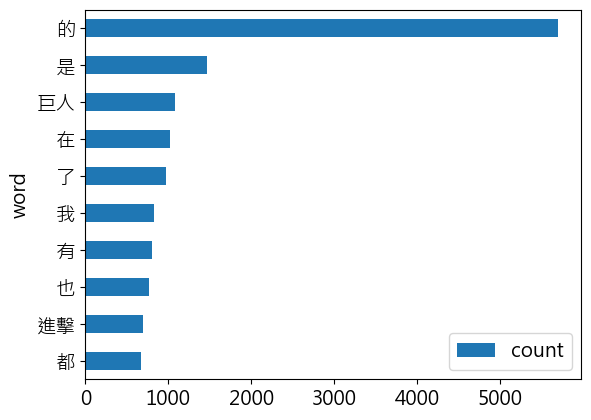

In [ ]:
freq_df = pd.DataFrame(word_df['word'].value_counts()).sort_values(by = ['count'], ascending = False).reset_index()
# freq_df

freq_df.head(10).plot.barh(x = 'word', y = 'count').invert_yaxis()
plt.show()

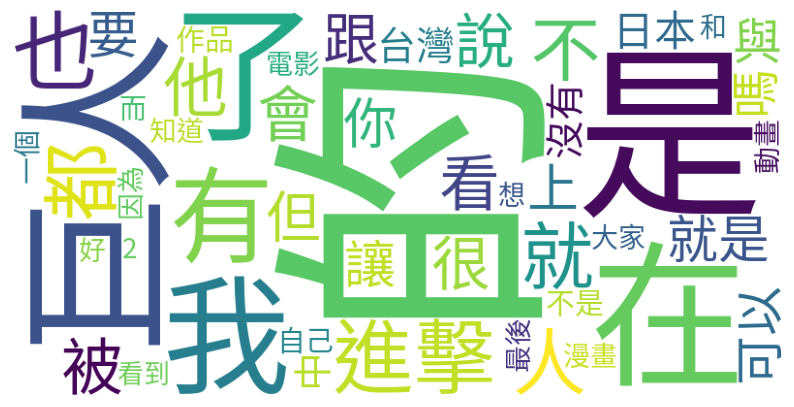

In [ ]:
# wordcloud的輸入須為dict，因此先將freq_df轉換成成dict
freq_dict = freq_df.set_index('word').to_dict()
freq_dict = freq_dict['count']

# 繪製文字雲
wordcloud = WordCloud(background_color = 'white', width = 800, height = 400, font_path = FontPath, max_words = 50)
wordcloud.generate_from_frequencies(freq_dict)

plt.figure(figsize = (10,7))
plt.imshow(wordcloud)
plt.axis('off')
plt.show()

### 5. 斷詞更新_去除單字詞

In [ ]:
# 斷詞
word_df = sent_df.assign(word = sent_df['sentence'].apply(jieba.lcut)).explode('word').drop(['sentence'], axis=1)

# 去除空值
word_df = word_df.dropna(subset=['word'])

# 去除少於兩個字的詞語
word_df_1 = word_df.loc[word_df['word'].str.len() > 1]

# word_df_1

### 6.斷詞更新_去除單字詞_文字雲

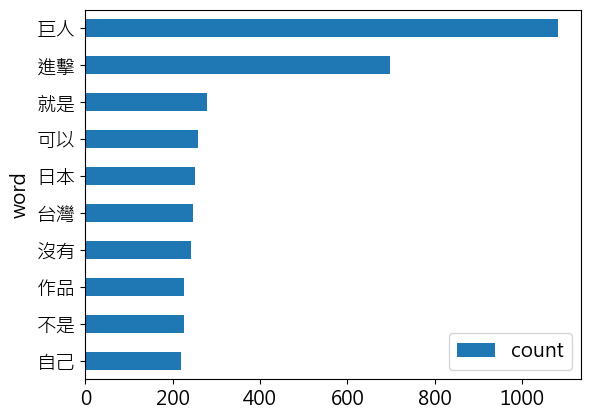

In [ ]:
freq_df_1 = pd.DataFrame(word_df_1['word'].value_counts()).sort_values(by = ['count'], ascending = False).reset_index()
# freq_df

freq_df_1.head(10).plot.barh(x = 'word', y = 'count').invert_yaxis()
plt.show()

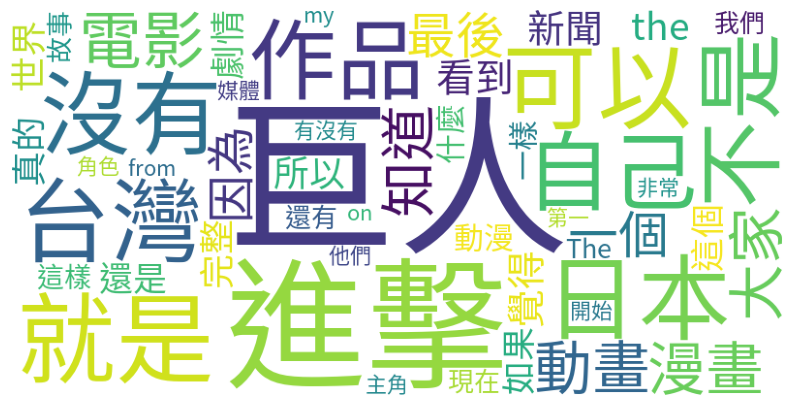

In [ ]:
# wordcloud的輸入須為dict，因此先將freq_df轉換成成dict
freq_dict_1 = freq_df_1.set_index('word').to_dict()
freq_dict_1 = freq_dict_1['count']

# 繪製文字雲
wordcloud_no1 = WordCloud(background_color = 'white', width = 800, height = 400, font_path = FontPath, max_words = 50)
wordcloud_no1.generate_from_frequencies(freq_dict_1)

plt.figure(figsize = (10,7))
plt.imshow(wordcloud_no1)
plt.axis('off')
plt.show()

### 5. 斷詞更新_專有名詞

In [ ]:
# 載入自定義字典
jieba.load_userdict('./dict/user_dict.txt')

# 你提供的專有名詞列表
proper_nouns = [
    # 角色名稱
    "艾倫·耶格爾", "艾倫", "米卡莎·阿克曼", "米卡莎", "阿爾敏·亞魯雷特", "阿爾敏",
    "里維·阿克曼", "里維", "漢吉·佐耶", "漢吉", "萊納·布朗", "萊納",
    "貝爾托特·胡佛", "貝爾托特", "尤彌爾·弗利茲", "尤彌爾", "艾爾文·史密斯", "艾爾文",
    # 地名與組織
    "帕拉迪島", "瑪雷", "艾爾迪亞", "調查兵團", "憲兵團", "訓練兵團",
    "瑪利亞之牆", "羅塞之牆", "希娜之牆", "牆內",
    # 關鍵術語
    "巨人", "無垢巨人", "九大巨人", "始祖巨人", "進擊的巨人", "鎧之巨人",
    "超大型巨人", "顎之巨人", "戰鎚巨人", "車力巨人", "座標", "自由之翼",
    "立體機動裝置", "雷槍", "硬質化"
]

# 檢查自定義字典中已有的詞彙，避免重複
existing_words = set()
try:
    with open('./dict/user_dict.txt', 'r', encoding='utf-8') as f:
        for line in f:
            word = line.strip().split()[0]  # 取每行的第一個欄位（詞語）
            existing_words.add(word)
except FileNotFoundError:
    # 如果檔案不存在，視為空字典
    pass

# 動態將專有名詞加入斷詞字典並記錄新詞
added_words = []  # 用於記錄新加入的詞
for w in proper_nouns:
    if w not in existing_words:  # 避免重複添加
        jieba.add_word(w, freq=10, tag=None)  # 動態加入斷詞引擎
        added_words.append(w)
    else:
        jieba.add_word(w, freq=10, tag=None)  # 確保斷詞引擎認識已有詞

# 將新詞寫入自定義字典檔案（僅寫入 example_user_dict.txt）
if added_words:  # 只有在有新詞時才寫入
    with open('./dict/user_dict.txt', 'a', encoding='utf-8') as f:
        for w in added_words:
            f.write(f"{w} 10\n")  # 格式：詞語 詞頻，只寫入自定義字典

# 顯示新加入的詞彙
if added_words:
    print("新加入的自定義斷詞字典（example_user_dict.txt）詞彙：")
    for w in added_words:
        print(w)
else:
    print("所有專有名詞已存在於自定義字典（user_dict.txt）中，無新詞加入。")

新加入的自定義斷詞字典（example_user_dict.txt）詞彙：
艾倫·耶格爾
艾倫
米卡莎·阿克曼
米卡莎
阿爾敏·亞魯雷特
阿爾敏
里維·阿克曼
里維
漢吉·佐耶
漢吉
萊納·布朗
萊納
貝爾托特·胡佛
貝爾托特
尤彌爾·弗利茲
尤彌爾
艾爾文·史密斯
艾爾文
帕拉迪島
瑪雷
艾爾迪亞
調查兵團
憲兵團
訓練兵團
瑪利亞之牆
羅塞之牆
希娜之牆
牆內
巨人
無垢巨人
九大巨人
始祖巨人
進擊的巨人
鎧之巨人
超大型巨人
顎之巨人
戰鎚巨人
車力巨人
座標
自由之翼
立體機動裝置
雷槍
硬質化


In [ ]:
# 斷詞
word_df_2 = sent_df.assign(word=sent_df['sentence'].apply(jieba.lcut)).explode('word').drop(['sentence'], axis=1)

# 去除空值
word_df_2 = word_df_2.dropna(subset=['word'])

# 去除少於兩個字的詞語
word_df_2 = word_df_2.loc[word_df_2['word'].str.len() > 1]

### 6. 斷詞更新_專有名詞_文字雲

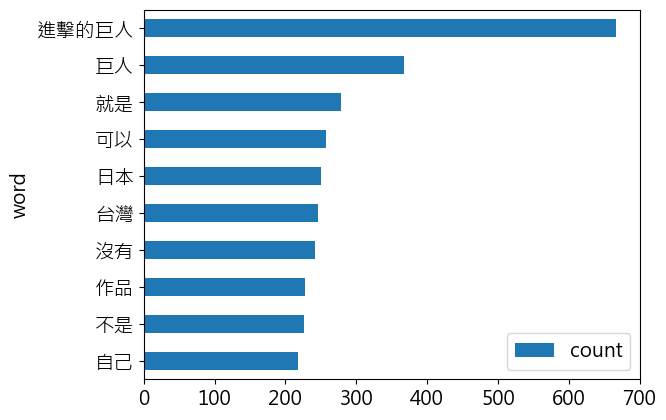

In [ ]:
freq_df_2 = pd.DataFrame(word_df_2['word'].value_counts()).sort_values(by = ['count'], ascending = False).reset_index()
# freq_df_2

freq_df_2.head(10).plot.barh(x = 'word', y = 'count').invert_yaxis()
plt.show()

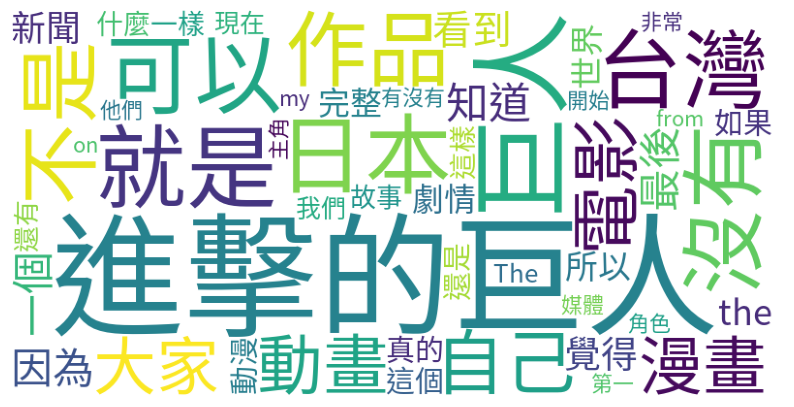

In [ ]:
# wordcloud的輸入須為dict，因此先將freq_df轉換成成dict
freq_dict_2 = freq_df_2.set_index('word').to_dict()
freq_dict_2 = freq_dict_2['count']

# 繪製文字雲
wordcloud_no1_2 = WordCloud(background_color = 'white', width = 800, height = 400, font_path = FontPath, max_words = 50)
wordcloud_no1_2.generate_from_frequencies(freq_dict_2)

plt.figure(figsize = (10,7))
plt.imshow(wordcloud_no1_2)
plt.axis('off')
plt.show()

### 7. 停用字

In [ ]:
# 匯入通用的停用字檔案
# 將stopwords存成list
stopwords = [line.strip() for line in open('dict/stopwords.txt', 'r', encoding='utf-8').readlines()] 

#移除dataframe中的停用字
noStop_df = word_df_2[~word_df_2['word'].isin(stopwords)]

# noStop_df

### 6. 停用字_文字雲

C:\Users\ASUS\AppData\Local\Temp\ipykernel_15640\1398153042.py:1: FutureWarning: pandas.value_counts is deprecated and will be removed in a future version. Use pd.Series(obj).value_counts() instead.
  freq_df_nostop = pd.DataFrame(pd.value_counts(noStop_df['word'])).sort_values(by = ['count'], ascending = False).reset_index()


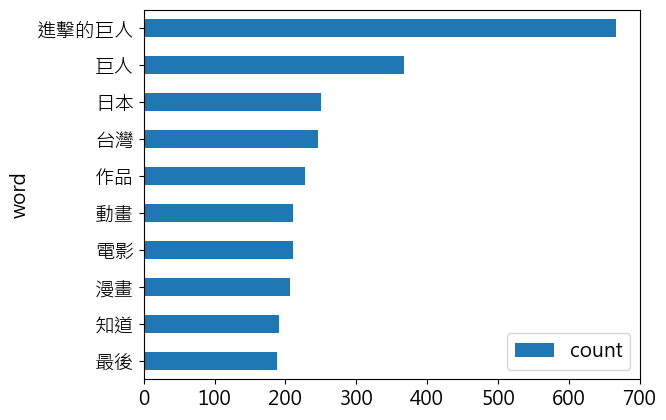

In [ ]:
freq_df_nostop = pd.DataFrame(pd.value_counts(noStop_df['word'])).sort_values(by = ['count'], ascending = False).reset_index()
# freq_df_nostop

freq_df_nostop.head(10).plot.barh(x = 'word', y = 'count').invert_yaxis()
plt.show()

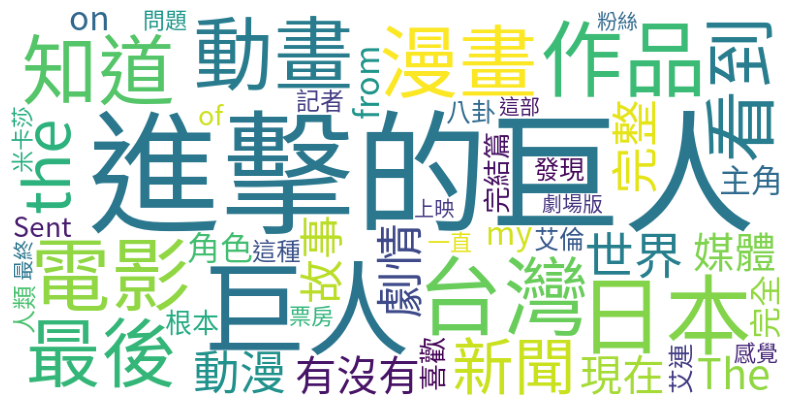

In [ ]:
# wordcloud的輸入須為dict，因此先將freq_df轉換成成dict
freq_dict_nostop = freq_df_nostop.set_index('word').to_dict()
freq_dict_nostop = freq_dict_nostop['count']

# 繪製文字雲
wordcloud_nostop = WordCloud(background_color = 'white', width = 800, height = 400, font_path = FontPath, max_words = 50)
wordcloud_nostop.generate_from_frequencies(freq_dict_nostop)

plt.figure(figsize = (10,7))
plt.imshow(wordcloud_nostop)
plt.axis('off')
plt.show()

### 7. 停用字更新 

In [ ]:
# 參數形式手動加入停用字
stopwords_manual = [
    '看到','看完','知道','新聞','記者', 'The','the', 'my', 'on','of','from','Sent','一直','一下','根本', '完全','有沒有','現在','一堆',
    # 通用中文停用詞
    "的", "是", "在", "了", "和", "就", "也", "很", "這", "那",
    "我", "他", "你", "她", "它", "我們", "他們", "什麼", "怎麼",
    # 情境相關低資訊量詞彙
    "說", "看", "見", "走", "去", "來", "東西", "人", "時間",
    "地方", "有", "沒有", "一個", "一些", "都", "還是", "啊", "吧"]
stopwords.extend(stopwords_manual)

noStop_df_2 = noStop_df[~noStop_df['word'].isin(stopwords)]

# noStop_df_2

### 8. 停用字更新_文字雲

C:\Users\ASUS\AppData\Local\Temp\ipykernel_15640\3874968577.py:2: FutureWarning: pandas.value_counts is deprecated and will be removed in a future version. Use pd.Series(obj).value_counts() instead.
  freq_df_nostop_2 = pd.DataFrame(pd.value_counts(noStop_df_2['word'])).sort_values(by = ['count'], ascending = False).reset_index()


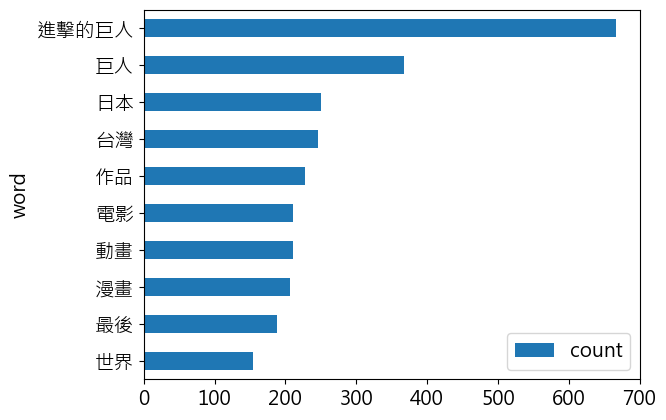

In [ ]:
# 計算詞頻
freq_df_nostop_2 = pd.DataFrame(pd.value_counts(noStop_df_2['word'])).sort_values(by = ['count'], ascending = False).reset_index()
# freq_df_nostop_2

freq_df_nostop_2.head(10).plot.barh(x = 'word', y = 'count').invert_yaxis()
plt.show()

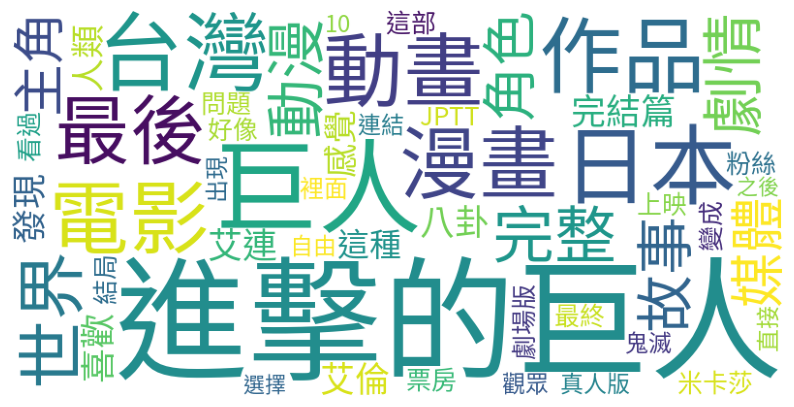

In [ ]:
# 若省略上張圖，可直接此行+下面轉dict&繪圖
# freq_df_nostop_2 = pd.DataFrame(pd.value_counts(noStop_df_2['word'])).sort_values(by = ['count'], ascending = False).reset_index()

# wordcloud的輸入須為dict，因此先將freq_df轉換成成dict
freq_dict_nostop_2 = freq_df_nostop_2.set_index('word').to_dict()
freq_dict_nostop_2 = freq_dict_nostop_2['count']

# 繪製文字雲
wordcloud_nostop_2 = WordCloud(background_color = 'white', width = 800, height = 400, font_path = FontPath, max_words = 50)
wordcloud_nostop_2.generate_from_frequencies(freq_dict_nostop_2)

plt.figure(figsize = (10,7))
plt.imshow(wordcloud_nostop_2)
plt.axis('off')
plt.show()

### 9. 所有文字雲比較

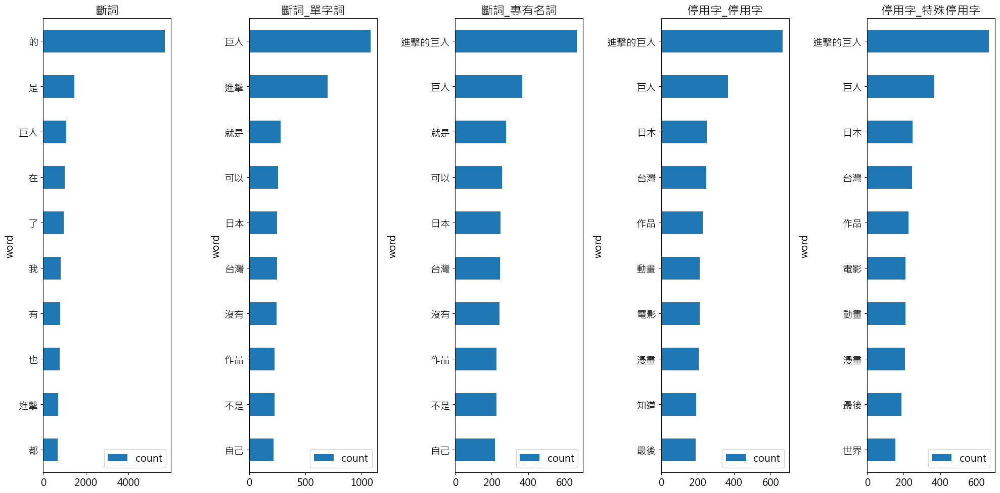

In [ ]:
# 創建一個包含五個子圖的畫布，排列成 1 行 5 列
fig, axes = plt.subplots(nrows=1, ncols=5, figsize=(20, 10))  # 調整畫布大小

# 第一張圖：freq_df
freq_df.head(10).plot.barh(x='word', y='count', ax=axes[0])
axes[0].invert_yaxis()  
axes[0].set_title('斷詞')  

# 第二張圖：freq_df_1
freq_df_1.head(10).plot.barh(x='word', y='count', ax=axes[1])
axes[1].invert_yaxis()  
axes[1].set_title('斷詞_單字詞') 

# 第二張圖：freq_df_2
freq_df_2.head(10).plot.barh(x='word', y='count', ax=axes[2])
axes[2].invert_yaxis() 
axes[2].set_title('斷詞_專有名詞')  

# 第三張圖：freq_df_nostop
freq_df_nostop.head(10).plot.barh(x='word', y='count', ax=axes[3])
axes[3].invert_yaxis() 
axes[3].set_title('停用字_停用字')  

# 第四張圖：freq_df_nostop_2
freq_df_nostop_2.head(10).plot.barh(x='word', y='count', ax=axes[4])
axes[4].invert_yaxis() 
axes[4].set_title('停用字_特殊停用字') 

# 調整子圖之間的間距
plt.tight_layout()

# 顯示圖形
plt.show()

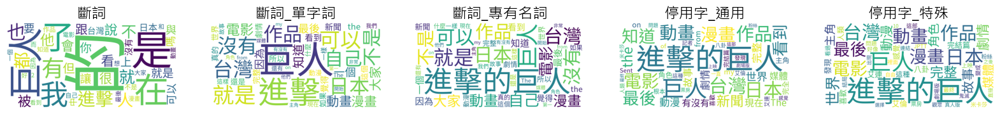

In [ ]:
plt.figure(figsize = (20,15))

plt.subplot(1,5,1)
plt.imshow(wordcloud)
plt.axis('off')
plt.title("斷詞")

plt.subplot(1,5,2)
plt.imshow(wordcloud_no1)
plt.axis('off')
plt.title("斷詞_單字詞")

plt.subplot(1,5,3)
plt.imshow(wordcloud_no1_2)
plt.axis('off')
plt.title("斷詞_專有名詞")

plt.subplot(1,5,4)
plt.imshow(wordcloud_nostop)
plt.axis('off')
plt.title("停用字_通用")

plt.subplot(1,5, 5)
plt.imshow(wordcloud_nostop_2)
plt.axis('off')
plt.title("停用字_特殊")

plt.show()

- 第一階段：基本斷詞
    - 原始斷詞結果，常見的連接詞、代詞和虛詞高頻出現，「的」、「是」和「在」等。
    - 這階段看到的關鍵詞較為分散，缺乏主題焦點。


- 第二階段：去除單字詞
    - 移除單字詞後的結果，「進擊」、「巨人」和「台灣」等有意義的詞彙開始突出。
    - 這表明**單字詞**在原始分析中佔據過多權重，移除後更實質性的詞彙得以浮現。


- 第三階段：加入專有名詞
    - 「進擊的巨人」作為一個完整詞組開始顯現，「進擊」和「巨人」不再是分開的詞，這提高了分析的準確性。
    - 這表示添加專有名詞詞典後，系統能夠正確識別特定專有名詞而不是將其拆分。


-  第四階段：去除通用停用詞
    - 移除了**一般中文停用詞**後的結果，「進擊的巨人」、「台灣」、「電影」、「作品」等主題詞更加突出。
    - 這表明通用停用詞過濾有效地去除了不具分析價值的常用詞。


- 第五階段：去除特殊停用詞
    - 移除特定於此語料的停用詞後，「進擊的巨人」、「漫畫」、「動畫」、「電影」、「作品」等詞彙清晰呈現。
    - 表明這是關於進擊的巨人相關媒體形式（漫畫、動畫、電影）的討論。


##### 文字雲演變過程展示了文本挖掘中不同預處理步驟的重要性，每一步都使分析結果更加聚焦和有意義，從而提取出更有價值的洞察。

### 10. 結論與解析

- 「進擊的巨人」、「巨人」: 佔文字雲視覺中心，表示其出現頻率極高，代表討論內容集中在這部作品。
- 「日本」、「台灣」: 代表討論集中在這兩個地方的話題，例如：日本作為動畫&漫畫的發源地、台灣觀眾的觀看情況和票房表現等。
- 「電影」、「動畫」、「漫畫」: 顯示PTT上有大量關於這三種媒介的比較，如：動畫與漫畫劇情的異同。
- 「最後」、「完整」、「完結篇」、「最終」、「結局」: 等詞出現頻繁，顯示討論圍繞《進擊的巨人》作品的完結。
- 「角色」、「主角」、「艾倫」、「艾連」、「米卡莎」: 討論可能涉及劇情，因而提及角色名稱。
- 「票房」、「劇場版」、「粉絲」、「上映」、「觀眾」: 討論可能涉及劇場版的票房表現、粉絲評價等。
- 「10」: 可能與歷時10年完結相關。

### 11. 儲存資料

In [ ]:
noStop_df_2.to_csv("data/clean_AOT20210409to20250309.csv", encoding = 'utf-8',index = False)

### 1. 前處理

##### 匯入函式庫

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.font_manager as fm
from matplotlib.colors import Colormap
from wordcloud import WordCloud
import jieba
%matplotlib inline

##### 繪圖設定

In [ ]:
# plt.rcParams['font.sans-serif']=['SimHei'] #使 matplotilb 中文能正常顯示
fprop = fm.FontProperties(fname="dict/SourceHanSansTW-Regular.otf")

# 設定整份 notebook 圖片的長寬與 dpi
plt.rcParams["figure.figsize"] = [10, 6]
plt.rcParams["figure.dpi"] = 150

##### 讀取資料

In [ ]:
df = pd.read_csv("./data/AOT_20210409to20250309.csv")
df["artDate"] = pd.to_datetime(df["artDate"])
df['artDate'] = df['artDate'].dt.date

##### 清理資料

In [ ]:
clear_df = df.copy()

#去除本次不會用到的欄位
drop_cols = ['system_id', 'artPoster', 'artCatagory', 'artComment', 'e_ip', 'insertedDate', 'dataSource']
clear_df.drop(drop_cols, axis = 1, inplace = True)

#去除文章內容為空值的筆數
clear_df.dropna(subset = ['artContent'], axis=0, how='any', inplace=True)

#新增['sentence']欄位，用'。'取代'\n\n'，並移除'\n'
clear_df['sentence'] = clear_df['artContent'].str.replace(r'\n\n','。', regex=True)
clear_df['sentence'] = clear_df['sentence'].str.replace(r'\n','', regex=True)

#移除內文中的網址
clear_df['sentence'] = clear_df['sentence'].replace(r'http\S+', '', regex=True).replace(r'www\S+', '', regex=True)

##### 斷句

In [ ]:
clear_df['sentence'] = clear_df['sentence'].str.split("[,，。！!？?]{1,}")
sent_df = clear_df.explode('sentence').reset_index(drop=True)

##### 斷詞

In [ ]:
# 初始化斷詞引擎：不一定要設定，只使用內建效果也可以
jieba.set_dictionary('dict/dict.txt')
jieba.load_userdict('dict/user_dict.txt')

#去除句子中除了字母、數字、空白字符以外的符號
sent_df['sentence'] = sent_df['sentence'].str.replace(r'[^\w\s]+', '', regex=True).astype(str)

# 把長度小於1的sentence刪掉
sent_df = sent_df[sent_df["sentence"].str.len() > 1]

# 將每個句子進行斷詞，展開為詞列表，並移除原句子欄位，只保留詞語
word_df = sent_df.assign(word = sent_df['sentence'].apply(jieba.lcut)).explode('word').drop(['sentence'], axis=1)

#去除少於兩個字的詞語
word_df = word_df.loc[word_df['word'].str.len() > 1]

Building prefix dict from c:\Users\ASUS\Downloads\SMA_2025S-main\studyGroup\dict\dict.txt ...
Loading model from cache C:\Users\ASUS\AppData\Local\Temp\jieba.uc918875ea17b235bc8b299f579e432e5.cache
Loading model cost 0.572 seconds.
Prefix dict has been built successfully.


##### 停用字

In [ ]:
# 以檔案形式匯入通用的停用字檔案，將stopwords存成list
stopwords = [line.strip() for line in open('dict/stopwords.txt', 'r', encoding='utf-8').readlines()]

noStop_df = word_df[~word_df['word'].isin(stopwords)]

### 2. 情緒分析_字單位

##### 情緒分析

In [ ]:
# 讀取情緒字典
liwc_dict = pd.read_csv("./dict/liwc/LIWC_CH.csv")
liwc_dict = liwc_dict.rename(columns={'name': 'word', "class": 'sentiments'})

#liwc_dict['sentiments'].describe()

In [ ]:
# 情緒字典與斷詞結果合併
ptt_liwc_df = pd.merge(noStop_df[["artUrl", "artDate", "artTitle", "artContent", "word"]], liwc_dict, how="left")

#ptt_liwc_df

##### 正負向情緒詞彙頻率折線圖圖

In [ ]:
sentiment_count = pd.DataFrame(
    ptt_liwc_df.groupby(["artDate", "sentiments"]).size()
).reset_index()

mask = (sentiment_count['sentiments'] == "positive") | (sentiment_count['sentiments'] == "negative")
sentiment_count = sentiment_count.loc[mask]

sentiment_count = sentiment_count.rename(columns={0: "size"})
sentiment_count = sentiment_count.sort_values(["artDate"])

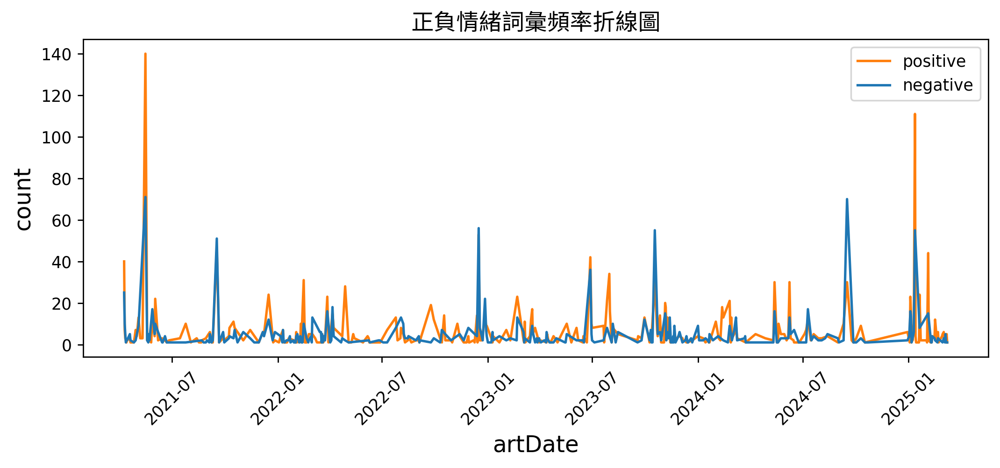

In [ ]:
colors = ["tab:blue", "tab:orange"]
pos = sentiment_count[sentiment_count["sentiments"] == "positive"]
neg = sentiment_count[sentiment_count["sentiments"] == "negative"]

fig, ax = plt.subplots(figsize = (10,4), dpi = 250)

ax.plot(pos["artDate"], pos["size"], color=colors[1])
ax.plot(neg["artDate"], neg["size"], color=colors[0])

fig.autofmt_xdate()
plt.xlabel("artDate")
plt.ylabel("count")
ax.legend(["positive", "negative"], loc="upper right", prop={'size': 10})
ax.tick_params(axis='x', labelsize=10)
ax.tick_params(axis='y', labelsize=10)
plt.setp(ax.get_xticklabels(), rotation=45, ha='center')
plt.title("正負情緒詞彙頻率折線圖", fontproperties=fprop)

plt.show()

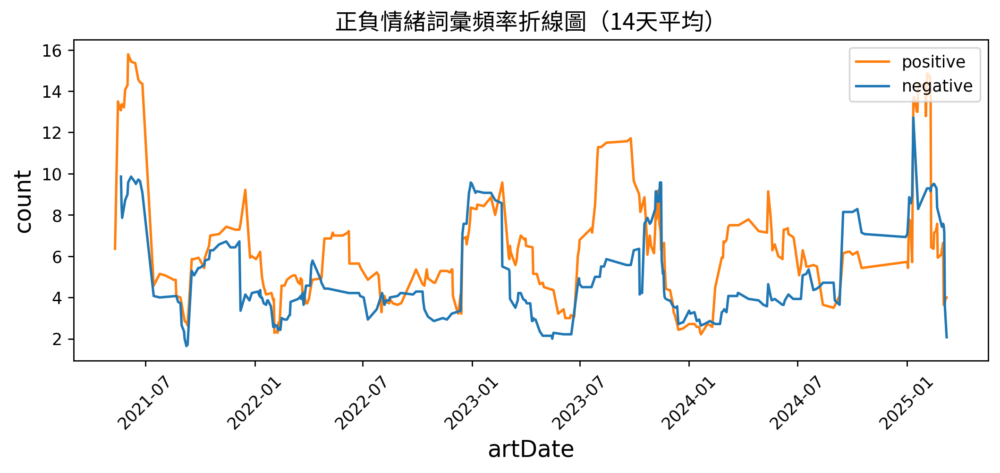

In [ ]:
colors = ["tab:blue", "tab:orange"]
pos = sentiment_count[sentiment_count["sentiments"] == "positive"]
neg = sentiment_count[sentiment_count["sentiments"] == "negative"]

fig, ax = plt.subplots(figsize = (10,4), dpi = 250)


# 使用 Series.rolling().mean() 來產生 14 天平均
rolling_days = 14
ax.plot(pos["artDate"], pos['size'].rolling(rolling_days).mean(), color=colors[1])
ax.plot(neg["artDate"], neg["size"].rolling(rolling_days).mean(), color=colors[0])

fig.autofmt_xdate()

plt.xlabel("artDate")
plt.ylabel("count")
ax.legend(["positive", "negative"], loc="upper right", prop={'size': 10})
ax.tick_params(axis='x', labelsize=10)
ax.tick_params(axis='y', labelsize=10)
plt.setp(ax.get_xticklabels(), rotation=45, ha='center')
plt.title("正負情緒詞彙頻率折線圖（14天平均）", fontproperties=fprop)

plt.show()

##### 正負向情緒詞彙比例折線圖圖

In [ ]:
sentiment_count = sentiment_count.assign(
    ratio=sentiment_count.groupby("artDate")["size"].transform(lambda n: n / n.sum())
)

pos = sentiment_count[sentiment_count["sentiments"] == "positive"]
neg = sentiment_count[sentiment_count["sentiments"] == "negative"]

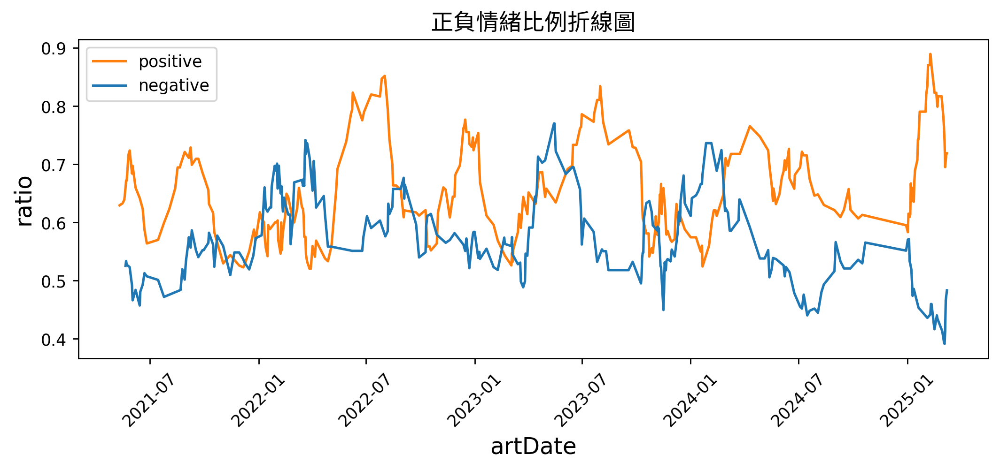

In [ ]:
fig, ax = plt.subplots(figsize = (10,4), dpi = 250)

rolling_days = 14
ax.plot(pos["artDate"], pos["ratio"].rolling(rolling_days).mean(), color=colors[1])
ax.plot(neg["artDate"], neg["ratio"].rolling(rolling_days).mean(), color=colors[0])

fig.autofmt_xdate()

plt.xlabel("artDate")
plt.ylabel("ratio")
ax.legend(["positive", "negative"], loc="upper left", prop={'size': 10})
ax.tick_params(axis='x', labelsize=10)
ax.tick_params(axis='y', labelsize=10)
plt.setp(ax.get_xticklabels(), rotation=45, ha='center')
plt.title("正負情緒比例折線圖", fontproperties=fprop)

plt.show()

##### 正負向情緒分數折線圖

In [ ]:
ptt_sentiment_value = (
    sentiment_count.pivot_table(
        index="artDate", columns="sentiments", values="size", fill_value=0
    )
    .reset_index()
    .rename_axis(None, axis=1)
)
# ptt_sentiment_value.head()

# sentiment 計算方式: positive - negative
ptt_sentiment_value["sentiment_value"] = (
    ptt_sentiment_value["positive"]
    - ptt_sentiment_value["negative"]
)
# ptt_sentiment_value.head()

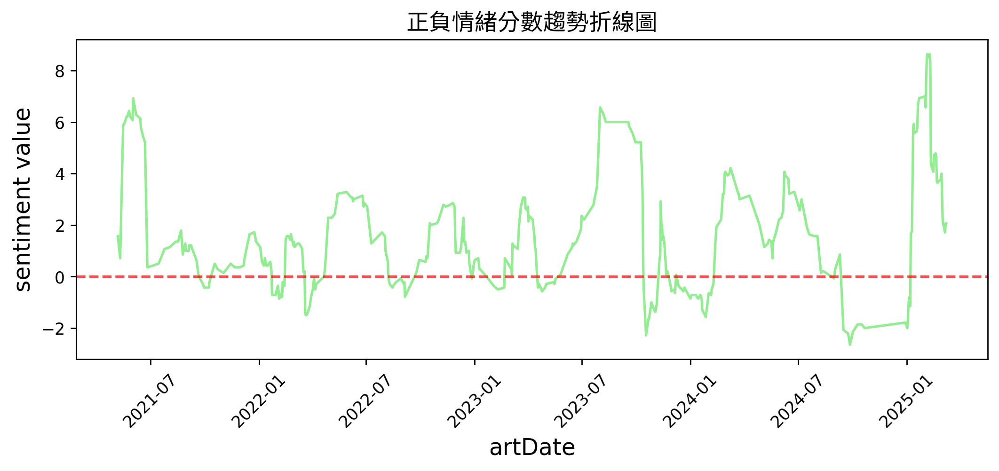

In [ ]:
fig, ax = plt.subplots(figsize = (10,4), dpi = 250)

rolling_days = 14
ax.plot(ptt_sentiment_value["artDate"], ptt_sentiment_value["sentiment_value"].rolling(rolling_days).mean(), color='#90EE90')

fig.autofmt_xdate()

ax.set_xlabel("artDate")
ax.set_ylabel("sentiment value")
ax.tick_params(axis='x', labelsize=10)
ax.tick_params(axis='y', labelsize=10)
plt.setp(ax.get_xticklabels(), rotation=45, ha='center')
ax.axhline(y=0, color='red', linestyle='--', alpha=0.7)
plt.title("正負情緒分數趨勢折線圖", fontproperties=fprop)

plt.show()

### 3. 情緒分析_字單位_匯總

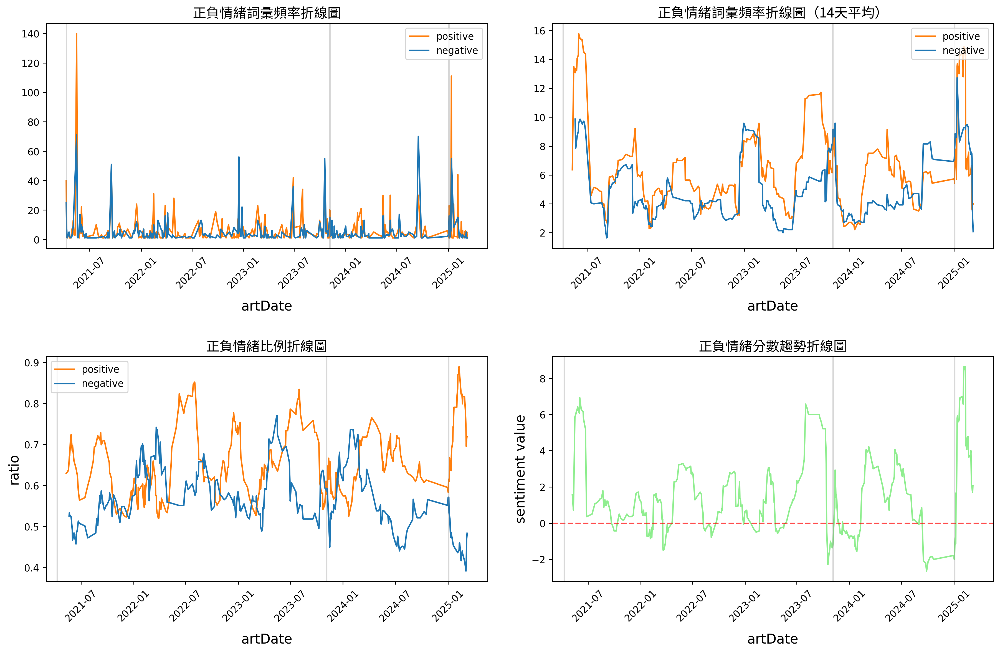

In [ ]:
fig, axs = plt.subplots(2, 2, figsize=(15, 10), dpi=250)

plt.subplots_adjust(hspace=0.5, wspace=0.3, bottom=0.2)

colors = ["tab:blue", "tab:orange"]
pos = sentiment_count[sentiment_count["sentiments"] == "positive"]
neg = sentiment_count[sentiment_count["sentiments"] == "negative"]
rolling_days = 14

# 圖1：左上 - 正負情緒詞彙頻率折線圖
axs[0, 0].plot(pos["artDate"], pos["size"], color=colors[1])
axs[0, 0].plot(neg["artDate"], neg["size"], color=colors[0])
axs[0, 0].set_xlabel("artDate", labelpad=10)
axs[0, 0].legend(["positive", "negative"], loc="upper right", prop={'size': 10})
axs[0, 0].tick_params(axis='x', labelsize=10)
axs[0, 0].tick_params(axis='y', labelsize=10)
axs[0, 0].set_title("正負情緒詞彙頻率折線圖", fontproperties=fprop)

# 圖2：右上 - 正負情緒詞彙頻率折線圖（14天平均）
axs[0, 1].plot(pos["artDate"], pos['size'].rolling(rolling_days).mean(), color=colors[1])
axs[0, 1].plot(neg["artDate"], neg["size"].rolling(rolling_days).mean(), color=colors[0])
axs[0, 1].set_xlabel("artDate", labelpad=10)
axs[0, 1].legend(["positive", "negative"], loc="upper right", prop={'size': 10})
axs[0, 1].tick_params(axis='x', labelsize=10)
axs[0, 1].tick_params(axis='y', labelsize=10)
axs[0, 1].set_title("正負情緒詞彙頻率折線圖（14天平均）", fontproperties=fprop)

# 圖3：左下 - 正負情緒比例折線圖
axs[1, 0].plot(pos["artDate"], pos["ratio"].rolling(rolling_days).mean(), color=colors[1])
axs[1, 0].plot(neg["artDate"], neg["ratio"].rolling(rolling_days).mean(), color=colors[0])
axs[1, 0].set_xlabel("artDate", labelpad=10)
axs[1, 0].set_ylabel("ratio")
axs[1, 0].legend(["positive", "negative"], loc="upper left", prop={'size': 10})
axs[1, 0].tick_params(axis='x', labelsize=10)
axs[1, 0].tick_params(axis='y', labelsize=10)
axs[1, 0].set_title("正負情緒比例折線圖", fontproperties=fprop)

# 圖4：右下 - 正負情緒分數趨勢折線圖
axs[1, 1].plot(ptt_sentiment_value["artDate"], ptt_sentiment_value["sentiment_value"].rolling(rolling_days).mean(), color='#90EE90')
axs[1, 1].set_xlabel("artDate", labelpad=10)
axs[1, 1].set_ylabel("sentiment value")
axs[1, 1].tick_params(axis='x', labelsize=10)
axs[1, 1].tick_params(axis='y', labelsize=10)
axs[1, 1].axhline(y=0, color='red', linestyle='--', alpha=0.7)
axs[1, 1].set_title("正負情緒分數趨勢折線圖", fontproperties=fprop)


for ax in axs.flat:
    plt.setp(ax.get_xticklabels(), rotation=45, ha='center')

# 添加垂直線
important_dates = ["2021-04-09", "2023-11-05", "2025-01-03"]
important_dates_pd = pd.to_datetime(important_dates)
for ax in axs.flat:
    for date in important_dates_pd:
        ax.axvline(x=date, color='gray', linestyle='-', alpha=0.3)
    plt.setp(ax.get_xticklabels(), rotation=45, ha='center')


plt.tight_layout(pad=2.0)
plt.show()

##### 從圖表可看出，《進擊的巨人》在三個關鍵時間點都引發了熱烈討論，但反應強度和情緒傾向有所不同：

1. 漫畫完結(2021/04)引發了第一波強烈、主要為正面的反應
    - 「正負情緒詞彙頻率折線圖」顯示2021/04附近出現約140的正面情緒詞彙頻率高峰
    - 「正負情緒比例折線圖」顯示此時正面情緒比例約為0.7，明顯高於負面情緒
    - 「正負情緒分數折現圖」顯示情緒分數在此期間達到約6-7的高值

2. 動畫完結時(2023/11)的反應較為複雜，情緒更加分歧
    - 「正負情緒詞彙頻率折線圖(14天)」顯示2023/11正負情緒線較為接近
    - 「正負情緒比例折線圖」顯示情緒比例波動較大，有時接近**0.5-0.5的平衡狀態**
    - 「正負情緒分數折現圖」顯示此期間情緒分數有較大起伏，包含接近0的時期

3. 電影版上映(2025/01)引發的反應似乎最為正面，可能表明粉絲對電影版的表現非常滿意
    - 「正負情緒詞彙頻率折線圖」顯示2025/01正面情緒詞彙頻率達到約110的高峰
    - 「正負情緒比例折線圖」同期正面情緒比例達到**約0.9的最高點**
    - 「正負情緒分數折現圖」顯示情緒分數在此期間飆升至整個觀測期最**高值約8.5**

##### 整體來看，儘管作品在不同階段引發了不同程度的爭議，但粉絲對《進擊的巨人》系列的總體評價仍然偏向正面：
 - 「正負情緒分數折現圖」的情緒分數趨勢線大部分時間維持在0以上的正值區域
 - 「正負情緒比例折線圖」顯示大多數時期正面情緒比例都高於0.5
 - 「正負情緒詞彙頻率折線圖(14天)」的14天平均值中，橙色正面情緒線整體位置大多高於藍色負面情緒線）

### 4. 情緒分析_文章單位

##### 文章為單位的情緒分析

In [ ]:
ptt_sentiment_value_by_article = (
    sentiment_count_by_article.pivot_table(
        index="artUrl", columns="sentiments", values="size", fill_value=0
    )
    .reset_index()
    .rename_axis(None, axis=1)
)

# ptt_sentiment_value_by_article

# sentiment 計算方式: positive - negative
ptt_sentiment_value_by_article["sentiment_value"] = (
    ptt_sentiment_value_by_article["positive"]
    - ptt_sentiment_value_by_article["negative"]
)

# ptt_sentiment_value_by_article

ptt_sentiment_value_by_article['sentiment_class'] = ptt_sentiment_value_by_article['sentiment_value'].apply(lambda x: "正向" if x > 0 else "負向" )

# ptt_sentiment_value_by_article

clear_df_sentiment = pd.merge(df, ptt_sentiment_value_by_article[['artUrl', 'sentiment_class']], how="left")
clear_df_sentiment["artDate"] = pd.to_datetime(clear_df_sentiment["artDate"])
clear_df_sentiment['artDate'] = clear_df_sentiment['artDate'].dt.date

# clear_df_sentiment

sentiment_art_count = pd.DataFrame(
    clear_df_sentiment.groupby(["artDate", "sentiment_class"]).size()
).reset_index()
sentiment_art_count = sentiment_art_count.rename(columns={0: "size"})
sentiment_art_count = sentiment_art_count.sort_values(["artDate"])

# sentiment_art_count

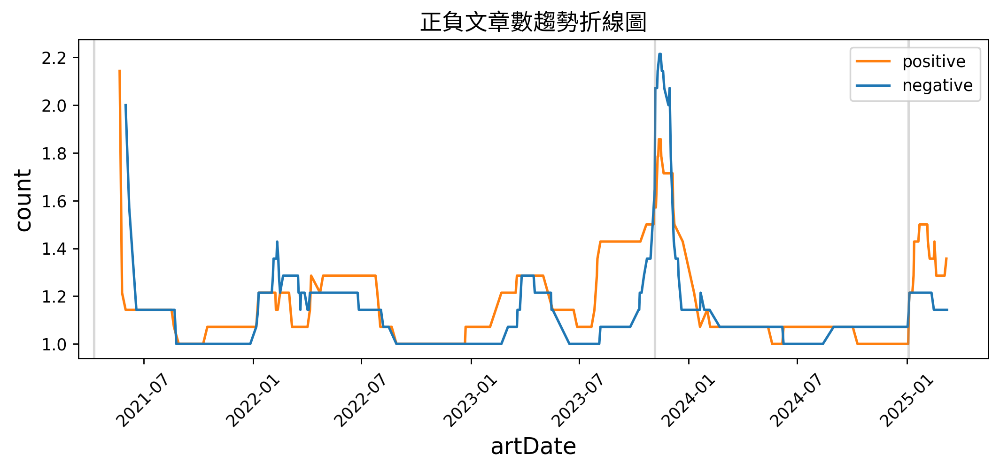

In [ ]:
colors = ["tab:blue", "tab:orange"]
pos = sentiment_art_count[sentiment_art_count["sentiment_class"] == "正向"]
neg = sentiment_art_count[sentiment_art_count["sentiment_class"] == "負向"]

fig, ax = plt.subplots(figsize = (10,4), dpi = 250)

# 使用 Series.rolling().mean() 來產生 14 天平均
rolling_days = 14
ax.plot(pos["artDate"], pos['size'].rolling(rolling_days).mean(), color=colors[1])
ax.plot(neg["artDate"], neg["size"].rolling(rolling_days).mean(), color=colors[0])

fig.autofmt_xdate()

plt.xlabel("artDate")
plt.ylabel("count")
ax.tick_params(axis='x', labelsize=10)
ax.tick_params(axis='y', labelsize=10)
plt.setp(ax.get_xticklabels(), rotation=45, ha='center')
ax.legend(["positive", "negative"], loc="upper right", prop={'size': 10})
plt.title("正負文章數趨勢折線圖", fontproperties=fprop)

important_dates = ["2021-04-09", "2023-11-05", "2025-01-03"]
important_dates_pd = pd.to_datetime(important_dates)

for date in important_dates_pd:
    ax.axvline(x=date, color='gray', linestyle='-', alpha=0.3)

plt.show()

「正負文章數趨勢折線圖」顯示了正面和負面情緒文章的絕對數量變化趨勢：

1. 漫畫完結 (2021/04)
   - 圖表左側顯示正面情緒文章數達到高峰（橙色線達到約2.15）
   - 同期負面情緒文章數也達到高值（藍色線達到約2.0）
   - 這表明漫畫完結引發了大量討論，**正面討論略多於負面討論**

2. 動畫完結 (2023/11)
   - 2023年底前後可見負面情緒文章數量達到整個觀測期間的最高峰（藍色線達到約2.2的最高點）
   - 正面情緒文章同期也有明顯上升（橙色線同期達到約1.85）
   - 這與動畫完結時間點相符，且顯示出**負面反應實際上超過了正面反應**

3. 電影版上映 (2025/01)：
   - 圖表右側顯示正面情緒文章數量明顯上升（橙色線在2025年1月達到約1.5）
   - 負面情緒文章數量相對較低（藍色線同期維持在約1.2）
   - 這證實了電影版獲得了**相對正面**的討論

4. 其他發現
   - 大部分平靜期的基準討論量約為1.0-1.1，圖表中大部分時間兩條線都在此數值附近波動
   - 整個觀測期間有幾次明顯的討論高峰，**2023年初**、**2023年末**、**2025年初**各有數值超過1.2的波峰
   

### 5. 情緒分析_情緒代表字

##### 情緒代表字

In [ ]:
word_count = ptt_liwc_df.groupby(["word", "sentiments"]).size().reset_index()
word_count = word_count.rename(columns={0: "size"})
word_count = word_count.sort_values(["size"], ascending=False)

# word_count.head(10)

word_of_pos = word_count.loc[(word_count["sentiments"] == "positive")]

# word_of_pos.head(15)

word_of_neg = word_count.loc[(word_count["sentiments"] == "negative")]

# word_of_neg.head(15)

pos = word_of_pos.head(15).sort_values(["size"], ascending=True)
neg = word_of_neg.head(15).sort_values(["size"], ascending=True)

C:\Users\ASUS\AppData\Local\Temp\ipykernel_22032\653768531.py:5: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax[0].set_yticklabels(pos["word"], fontproperties=fprop)
C:\Users\ASUS\AppData\Local\Temp\ipykernel_22032\653768531.py:10: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax[1].set_yticklabels(neg["word"], fontproperties=fprop)


Text(0.5, 1.0, '負向情緒總數')

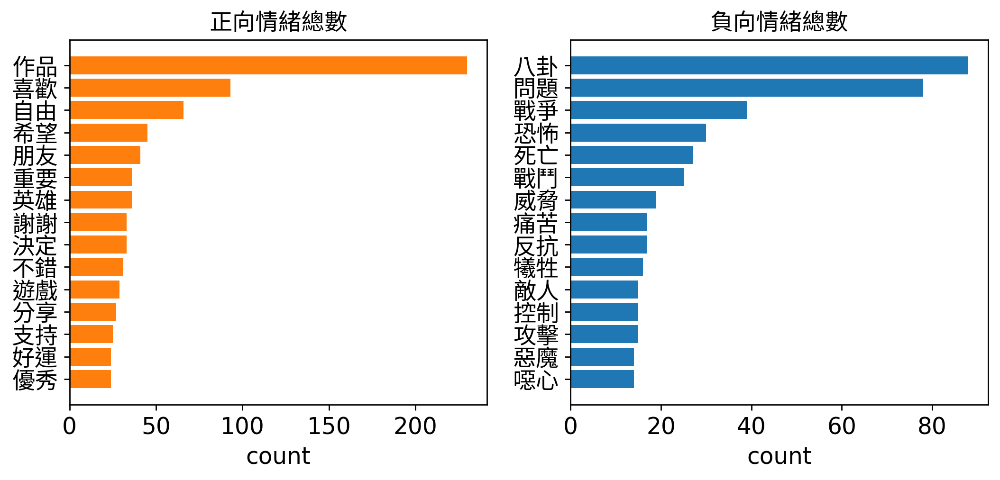

In [ ]:
fig, ax = plt.subplots(1, 2, figsize = (10,4), dpi = 250)

ax[0].barh(pos["word"], pos["size"], color=colors[1])
ax[0].set_xlabel("count")
ax[0].set_yticklabels(pos["word"], fontproperties=fprop)
ax[0].set_title("正向情緒總數", fontproperties=fprop)

ax[1].barh(neg["word"], neg["size"], color=colors[0])
ax[1].set_xlabel("count")
ax[1].set_yticklabels(neg["word"], fontproperties=fprop)
ax[1].set_title("負向情緒總數", fontproperties=fprop)

##### 檢查情緒詞是否符合本文本

###### filtered_df = sent_df[sent_df['sentence'].str.contains('八卦', na=False)]

###### filtered_df.head()

###### for sentence in filtered_df['sentence'].to_list():
######    print(sentence)
######    print("=========================")

##### 情緒代表字_更新

In [ ]:
# 設定要移除的字詞列表
words_to_remove = ['作品','遊戲','決定', '八卦','問題','控制']

# 使用 ~ 運算子和 isin() 方法過濾掉包含在 words_to_remove 列表中的行
liwc_dict_revise = liwc_dict[~liwc_dict['word'].isin(words_to_remove)]

# 使用更新後的情緒字典 merge
ptt_liwc_df_revise = pd.merge(noStop_df[["artUrl", "artDate", "artTitle", "artContent","word"]], liwc_dict_revise, how="left")

# ptt_liwc_df_revise.head()

word_count = ptt_liwc_df_revise.groupby(["word", "sentiments"]).size().reset_index()

word_count = word_count.rename(columns={0: "size"})
word_count = word_count.sort_values(["size"], ascending=False)

word_of_pos = word_count.loc[(word_count["sentiments"] == "positive")]
word_of_neg = word_count.loc[(word_count["sentiments"] == "negative")]

pos = word_of_pos.head(15).sort_values(["size"], ascending=True)
neg = word_of_neg.head(15).sort_values(["size"], ascending=True)

C:\Users\ASUS\AppData\Local\Temp\ipykernel_22032\653768531.py:5: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax[0].set_yticklabels(pos["word"], fontproperties=fprop)
C:\Users\ASUS\AppData\Local\Temp\ipykernel_22032\653768531.py:10: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax[1].set_yticklabels(neg["word"], fontproperties=fprop)


Text(0.5, 1.0, '負向情緒總數')

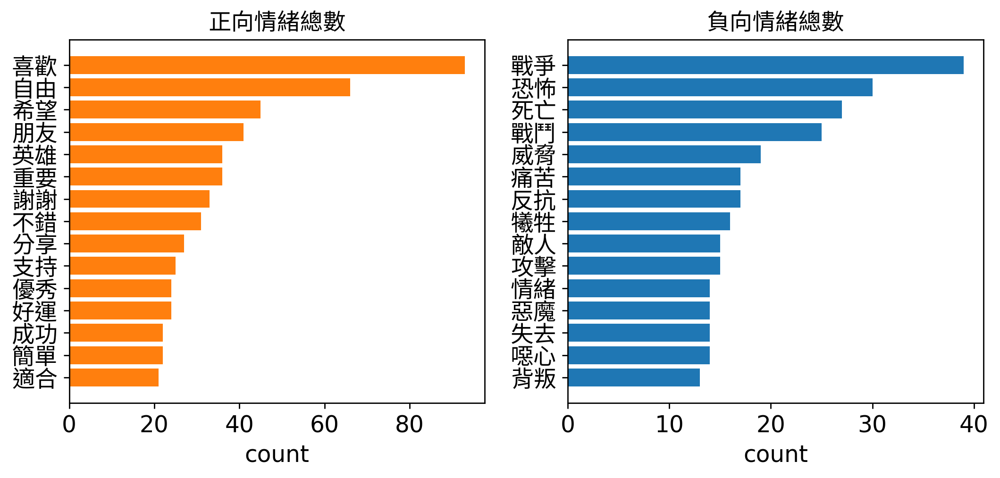

In [ ]:
fig, ax = plt.subplots(1, 2, figsize = (10,4), dpi = 250)

ax[0].barh(pos["word"], pos["size"], color=colors[1])
ax[0].set_xlabel("count")
ax[0].set_yticklabels(pos["word"], fontproperties=fprop)
ax[0].set_title("正向情緒總數", fontproperties=fprop)

ax[1].barh(neg["word"], neg["size"], color=colors[0])
ax[1].set_xlabel("count")
ax[1].set_yticklabels(neg["word"], fontproperties=fprop)
ax[1].set_title("負向情緒總數", fontproperties=fprop)

##### 正負情緒分數趨勢折線圖_更新

In [ ]:
sentiment_count_revise = pd.DataFrame(
    ptt_liwc_df_revise.groupby(["artDate", "sentiments"]).size()
).reset_index()

mask = (sentiment_count_revise['sentiments'] == "positive") | (sentiment_count_revise['sentiments'] == "negative")
sentiment_count_revise = sentiment_count_revise.loc[mask]

sentiment_count_revise = sentiment_count_revise.rename(columns={0: "size"})
sentiment_count_revise = sentiment_count_revise.sort_values(["artDate"])

ptt_sentiment_value_revise = (
    sentiment_count_revise.pivot_table(
        index="artDate", columns="sentiments", values="size", fill_value=0
    )
    .reset_index()
    .rename_axis(None, axis=1)
)

# sentiment 計算方式: positive - negative
ptt_sentiment_value_revise["sentiment_value"] = (
    ptt_sentiment_value_revise["positive"]
    - ptt_sentiment_value_revise["negative"]
)

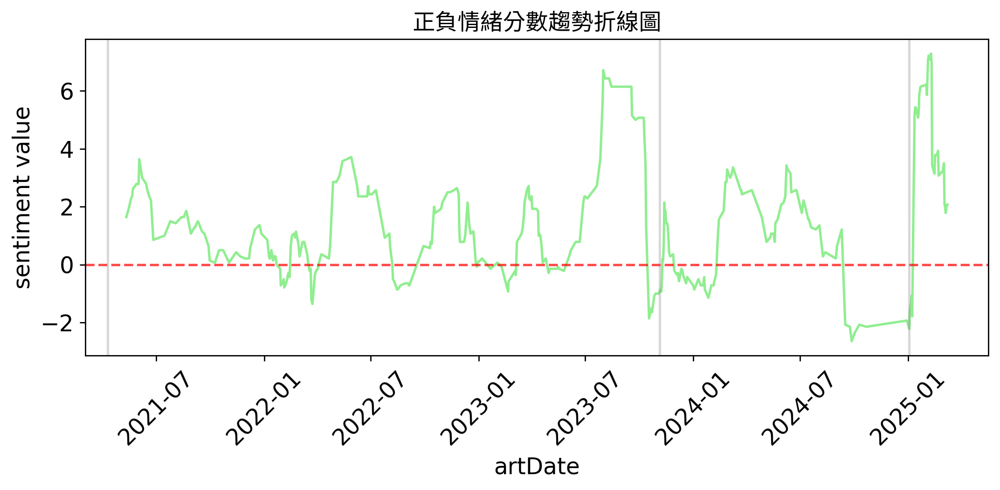

In [ ]:
# 繪製情緒分數趨勢圖
fig, ax = plt.subplots(figsize = (10,4), dpi = 250)
fig.autofmt_xdate()

rolling_days = 14
ax.plot(ptt_sentiment_value_revise["artDate"], ptt_sentiment_value_revise["sentiment_value"].rolling(rolling_days).mean(), color='#90EE90')
ax.axhline(y=0, color='red', linestyle='--', alpha=0.7)
ax.set_xlabel("artDate")
ax.set_ylabel("sentiment value")
plt.setp(ax.get_xticklabels(), rotation=45, ha='center')
plt.title("正負情緒分數趨勢折線圖", fontproperties=fprop)

important_dates = ["2021-04-09", "2023-11-05", "2025-01-03"]
important_dates_pd = pd.to_datetime(important_dates)

for date in important_dates_pd:
    ax.axvline(x=date, color='gray', linestyle='-', alpha=0.3)

plt.show()

### 6. 情緒分析_文字雲

[連結文字](https://)##### 2023/11~2023/12 在正負情緒分數趨勢圖上顯示比較低的分數，用文字雲來觀察這段時間出現的關鍵字

##### 文字雲

In [ ]:
ptt_liwc_df_revise = pd.merge(ptt_liwc_df_revise, ptt_sentiment_value_by_article[['artUrl', 'sentiment_class']], how="left")

# ptt_liwc_df_revise.head()

sent_df = pd.merge(sent_df, ptt_sentiment_value_by_article[['artUrl', 'sentiment_class']], how="left")

# sent_df.head()


In [ ]:
date = "2023-11-05"
end_date = "2023-12-05"
mask = (ptt_liwc_df_revise['artDate'] >= pd.Timestamp(date).date()) & (
    ptt_liwc_df_revise['artDate'] <= pd.Timestamp(end_date).date()) & (
    ptt_liwc_df_revise['sentiment_class'] == "負向")

ptt_df_wc = ptt_liwc_df_revise.loc[mask]

# ptt_df_wc.head(10)

date = "2023-11-05"
end_date = "2023-12-05"
mask = (ptt_liwc_df_revise['artDate'] >= pd.Timestamp(date).date()) & (
    ptt_liwc_df_revise['artDate'] <= pd.Timestamp(end_date).date()) & (
    ptt_liwc_df_revise['sentiment_class'] == "負向")

ptt_df_wc = ptt_liwc_df_revise.loc[mask, ["artDate", "word"]]


word_count_count = pd.DataFrame(
    ptt_df_wc.groupby(["word"]).size()
).reset_index().rename(columns={0: "size"})

word_count_count = word_count_count.sort_values(by='size', ascending=False)

# word_count_count.head(10)

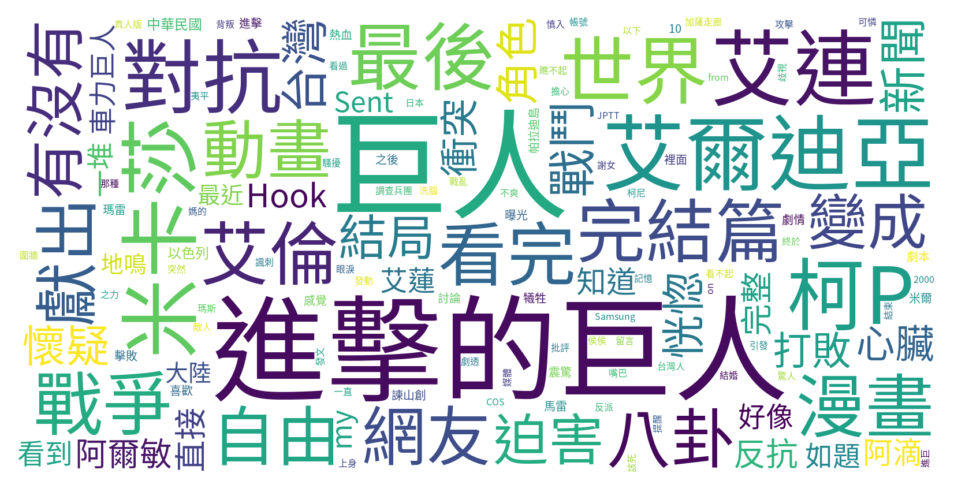

In [ ]:
# wordcloud 的 input 是 dictionary
font_path = "./dict/SourceHanSansTW-Regular.otf"
wc_dict = dict(zip(word_count_count['word'], word_count_count['size']))
cloud = WordCloud(scale = 4, max_words=200, background_color="white", font_path=font_path)
cloud.generate_from_frequencies(wc_dict)

plt.figure(figsize=(8, 4), dpi=150)
plt.imshow(cloud, interpolation="bilinear")
plt.axis("off")
plt.show()

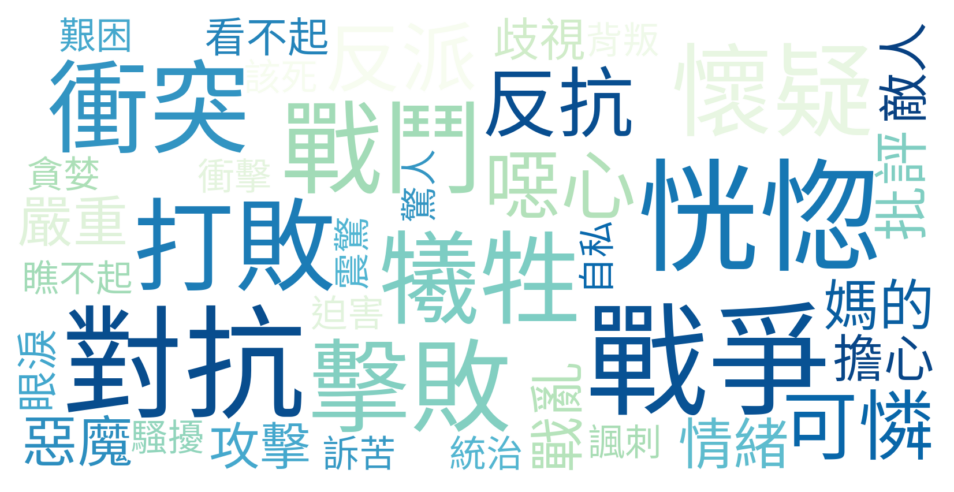

In [ ]:
date = "2023-11-05"
end_date = "2023-12-05"
mask = (ptt_liwc_df_revise['artDate'] >= pd.Timestamp(date).date()) & (
    ptt_liwc_df_revise['artDate'] <= pd.Timestamp(end_date).date()) & ( # 時間區間
    ptt_liwc_df_revise['sentiment_class'] == "負向")  & ( # 負面文章
    ptt_liwc_df_revise['artContent'].str.contains('巨人')) & ( # 內文包含巨人
    ptt_liwc_df_revise["sentiments"] == "negative") # 負面情緒字

ptt_df_wc = ptt_liwc_df_revise.loc[mask, ["artDate", "word"]]
wc = ptt_df_wc.groupby(["word"]).size().to_dict()

# wordcloud 的 input 是 dictionary
cloud = WordCloud(scale = 4, max_words=200, background_color="white", font_path=font_path, colormap="GnBu")
cloud.generate_from_frequencies(wc)
# 繪圖
plt.figure(figsize=(8, 4), dpi=150)
plt.imshow(
    cloud,
    interpolation="bilinear"
)
plt.axis("off")
plt.show()

In [ ]:
date = "2023-11-05"
end_date = "2023-12-05"
mask = (sent_df['artDate'] >= pd.Timestamp(date).date()) & (
    sent_df['artDate'] <= pd.Timestamp(end_date).date()) & (
    sent_df['sentiment_class'] == "負向") & (
    sent_df['artContent'].str.contains('巨人')) & (
    sent_df['sentence'].str.contains('懷疑'))

df_ = sent_df.loc[mask, ["artDate", "artContent", "sentence"]]
index_list = df_.index.tolist()


# 取得前後各5筆的索引 => 目的為查看包含該詞彙句子的上下文
surrounding_indices = []
for index in index_list:
    surrounding_indices.extend(range(index - 5, index + 6))

# 去除重複的索引，並確保不超出範圍
surrounding_indices = list(set(filter(lambda x: x >= 0 and x < len(sent_df), surrounding_indices)))

# 依據索引取得相應的資料
result_df = sent_df.iloc[surrounding_indices].sort_index()
result_df[['artTitle', 'sentence', 'sentiment_class']]

,artTitle,sentence,sentiment_class
5674,[問卦]進擊的巨人漫畫早完結，還在討論劇情？==,也是極少數中的極少數吧,負向
5675,[問卦]進擊的巨人漫畫早完結，還在討論劇情？==,話說,負向
5676,[問卦]進擊的巨人漫畫早完結，還在討論劇情？==,最近結局,負向
5677,[問卦]進擊的巨人漫畫早完結，還在討論劇情？==,真要說動畫跟漫畫有啥不一樣的,負向
5678,[問卦]進擊的巨人漫畫早完結，還在討論劇情？==,就是漫畫中最後有幾幕,負向
5679,[問卦]進擊的巨人漫畫早完結，還在討論劇情？==,讓人有點懷疑米卡莎是不是在艾蓮死後,負向
5680,[問卦]進擊的巨人漫畫早完結，還在討論劇情？==,又跟約翰結婚了,負向
5681,[問卦]進擊的巨人漫畫早完結，還在討論劇情？==,但諫山創故意不說清楚,負向
5682,[問卦]進擊的巨人漫畫早完結，還在討論劇情？==,但動畫中,負向
5683,[問卦]進擊的巨人漫畫早完結，還在討論劇情？==,很明顯,負向


##### 針對2023/11《進擊的巨人》動漫完結時，負面情緒多於正面情緒的部分進行進一步分析，可以發現內容多為討論動漫與漫畫不同分鏡處理造成的劇情解讀分歧。

### **1. 前處理**

###### 遇到ckiptagger相關問題，重新下載正確版本的numpy、gdown後已解決

##### 匯入函式庫

In [ ]:
from ckiptagger import data_utils, construct_dictionary, WS, POS, NER
import re
from wordcloud import WordCloud
import pandas as pd
import matplotlib.pyplot as plt
import time
import datetime

##### 繪圖相關設定

In [ ]:
# 設定圖的中文字體
plt.rcParams['font.sans-serif'] = ['Microsoft JhengHei'] # Windows 中文字體

##### CKIP相關設定

In [ ]:
data_utils.download_data_gdown("./")  # 下載ckip model

Downloading...
From (original): https://drive.google.com/uc?id=1efHsY16pxK0lBD2gYCgCTnv1Swstq771
From (redirected): https://drive.google.com/uc?id=1efHsY16pxK0lBD2gYCgCTnv1Swstq771&confirm=t&uuid=b5c194af-9ca4-42e9-9ed8-cb25c8125b51
To: c:\Users\ASUS\Downloads\SMA_2025S-main\studyGroup\data.zip
100%|██████████| 1.88G/1.88G [05:40<00:00, 5.52MB/s]


In [ ]:
# 將三份工具的模型路徑指向我們剛才下載的檔案「data」
ws = WS("./data")
pos = POS("./data")
ner = NER("./data")

c:\Users\ASUS\Downloads\SMA_2025S-main\.venv\Lib\site-packages\ckiptagger\model_ws.py:106: UserWarning: `tf.nn.rnn_cell.LSTMCell` is deprecated and will be removed in a future version. This class is equivalent as `tf.keras.layers.LSTMCell`, and will be replaced by that in Tensorflow 2.0.
  cell = tf.compat.v1.nn.rnn_cell.LSTMCell(hidden_d, name=name)
c:\Users\ASUS\Downloads\SMA_2025S-main\.venv\Lib\site-packages\ckiptagger\model_pos.py:56: UserWarning: `tf.nn.rnn_cell.LSTMCell` is deprecated and will be removed in a future version. This class is equivalent as `tf.keras.layers.LSTMCell`, and will be replaced by that in Tensorflow 2.0.
  cell = tf.compat.v1.nn.rnn_cell.LSTMCell(hidden_d, name=name)
c:\Users\ASUS\Downloads\SMA_2025S-main\.venv\Lib\site-packages\ckiptagger\model_ner.py:57: UserWarning: `tf.nn.rnn_cell.LSTMCell` is deprecated and will be removed in a future version. This class is equivalent as `tf.keras.layers.LSTMCell`, and will be replaced by that in Tensorflow 2.0.
  cel

##### 匯入文章

In [ ]:
df = pd.read_csv('./raw_data/AOT_20210409to20250309.csv')

##### 定義斷句處理

In [ ]:
def Segmentation_Core(data, tokenizer):
    
    regexPattern = '|'.join(map(re.escape, tokenizer)) # 將所有的斷行字元配上 escape 以防失效
    output_list = re.split(regexPattern, data)
    output_list = list(filter(None, output_list)) # 過濾空白行
    return output_list

def Sentence_Segmentation(article, keep_digits=False, keep_alphabets=False):
    """ Sentence_Segmentation function 用於執行中文斷行任務

    順序如下：
    1. 去除(\\n)
    2. 去除特殊符號字元
    3. 保留數字
    4. 依照斷句字元進行斷句全形的分號、逗號、句號、問號以及驚嘆號
    5. 避免空白斷句結果

    Args:
        article(string): 欲斷行之文章內容
        keep_digits(Boolean): 決定是否保留數字於斷行後的結果
        keep_alphabets(Boolean): 決定是否保留字母於斷行後的結果
    Returns:
        List [] 每個 element 就是一行
    """
    sepical_symbols = r'[.＂<>:《》+\-=#$%&()*@＃＄％＆＇\(\)\[\]\{\}（）＊＋－／：\
    ＜＝＞＠［＼］＾＿｀｛｜｝～｟｠｢｣､、〃》「」『』【】〔〕〖〗〘〙〚〛〜〝〞〟〰〾〿–—一‘’‛“”„‟…‧﹏★→─]+'
    segmentation_used_note = (";", "；", "！", "!", "？", "?", "。")
    

    paragraphs = list(filter(lambda x: re.sub(r'\s+','', x), article.split("\n")))
    # print(len(paragraphs))
    # print(paragraphs)
    
    result = []
    for paragraph in paragraphs:

        clean_paragraph = paragraph
        try:
            if not keep_digits:
                clean_paragraph = re.sub(r'\d*\.?\d+','', clean_paragraph) #remove space & digits
            if not keep_alphabets:
                clean_paragraph = re.sub('[a-zA-Z]+', '', clean_paragraph)
            
            clean_paragraph = re.sub(r'[\s]+','', clean_paragraph) #remove space
            
            clean_paragraph = re.sub(sepical_symbols,'',clean_paragraph)
            
        except:
            return "error"
        
        res = Segmentation_Core(clean_paragraph, segmentation_used_note)
        result.append(res)
    
    return result

##### 定義斷詞處理

In [ ]:
# 自定義辭典
with open('dict/user_dict.txt', encoding='utf-8') as f: # add encoding='utf-8' to fix error
    lines = f.read().splitlines()

dict = {k.split()[0]: k.split()[1] for v, k in enumerate(lines)}
dictionary = construct_dictionary(dict)
print(dictionary)

[(2, {'艾倫': 10.0, '里維': 10.0, '漢吉': 10.0, '萊納': 10.0, '瑪雷': 10.0, '牆內': 10.0, '巨人': 10.0, '座標': 10.0, '雷槍': 10.0}), (3, {'米卡莎': 10.0, '阿爾敏': 10.0, '尤彌爾': 10.0, '艾爾文': 10.0, '憲兵團': 10.0, '硬質化': 10.0}), (4, {'貝爾托特': 10.0, '帕拉迪島': 10.0, '艾爾迪亞': 10.0, '調查兵團': 10.0, '訓練兵團': 10.0, '羅塞之牆': 10.0, '希娜之牆': 10.0, '無垢巨人': 10.0, '九大巨人': 10.0, '始祖巨人': 10.0, '鎧之巨人': 10.0, '顎之巨人': 10.0, '戰鎚巨人': 10.0, '車力巨人': 10.0, '自由之翼': 10.0}), (5, {'漢吉·佐耶': 10.0, '萊納·布朗': 10.0, '瑪利亞之牆': 10.0, '進擊的巨人': 10.0, '超大型巨人': 10.0}), (6, {'艾倫·耶格爾': 10.0, '里維·阿克曼': 10.0, '立體機動裝置': 10.0}), (7, {'米卡莎·阿克曼': 10.0, '貝爾托特·胡佛': 10.0, '尤彌爾·弗利茲': 10.0, '艾爾文·史密斯': 10.0}), (8, {'阿爾敏·亞魯雷特': 10.0})]


##### 定義NLP處理

In [ ]:
def get_pos(post_id, word_sentence, pos_sentence):
    tokens = []
    # print("\nPOS: ", end="\u3000")
    assert len(word_sentence) == len(pos_sentence)
    for word, pos in zip(word_sentence, pos_sentence): # token level
        tokens.append([post_id, word, pos]) 
    # print(f"{word}({pos})", end="\u3000")
    return tokens

def get_ner(post_id, entity_sentence):
    entities = []
    # print("\nNER:___________ ")
    for entity in sorted(entity_sentence): # token level
        entities.append([post_id, entity[3], entity[2]]) 
    return entities

def get_nlp_result(data_df):
    start = time.time()

    pos_list = []
    entity_list = []
    sentence_list = []
    
    # 遍歷 dataframe 的每筆資料
    for index, row in data_df.iterrows(): # document level    
    # print(f"\ndocument {index}") 

        # 資料清理 ＆ 斷句
        tmp = Sentence_Segmentation(row['artContent']) 
        flat_list = [item for sublist in tmp for item in sublist]

        # ckip
        word_sentence_list = ws(flat_list, coerce_dictionary = dictionary)
        pos_sentence_list = pos(word_sentence_list)
        entity_sentence_list = ner(word_sentence_list, pos_sentence_list)

        # 遍歷該 document 中的每一個句子
        for i, sentence in enumerate(flat_list):
            # print(f"sentence {i}: {sentence}")
            sentence_list.append([row['system_id'], sentence])            
            temp_tokens = get_pos(row['system_id'], word_sentence_list[i], pos_sentence_list[i])
            temp_entites = get_ner(row['system_id'], entity_sentence_list[i])

            pos_list.append(temp_tokens)
            if len(temp_entites) != 0:
                entity_list.append(temp_entites)
            
    pos_flat = [item for sublist in pos_list for item in sublist]
    entity_flat = [item for sublist in entity_list for item in sublist]

    pos_table = pd.DataFrame(data=pos_flat, 
                    columns=['system_id','word','pos'])        
    
    entity_table = pd.DataFrame(data=entity_flat, 
                        columns=['system_id','word','ner']) 

    sentence_table = pd.DataFrame(data=sentence_list, 
                    columns=['system_id','sentence']) 

    end = time.time()
    print("time costing: {}".format(end - start))

    return pos_table, entity_table, sentence_table

##### 執行斷句、斷詞&NLP

In [ ]:
pos_table, entity_table, sentence_table = get_nlp_result(df)

time costing: 521.105390548706


##### 儲存執行結果

In [ ]:
# 將結果存成csv
pos_table.to_csv('raw_data/posTable_AOT_20210409to20250309.csv', index = False)
entity_table.to_csv('raw_data/entityTable_AOT_20210409to20250309.csv', index = False)
sentence_table.to_csv('raw_data/sentenceTable_AOT_20210409to20250309.csv', index = False)

### **2. CKIP標註_詞性分析**

##### 匯入資料

In [ ]:
# 讀取已經執行完畢的結果
pos_table = pd.read_csv('raw_data/posTable_AOT_20210409to20250309.csv') 
entity_table = pd.read_csv('raw_data/entityTable_AOT_20210409to20250309.csv') 
sentence_table = pd.read_csv('raw_data/sentenceTable_AOT_20210409to20250309.csv') 

##### NER_種類

Text(0.5, 0, 'Frequency')

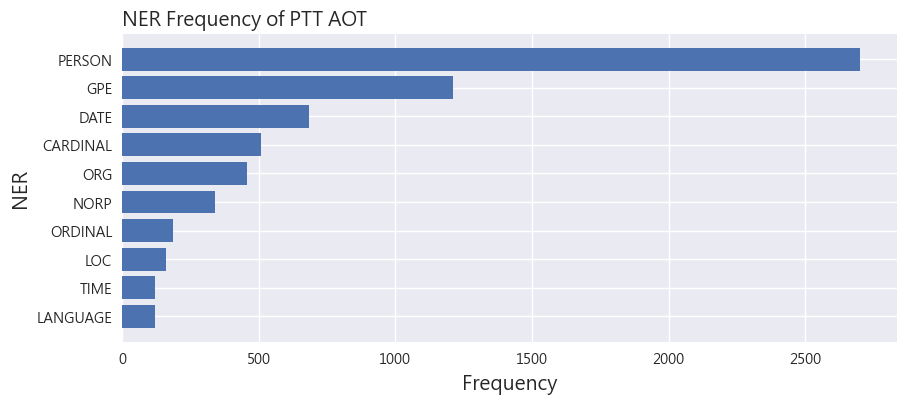

In [ ]:
# entity_table['ner'].unique() 看有哪些種類
ner_count = entity_table.groupby(['ner'])['ner'].count().reset_index(name='count').sort_values(['count'], ascending=False).head(10)

# ner_count 

ner = ner_count['ner']
count = ner_count['count']

fig, ax = plt.subplots(figsize =(10, 4))
ax.barh(ner, count)
ax.invert_yaxis()
ax.set_title('NER Frequency of PTT AOT',loc ='left', size = 14)
ax.set_ylabel('NER', size = 14)
ax.set_xlabel('Frequency', size = 14)

# fig.show()

##### NER_NORP

Text(0.5, 0, 'Word Frequency')

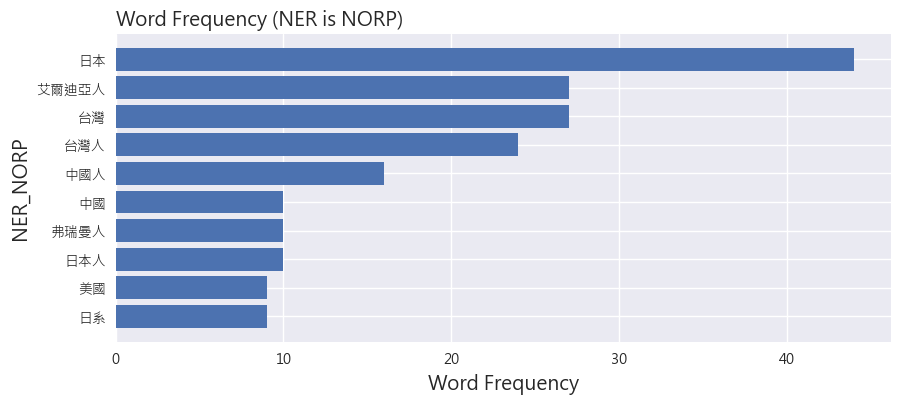

In [ ]:
# 篩選ner為NORP的資料
l_noun = ["NORP"]
NORP = entity_table[entity_table.ner.isin(l_noun)]

# 計算每個名詞提到的次數，選出前10個
ner_count = NORP.groupby('word')['word'].agg(['count'])
ner_count = ner_count.sort_values(['count'],ascending=False)['count'].nlargest(10).reset_index()
ner_count

word = ner_count['word']
count = ner_count['count']

fig, ax = plt.subplots(figsize =(10, 4))
ax.barh(word, count)
ax.invert_yaxis()
ax.set_title('Word Frequency (NER is NORP)',loc ='left', size = 14)
ax.set_ylabel('NER_NORP', size = 14)
ax.set_xlabel('Word Frequency', size = 14)

# fig.show()

##### NER_ORG

Text(0.5, 0, 'Word Frequency')

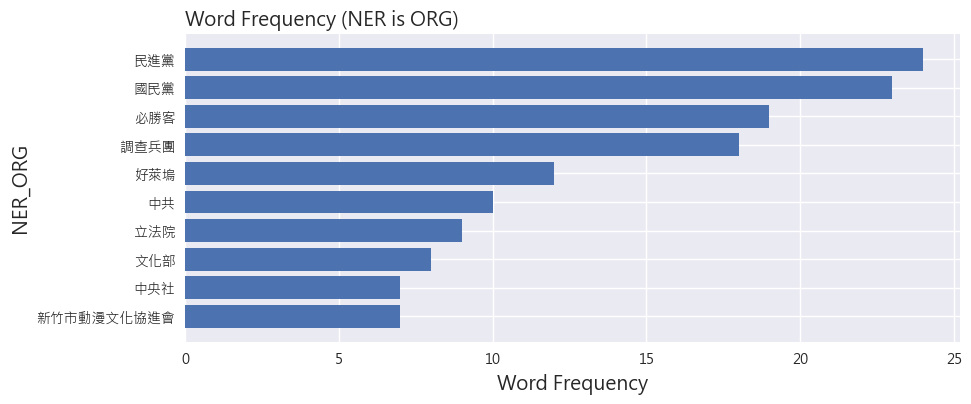

In [ ]:
# 篩選ner為ORG的資料
l_noun = ["ORG"]
ORG = entity_table[entity_table.ner.isin(l_noun)]

# # 計算每個名詞提到的次數，選出前10個
ner_count = ORG.groupby('word')['word'].agg(['count'])
ner_count = ner_count.sort_values(['count'],ascending=False)['count'].nlargest(10).reset_index()
ner_count

word = ner_count['word']
count = ner_count['count']

fig, ax = plt.subplots(figsize =(10, 4))
ax.barh(word, count)
ax.invert_yaxis()
ax.set_title('Word Frequency (NER is ORG)',loc ='left', size = 14)
ax.set_ylabel('NER_ORG', size = 14)
ax.set_xlabel('Word Frequency', size = 14)

# fig.show()

##### NER_PERSON

Text(0.5, 0, 'Word Frequency')

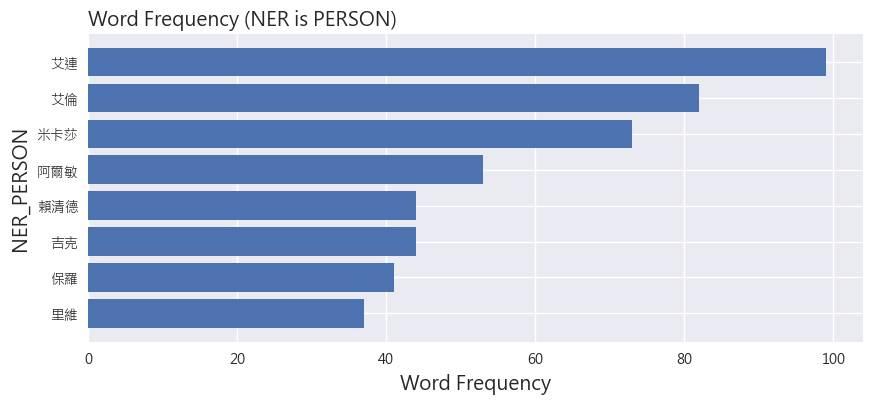

In [ ]:
# 篩選ner為PERSON的資料
l_noun = ["PERSON"]
PERSON = entity_table[entity_table.ner.isin(l_noun)]

# 計算每個名詞提到的次數，選出前8個
ner_count = PERSON.groupby('word')['word'].agg(['count'])
ner_count = ner_count.sort_values(['count'],ascending=False)['count'].nlargest(8).reset_index()

word = ner_count['word']
count = ner_count['count']

fig, ax = plt.subplots(figsize =(10, 4))
ax.barh(word, count)
ax.invert_yaxis()
ax.set_title('Word Frequency (NER is PERSON)',loc ='left', size = 14)
ax.set_ylabel('NER_PERSON', size = 14)
ax.set_xlabel('Word Frequency', size = 14)

# fig.show()

##### NER_彙總

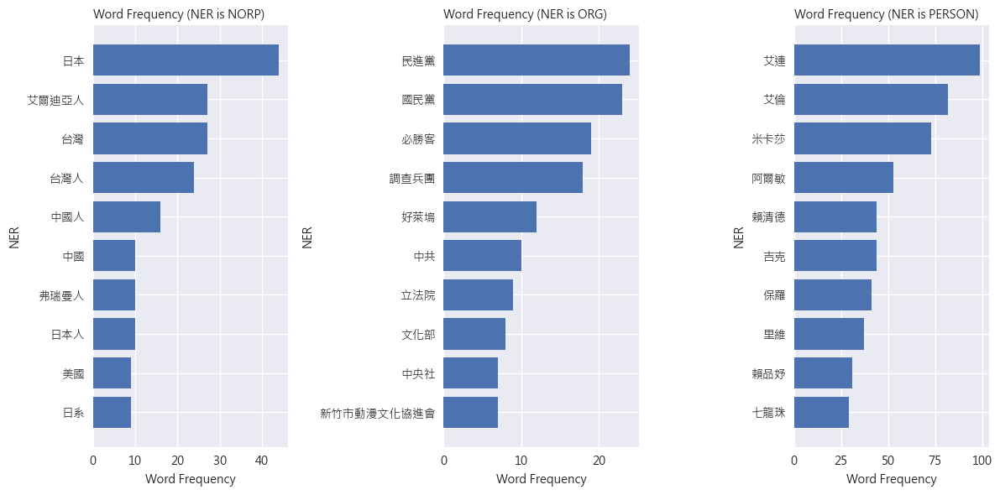

In [ ]:
# 創建一個包含三個子圖的圖表
fig, axes = plt.subplots(1, 3, figsize=(12, 6))

# 篩選ner為NORP的資料，取前10個
l_noun = ["NORP"]
NORP = entity_table[entity_table.ner.isin(l_noun)]
ner_count = NORP.groupby('word')['word'].agg(['count'])
ner_count = ner_count.sort_values(['count'],ascending=False)['count'].nlargest(10).reset_index()

# NORP圖表
word = ner_count['word']
count = ner_count['count']
axes[0].barh(word, count)
axes[0].invert_yaxis()
axes[0].set_title('Word Frequency (NER is NORP)', loc='left', size=10)
axes[0].set_ylabel('NER', size=10)
axes[0].set_xlabel('Word Frequency', size=10)

# 篩選ner為ORG的資料，取前10個
l_noun = ["ORG"]
ORG = entity_table[entity_table.ner.isin(l_noun)]
ner_count = ORG.groupby('word')['word'].agg(['count'])
ner_count = ner_count.sort_values(['count'],ascending=False)['count'].nlargest(10).reset_index()

# ORG圖表
word = ner_count['word']
count = ner_count['count']
axes[1].barh(word, count)
axes[1].invert_yaxis()
axes[1].set_title('Word Frequency (NER is ORG)', loc='left', size=10)
axes[1].set_ylabel('NER', size=10)
axes[1].set_xlabel('Word Frequency', size=10)

# 篩選ner為PERSON的資料，取前10個
l_noun = ["PERSON"]
PERSON = entity_table[entity_table.ner.isin(l_noun)]
ner_count = PERSON.groupby('word')['word'].agg(['count'])
ner_count = ner_count.sort_values(['count'],ascending=False)['count'].nlargest(10).reset_index()

# PERSON圖表
word = ner_count['word']
count = ner_count['count']
axes[2].barh(word, count)
axes[2].invert_yaxis()
axes[2].set_title('Word Frequency (NER is PERSON)', loc='left', size=10)
axes[2].set_ylabel('NER', size=10)
axes[2].set_xlabel('Word Frequency', size=10)


plt.tight_layout()


plt.show()

**NORP**
- 「日本」是最頻繁提及的NORP實體，這很合理因為《進擊的巨人》是日本動漫
- 「艾爾迪亞人」、「台灣」和「台灣人」也經常被提及，顯示討論可能將作品與現實地緣政治或身份議題進行比較


**ORG**
- 「民進黨」和「國民黨」是最常被提及的組織，這表明PTT討論中可能將作品主題與台灣政治環境連結
- 「必勝客」則是因為與則是因為與《進擊的巨人》進行聯名活動，因而被提及


**PERSON**
- 「艾連」、「艾倫」為作品主角，毫無疑問是最常被提及的人物
- 「米卡莎」和「阿爾敏」為主要角色，也有很高的提及率
- 其他一些政治人物則為在進行比擬時被提及

**綜合洞見**

這些發現顯示PTT上的進擊的巨人討論不僅限於作品本身，還涉及政治隱喻、文化比較和現實議題，反映了台灣網路社群將流行文化與社會政治議題連結的傾向。



In [ ]:
keyword_list = ['進擊的巨人']
aot_selected = df[df['artContent'].str.contains('|'.join(keyword_list),regex=True)]
print(f"{' '.join(keyword_list)}：{aot_selected.shape[0]}篇相關貼文")
aot_selected

進擊的巨人：580篇相關貼文


,system_id,artUrl,artTitle,artDate,artPoster,artCatagory,artContent,artComment,e_ip,insertedDate,dataSource
0,1,https://www.ptt.cc/bbs/Gossiping/M.1617898345....,[問卦]進擊的巨人跟EVA平起平坐了嗎？,2021-04-09 00:12:23,WARgame723,Gossiping,進擊的巨人 完結了，壓倒性好評\n\nEVA 熱度持續20年的神作\n\n巨人以後來者之姿挑...,"[{""cmtStatus"": ""→"", ""cmtPoster"": ""shadowdio"", ...",111.83.27.218,2021-04-09 00:46:12,ptt
1,2,https://www.ptt.cc/bbs/Gossiping/M.1617925959....,[問卦]拿掉巨人進擊的巨人還剩什麼？,2021-04-09 07:52:37,ReiFu21,Gossiping,進擊的巨人終於完結了\n\n總共139話的劇情\n\n都圍繞在巨人身上\n\n\n但是如果拿...,"[{""cmtStatus"": ""推"", ""cmtPoster"": ""ilanese"", ""c...",180.177.69.24,2021-04-10 00:53:56,ptt
6,7,https://www.ptt.cc/bbs/Gossiping/M.1617941998....,[問卦]好巨人結局到底要怎樣大家才滿意？(無雷,2021-04-09 12:19:56,yorkyoung,Gossiping,如題\n\n大家好我是約克羊\n\n事情是這樣的\n\n進擊的巨人終於完結了\n\n不少人都...,"[{""cmtStatus"": ""推"", ""cmtPoster"": ""kilof"", ""cmt...",1.172.146.130,2021-04-10 00:56:09,ptt
8,9,https://www.ptt.cc/bbs/Gossiping/M.1617947682....,[新聞]進擊的巨人完結篇上市結束11年半連載,2021-04-09 13:54:39,juyhnmki,Gossiping,1.媒體來源:\nCNA\n2.記者署名:\n楊明珠\n3.完整新聞標題:\n進擊的巨人完結...,"[{""cmtStatus"": ""噓"", ""cmtPoster"": ""sars7125889""...",180.217.47.36,2021-04-10 00:57:10,ptt
9,10,https://www.ptt.cc/bbs/Gossiping/M.1617950206....,Re:[問卦]巨人鋼鍊鬼滅火影海賊怎麼排名???,2021-04-09 14:36:44,freeclouds,Gossiping,有人在問這些 漫畫怎麼排名 客觀數據 當然是看漫畫銷量啦\nhttps://www.yout...,"[{""cmtStatus"": ""→"", ""cmtPoster"": ""shiragawa"", ...",180.217.38.178,2021-04-10 00:57:33,ptt
...,...,...,...,...,...,...,...,...,...,...,...
675,676,https://www.ptt.cc/bbs/movie/M.1740968231.A.67...,《進擊的巨人》4D版第二波特典：導演聲優簽名板,2025-03-03 10:17:09,toebb,movie,https://i.imgur.com/Gq9Xkeb.jpeg\n【目前公開情報】\n《劇...,"[{""cmtStatus"": ""推"", ""cmtPoster"": ""chyou2003"", ...",114.39.193.139,2025-03-04 01:05:15,ptt
676,677,https://www.ptt.cc/bbs/movie/M.1741091782.A.CE...,[討論]會因為片長影響進戲院觀看的意願嗎？,2025-03-04 20:36:20,j09367,movie,我是客家人啦！因為被《你的名字》影響，才理解有些動畫聲光效果用影廳呈現的效果是\n不能取代的...,"[{""cmtStatus"": ""推"", ""cmtPoster"": ""wusbetz"", ""c...",150.116.90.251,2025-03-05 01:32:40,ptt
677,678,https://www.ptt.cc/bbs/movie/M.1741153155.A.98...,[情報]《進擊的巨人》調查兵團場特典：紀念卡,2025-03-05 13:39:13,toebb,movie,https://i.imgur.com/jxDTGvo.jpeg\n【目前公開情報】\n\n...,"[{""cmtStatus"": ""推"", ""cmtPoster"": ""LoserLee"", ""...",114.39.192.223,2025-03-06 01:36:40,ptt
678,679,https://www.ptt.cc/bbs/movie/M.1741266810.A.7A...,[好雷]太空先鋒TheRightStuff(1983),2025-03-06 21:13:28,BF109Pilot,movie,雷文防雷資訊頁\n\n\n\n~*-*~*-*~*-*~*-*~*-*~*-*~*-*~*-...,"[{""cmtStatus"": ""推"", ""cmtPoster"": ""wittmann4213...",203.204.56.131,2025-03-07 01:37:02,ptt


##### POS_種類

C:\Users\ASUS\AppData\Local\Temp\ipykernel_25720\1397436045.py:15: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  fig.show()


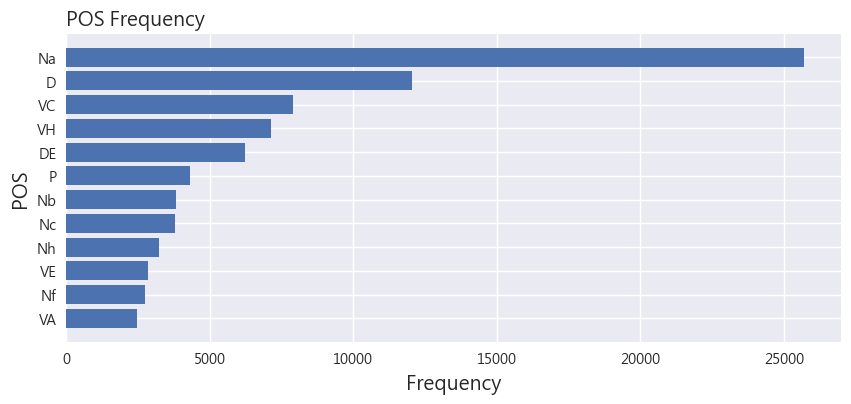

In [ ]:
pos_table['pos'].unique()
pos_filter = pos_table[~pos_table.pos.isin(['COMMACATEGORY', 'PARENTHESISCATEGORY', 'PERIODCATEGORY', 'COLONCATEGORY'])]
pos_count = pos_filter.groupby(['pos'])['pos'].count().reset_index(name='count').sort_values(['count'], ascending=False).head(12)
# pos_count

pos = pos_count['pos']
count = pos_count['count']

fig, ax = plt.subplots(figsize =(10, 4))
ax.barh(pos, count)
ax.invert_yaxis()
ax.set_title('POS Frequency',loc ='left', size = 14)
ax.set_ylabel('POS', size = 14)
ax.set_xlabel('Frequency', size = 14)
fig.show()

##### POS_Nb

C:\Users\ASUS\AppData\Local\Temp\ipykernel_25720\2685969301.py:17: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  fig.show()


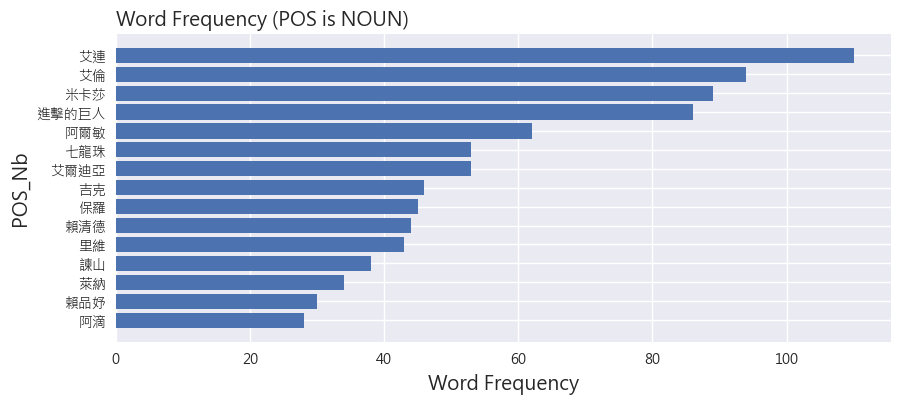

In [ ]:
# 篩選pos為專有名詞的資料，選出前15個
l_noun = ["Nb"] #,"Na"
noun = pos_table[pos_table.pos.isin(l_noun)]
noun_count = noun[['word']].groupby(['word'])['word'].count().reset_index(name='count').sort_values(['count'], ascending=False).head(15)
# noun_count

word = noun_count['word']
count = noun_count['count']

fig, ax = plt.subplots(figsize =(10, 4))
ax.barh(word, count)
ax.invert_yaxis()
ax.set_title('Word Frequency (POS is NOUN)',loc ='left', size = 14)
ax.set_ylabel('POS_Nb', size = 14)
ax.set_xlabel('Word Frequency', size = 14)

fig.show()

##### POS_VC

C:\Users\ASUS\AppData\Local\Temp\ipykernel_25720\3867282913.py:18: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  fig.show()


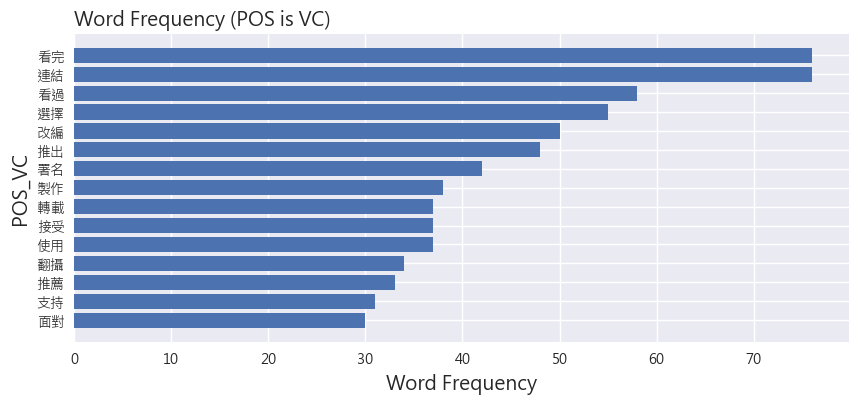

In [ ]:
# 篩選pos為動詞的資料，選出前15個
l_verb = ["VC"] # ,"VH","VA"
verb = pos_table[pos_table.pos.isin(l_verb)] # 選取特定詞性
verb = verb[verb['word'].map(len) > 1] # 把長度為1的字去除掉
verb_count = verb[['word']].groupby(['word'])['word'].count().reset_index(name='count').sort_values(['count'], ascending=False).head(15)
# verb_count

word = verb_count['word']
count = verb_count['count']

fig, ax = plt.subplots(figsize =(10, 4))
ax.barh(word, count)
ax.invert_yaxis()
ax.set_title('Word Frequency (POS is VC)',loc ='left', size = 14)
ax.set_ylabel('POS_VC', size = 14)
ax.set_xlabel('Word Frequency', size = 14)

fig.show()


##### POS_彙總

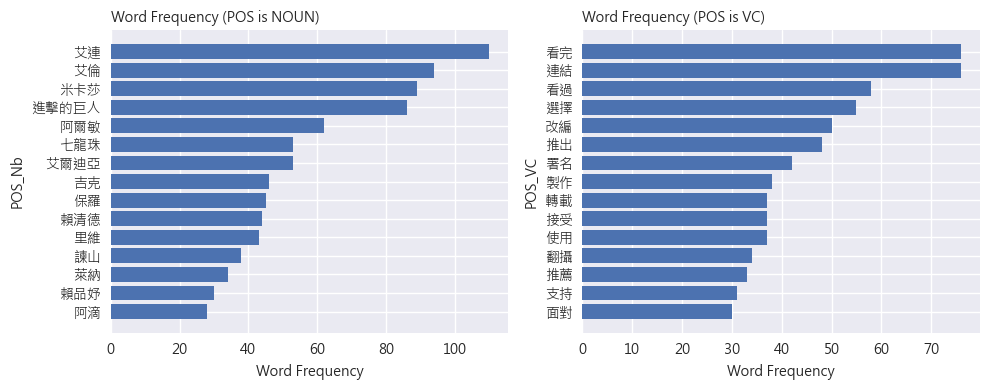

In [ ]:
word_noun= noun_count['word']
count_noun = noun_count['count']
word_verb= verb_count['word']
count_verb = verb_count['count']

fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(10, 4))

# NOUN圖
ax1.barh(word_noun, count_noun)
ax1.invert_yaxis()
ax1.set_title('Word Frequency (POS is NOUN)', loc='left', size=10)
ax1.set_ylabel('POS_Nb', size=10)
ax1.set_xlabel('Word Frequency', size=10)

# VC圖
ax2.barh(word_verb, count_verb)
ax2.invert_yaxis()
ax2.set_title('Word Frequency (POS is VC)', loc='left', size=10)
ax2.set_ylabel('POS_VC', size=10)
ax2.set_xlabel('Word Frequency', size=10)


plt.tight_layout()


plt.show()

**名詞**
- 「艾連」、「艾倫」：最常被提及的名詞，顯示這個角色是討論核心
- 「米卡莎」、「阿爾敏」、「進擊的巨人」：核心角色和作品標題出現頻率高
- 「七龍珠」：討論中可能有作品間比較

**動詞**
-  「看完」、「連結」、「看過」和「選擇」:常用動詞，表明許多討論圍繞著觀看體驗，也顯示討論者積極分享觀看經驗和選擇
-  「改編」、「推出」、「署名」、「製作」、「轉載」：可能與作品生產和評價有關

**綜合洞見**

這些數據顯示PTT上「進擊的巨人」的討論非常角色中心化，用戶主要分享觀看體驗並對劇情和角色表達立場和情感反應，而動詞使用揭示了豐富的互動模式，包括分享、評價和表達支持等。

### **3. SnowNLP_情緒分析**

##### 匯入套件

In [ ]:
from snownlp import SnowNLP

##### SnowNLP_情緒分析_情緒分數計算

In [ ]:
# 看含關鍵字"進擊的巨人"的相關文章情緒表現
sentence_table = pd.read_csv("raw_data/sentenceTable_AOT_20210409to20250309.csv") 
sentiment_date = pd.merge(sentence_table,aot_selected[['system_id','artDate','dataSource']],on='system_id',how='left').dropna()

# 定義情緒分數函數
def get_sentiment(sent):
    s = SnowNLP(sent)
    return s.sentiments

# 幫每句話加上情緒分數
sentiment_date['sentimentValue'] = sentiment_date.apply(lambda row : get_sentiment(row['sentence'],), axis = 1)
# sentiment_date
# sentiment_date['sentimentValue'].describe()

##### SnowNLP_情緒分析_盒狀圖

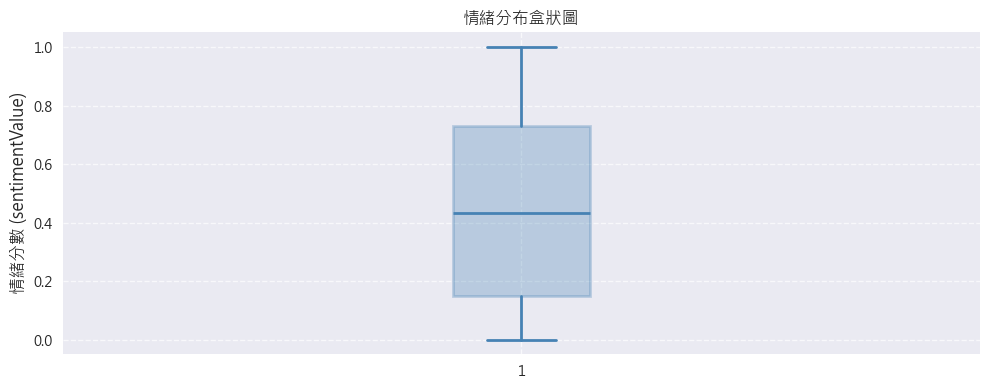

In [ ]:
fig, ax = plt.subplots(figsize=(10, 4))

boxplot = ax.boxplot(
    sentiment_date['sentimentValue'],
    patch_artist=True,  
    showfliers=False   
)

for patch in boxplot['boxes']:
    patch.set_facecolor('#4682B4') 
    patch.set_edgecolor('#4682B4') 
    patch.set_alpha(0.3)
    patch.set_linewidth(2)  
               

for element in ['whiskers', 'caps', 'medians']:
    for item in boxplot[element]:
        item.set_color('#4682B4')    
        item.set_linewidth(2)        

plt.title('情緒分布盒狀圖', fontsize=12)
plt.ylabel('情緒分數 (sentimentValue)', fontsize=12)
plt.grid(True, linestyle='--', alpha=0.7)
plt.tight_layout()

plt.show()

##### SnowNLP_情緒分析_情緒分數折線圖

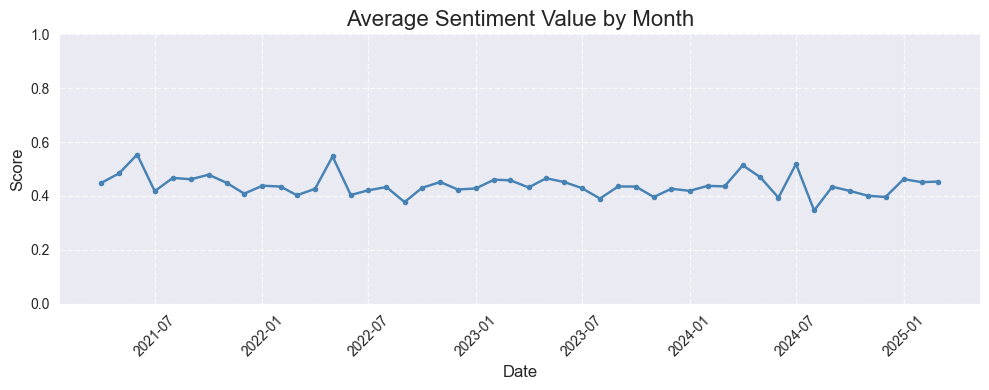

In [ ]:
sent_date = sentiment_date.copy()
sent_date['artDate'] = pd.to_datetime(sentiment_date['artDate']).dt.to_period('M')

sentiment_count = sent_date.groupby(['artDate'])['sentimentValue'].mean().reset_index()


months = [period.to_timestamp() for period in sentiment_count['artDate']] # 平均情緒分數時間趨勢
y = sentiment_count['sentimentValue']

import matplotlib.dates as mdates

plt.figure(figsize=(10, 4)) 
plt.style.use('seaborn-v0_8')

date_format = mdates.DateFormatter('%Y-%m')
plt.plot(months, y, linestyle='solid', color='#4682B4', marker='o', markersize=4)

plt.title('Average Sentiment Value by Month', fontsize=16)
plt.xlabel('Date', fontsize=12)
plt.ylabel('Score', fontsize=12)
plt.gca().xaxis.set_major_formatter(date_format)
plt.xticks(rotation=45, ha='center')
plt.grid(True, linestyle='--', alpha=0.7)
plt.ylim(0, 1)

plt.tight_layout()

plt.show()

從上圖中可見《進擊的巨人》在PTT討論的情緒值大多維持在0.4~0.5之間，在四年的時間軸上沒有出現極端波動，不過仍能觀察到幾個情緒高峰，尤其是2021年初、2022年中和2024年中出現的上揚。整體而言，這樣相對穩定的情緒分佈顯示PTT上的進擊巨人討論社群對作品維持了一貫的溫和態度。

### **4. 文字雲**

##### 文字雲_前處理

我選擇2025-01作為文字雲圖的分析時間節點，即便它在情緒分數的呈現上並不是高峰值，但我們依舊想了解大家對於《進擊的巨人》電影版上映，都有一洩怎麼樣的正面評價。

###### (主要是高峰值做出來的文字雲徒都怪怪的，內容提及許多其他作品，也沒有評價作品的相關形容詞，較難從單一文字雲看出話題的聚焦。)

In [ ]:
filter_sentiment = sent_date[sent_date['artDate']=='2025-01'] # 篩時間
filter_sentiment = filter_sentiment.loc[filter_sentiment['sentimentValue'] > 0.8]

# 把時間分數和之前斷詞的 token table 做 join
pos_words = pd.merge(filter_sentiment,pos_table,on='system_id',how='left')
pos_words = pos_words[['system_id','sentimentValue','word']]
# pos_words

filter_sentiment.head(5)

,system_id,sentence,artDate,dataSource,sentimentValue
12106,630,廳,2025-01,ptt,0.875000
12113,630,命運的抉擇，將於年月日於各大電影院上映，首周還贈送限量特典，更多特典消息,2025-01,ptt,0.968008
12114,630,請關注木棉花社群，進擊的巨人的粉絲千萬不要錯過在電影院體驗這場史詩級的最終,2025-01,ptt,0.932774
12123,631,巨人果然很棒呢,2025-01,ptt,0.920152
12125,631,本身眼睛跟耳朵不夠好,2025-01,ptt,0.957788


##### 文字雲_繪製

In [ ]:
# 自定停用字
with open('dict/stopwords.txt', encoding='utf-8') as f:
    stop_words = f.read().splitlines()
stop_words_pos = stop_words
stop_words_pos.extend((
    '看到','看完','知道','新聞','記者', 'The','the', 'my', 'on','of','from','Sent','一直','一下','根本', '完全','有沒有','現在','一堆','玩具','總動員'
    # 通用中文停用詞
    "的", "是", "在", "了", "和", "就", "也", "很", "這", "那",
    "我", "他", "你", "她", "它", "我們", "他們", "什麼", "怎麼",
    # 情境相關低資訊量詞彙
    "說", "看", "見", "走", "去", "來", "東西", "人", "時間",
    "地方", "有", "沒有", "一個", "一些", "都", "還是", "啊", "吧"))
stop_words_pos = set(stop_words_pos)


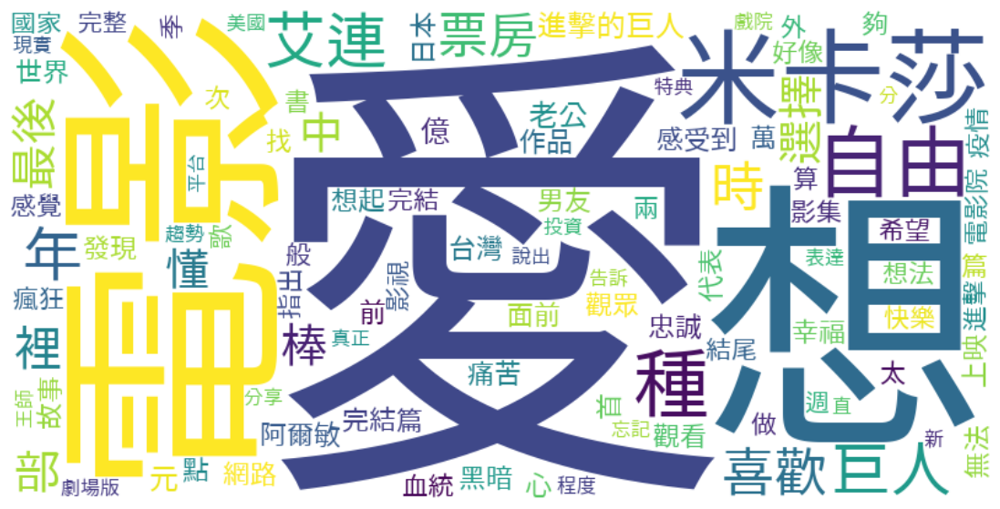

In [ ]:
# 設定中文字形
font_path = 'dict/TaipeiSansTCBeta-Regular.ttf'

# 可以設定字型大小和背景顏色
wordcloud = WordCloud(
                stopwords=stop_words_pos,
                collocations=False,
                font_path=font_path,
                width=800, 
                height = 400, 
                max_words=100, 
                background_color="white")

wordcloud.generate(' '.join(pos_words['word']))
# Display the generated image:
plt.figure(figsize = (14,7))
plt.imshow(wordcloud, interpolation="bilinear")

plt.axis("off")
plt.show()

我們可以看到「愛」、「電影」、「自由」、「票房」和「喜歡」等關鍵字，說明粉絲對於這部作品搬上大螢幕的表現仍是相當滿意的。